In [ ]:
#                                                             COCA COLA

In [1]:
#Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import sys

In [2]:
#Load company financial dataset
data = pd.read_excel("C:/Users/kmate/Desktop/Praca licencjacka/dane/Ameryka/coca_cola_dataset.xlsx")

#Wkradła mi sie niepotrzena kopia jednej kolumny, usuwam ją
data['Rok'] = data['Kwartał'].str[-4:].astype(int)  # Extract last 4 characters as year
data['Q'] = data['Kwartał'].str[1:2].astype(int)  # Extract 2nd character as quarter

import datetime

def quarter_end_date(row):
    year = row['Rok']
    quarter = row['Q']
    month = 3 * quarter
    
    # Calculate the last day of the quarter
    if month == 12:
        quarter_end = datetime.date(year, month, 31)
    else:
        next_month = month + 1
        next_month_start = datetime.date(year, next_month, 1)
        quarter_end = next_month_start - datetime.timedelta(days=1)
    
    return quarter_end
    
data["Date"] = data[["Rok", "Q"]].apply(quarter_end_date, axis=1) 
data = data.set_index('Date')
data['Zysk brutto ze sprzedaży'] = pd.to_numeric(data['Zysk brutto ze sprzedaży'], errors='coerce')
data['EBITDA'] = pd.to_numeric(data['EBITDA'], errors='coerce')
data['Długoterminowe kredyty i pożyczki'] = pd.to_numeric(data['Długoterminowe kredyty i pożyczki'], errors='coerce')
data['Pożyczki krótkoterminowe'] = pd.to_numeric(data['Pożyczki krótkoterminowe'], errors='coerce')
data['Wynik finansowy (zysk / strata)'] = pd.to_numeric(data['Wynik finansowy (zysk / strata)'], errors='coerce')


data_numeric = data.select_dtypes(include=[np.number])
data_numeric = data_numeric.apply(lambda x: x.fillna(x.mean()), axis=0)
data[data_numeric.columns] = data_numeric
#Show dataset information
print("Coca Cola")
print(data.info())

Coca Cola
<class 'pandas.core.frame.DataFrame'>
Index: 73 entries, 2005-12-31 to 2023-12-31
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Indeks                             73 non-null     int64  
 1   Kwartał                            73 non-null     object 
 2   Przychody ogółem                   73 non-null     int64  
 3   Zysk brutto ze sprzedaży           73 non-null     float64
 4   Zysk z działalności operacyjnej    73 non-null     int64  
 5   EBITDA                             73 non-null     float64
 6   Przychody finansowe                73 non-null     int64  
 7   Wydatki finansowe                  73 non-null     int64  
 8   Zysk brutto                        73 non-null     int64  
 9   Aktywa trwałe                      73 non-null     int64  
 10  Aktywa obrotowe                    73 non-null     int64  
 11  Kapitał własny ogółem              73 

In [3]:
describe = data.corr(numeric_only=True)
#describe.to_excel("corr_Coca_Cola.xlsx")
describe

,Indeks,Przychody ogółem,Zysk brutto ze sprzedaży,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Długoterminowe kredyty i pożyczki,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe,Wynik finansowy (zysk / strata),Rok,Q
Indeks,1.000000,-0.255919,-0.322809,-0.181384,-0.256493,-0.061352,0.075155,-0.162849,0.264818,0.228314,0.114102,0.105827,0.222465,-0.063862,0.238680,-0.288764,0.166015,0.998578,0.020823
Przychody ogółem,-0.255919,1.000000,0.812282,0.812021,0.483346,0.340713,-0.782998,0.733415,0.788729,0.810010,0.911702,0.914123,0.828068,0.184974,0.834685,0.399284,0.393071,-0.219780,-0.676233
Zysk brutto ze sprzedaży,-0.322809,0.812282,1.000000,0.628125,0.712537,0.312629,-0.613708,0.546193,0.723321,0.641407,0.705214,0.705450,0.694476,0.123332,0.645678,0.335925,0.013609,-0.292864,-0.559690
Zysk z działalności operacyjnej,-0.181384,0.812021,0.628125,1.000000,0.602561,0.386661,-0.665545,0.959973,0.649318,0.667606,0.752455,0.757030,0.726162,0.012321,0.642599,0.327756,0.413539,-0.152474,-0.541101
EBITDA,-0.256493,0.483346,0.712537,0.602561,1.000000,0.437162,-0.352258,0.604273,0.416850,0.372514,0.394927,0.393349,0.445739,-0.018472,0.332676,0.352416,-0.179029,-0.241387,-0.281793
Przychody finansowe,-0.061352,0.340713,0.312629,0.386661,0.437162,1.000000,-0.128513,0.561600,0.335918,0.316571,0.343088,0.342036,0.339640,0.505141,0.290055,0.052401,0.078511,-0.057595,-0.070098
Wydatki finansowe,0.075155,-0.782998,-0.613708,-0.665545,-0.352258,-0.128513,1.000000,-0.493580,-0.699460,-0.730047,-0.761721,-0.761852,-0.730967,0.194980,-0.751478,-0.272960,-0.267898,0.049688,0.477150
Zysk brutto,-0.162849,0.733415,0.546193,0.959973,0.604273,0.561600,-0.493580,1.000000,0.577424,0.600545,0.684673,0.689583,0.653160,0.164591,0.564267,0.311975,0.437356,-0.138197,-0.461354
Aktywa trwałe,0.264818,0.788729,0.723321,0.649318,0.416850,0.335918,-0.699460,0.577424,1.000000,0.886553,0.926101,0.918454,0.959103,0.098657,0.916472,0.087473,0.247009,0.296636,-0.598225
Aktywa obrotowe,0.228314,0.810010,0.641407,0.667606,0.372514,0.316571,-0.730047,0.600545,0.886553,1.000000,0.923713,0.921119,0.924984,0.092215,0.959473,0.218900,0.348250,0.261613,-0.625804


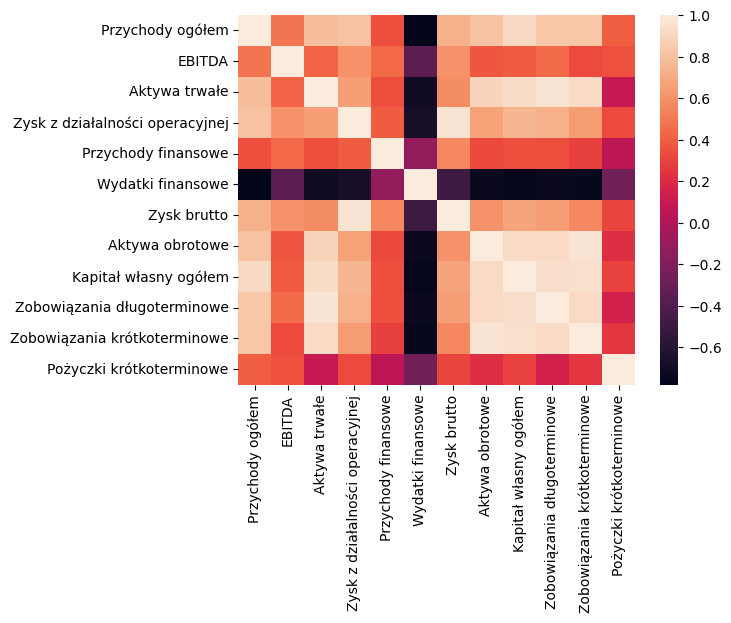

In [4]:
import pandas as pd
corr = data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]]
# Assuming you have a DataFrame called 'df' with relevant columns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


matrix = corr.corr().round(2)
s = sns.heatmap(matrix)
plt.show()

#s.savefig(f"heathmap_Cola.png")

<Figure size 700x1200 with 0 Axes>

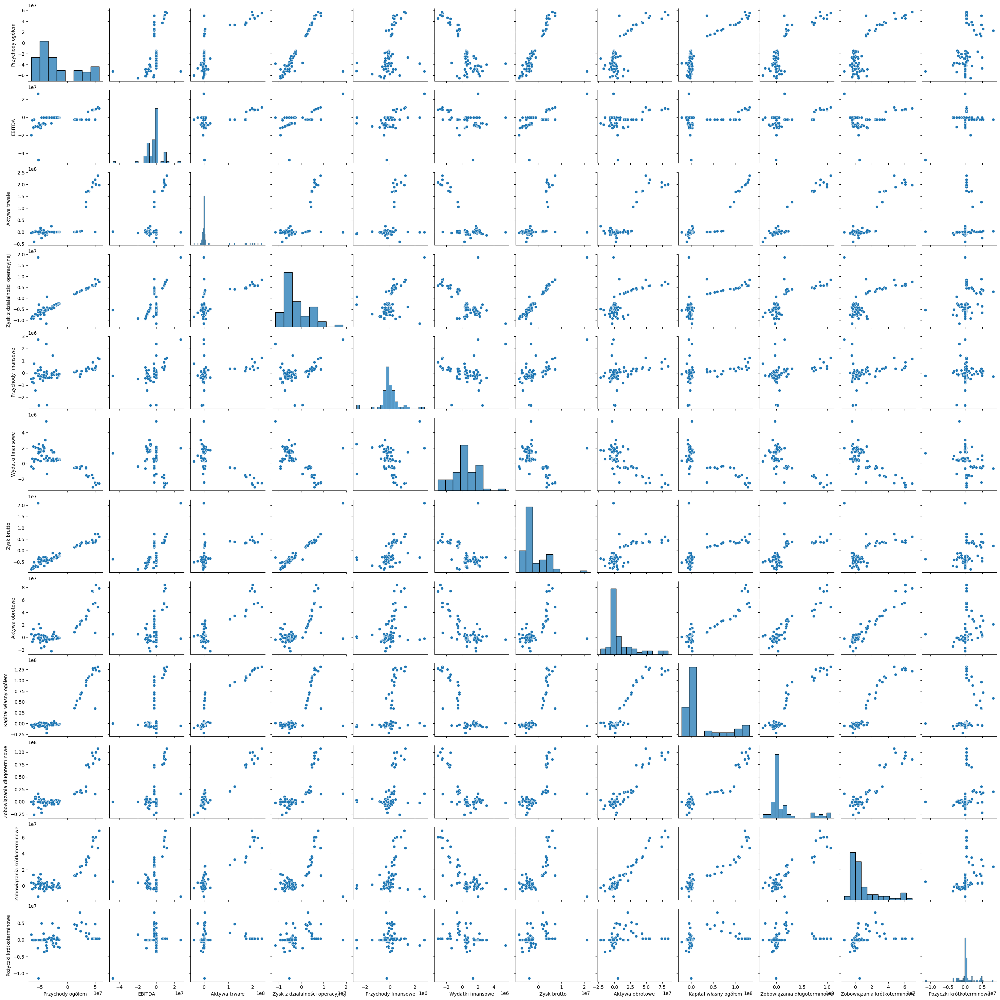

In [7]:
#Żadna ze zmiennych nie posiada wartości pustych. Jest to spowodowane tym, że jeżeli były jakieś braki danych w zbiorze
#Zdecydowałem je zastąpić średnią dla danego okresu, lub zostawić 0 jeżeli żaden z kwartałów nie miał danych
import warnings
warnings.filterwarnings("ignore")

#Zobaczmy sobie wykresy trzech dowolnych zmiennych wexmy na przykład Przychody ogółem, EBITDA oraz Aktywa trwałe. Sprawdźmy czy ich histogramy będą 
#przypominały rozkład normalny.

fig = plt.figure(figsize=(7,12))
pp = sns.pairplot(data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]])

#pp.savefig(f"pp_Cola.png")

In [8]:
def replace_outliers_with_mean(df, columns=None, threshold=3):
    """
    Identify outliers in the DataFrame using Z-score and replace them with the mean.

    Parameters:
    df : pandas DataFrame
        Input DataFrame.
    columns : list or None, optional
        List of columns to check for outliers. If None, all numeric columns will be checked. Default is None.
    threshold : float, optional
        Z-score threshold for identifying outliers. Default is 3.

    Returns:
    cleaned_df : pandas DataFrame
        DataFrame with outliers replaced by the mean.
    """
    # Select columns to check for outliers
    if columns is None:
        columns = df.select_dtypes(include=[np.number]).columns.tolist()

    # Create a copy of the DataFrame
    cleaned_df = df.copy()

    # Iterate over selected columns
    for column in columns:
        # Calculate Z-scores for each data point in the column
        z_scores = np.abs((df[column] - df[column].mean()) / df[column].std())

        # Find indices of outliers
        outlier_indices = z_scores > threshold

        # Replace outliers with the mean
        cleaned_df.loc[outlier_indices, column] = df[column].mean()

    return cleaned_df


data_ = replace_outliers_with_mean(data)


In [5]:
#Widać, że rozkłady tych zmiennych nie przypominają rozkłady Gaussowskie. Upewnijmy sie jeszcze wykonując test na tych zbiorach
#W celu sprawdzenia pochodzenia próby skorzystamy z testu Shapiro-Wilka z biblioteki scipy


def ShaprioWilk(column):
    import scipy.stats as stats
    
    statistic, p_value = stats.shapiro(data[column].to_numpy())
    
    print("Statistic: ", statistic)
    print("P value: ", p_value)
    
    alpha = 0.05
    if p_value > alpha:
        return print(f"The data follow a normal distribution (p-value = {p_value:.4f})")
    else:
        return print(f"The data does not follows a normal distribution (p-value = {p_value:.4f})")




columns = list(data.columns)
columns.remove("Kwartał") #Dane jakosciowe
columns.remove("Indeks") #Nieistotne
columns.remove("Zysk brutto ze sprzedaży")
#columns.remove("Wynik finansowy (zysk / strata)")
columns.remove("Długoterminowe kredyty i pożyczki")
columns.remove("Rok")
columns.remove("Q")
for i in list(columns):
    print()
    print(i)
    print("-------------")
    ShaprioWilk(i)

    
#Zgodnie z wynikiem test próby nie pochodzą z rozkładu normalnego (Gaussa)

#Dla części kolumn policzenie testu było niemozliwe, sprawdźmy dlaczego i poprawmy dane tak, aby nie było żadnego problemu w dalszych krokach analizy


Przychody ogółem
-------------
Statistic:  0.8600209951400757
P value:  9.263310971618921e-07
The data does not follows a normal distribution (p-value = 0.0000)

Zysk z działalności operacyjnej
-------------
Statistic:  0.8921884298324585
P value:  1.3363422112888657e-05
The data does not follows a normal distribution (p-value = 0.0000)

EBITDA
-------------
Statistic:  0.7881789207458496
P value:  7.063134521700931e-09
The data does not follows a normal distribution (p-value = 0.0000)

Przychody finansowe
-------------
Statistic:  0.8247790336608887
P value:  7.267518498110803e-08
The data does not follows a normal distribution (p-value = 0.0000)

Wydatki finansowe
-------------
Statistic:  0.9523048400878906
P value:  0.007718846667557955
The data does not follows a normal distribution (p-value = 0.0077)

Zysk brutto
-------------
Statistic:  0.8306917548179626
P value:  1.088640715352085e-07
The data does not follows a normal distribution (p-value = 0.0000)

Aktywa trwałe
---------

In [ ]:
#Rozłózmy wszystkie szeregi na części pierwsze aby sprawdzić czy wystepuje sezonowość
temporary_ = data.copy()
temporary_ = data.drop(columns=["Indeks","Kwartał","Rok","Q"])

for i in list(temporary_.columns):
    
    from statsmodels.tsa.seasonal import STL
    
    season = data[f"{i}"]
    res = STL(endog=season, period=4).fit()
    res = res.plot()
    #res.savefig(f"{i}_Coca_Cola.png")
    
res.show()

In [19]:
#Ostatecznie po usunięciu zbędnych i wadliwych zmiennych zostało nam ich 12. Jest to wystarczająca liczba aby spróbować wytrenować
# czy dopasować model do tego szeregu. Sprawdźmy teraz jak wygladają te szeregi, czy są stacjonarne, czy wystepuje autokorelacja.
#W pierwszym kroku sprawidzmy działanie regresji liniowej. Następnie wypróbujemy model SARIMAX.
#Po dopasowaniu klasycznych metod ekonometrycznych sprawdzimy efektywność modeli uczenia maszynowego (Random Forest, XGB), a juz na sam koniec zobaczymy
#jak z prognozami radzą sobie sieci neuronowe.

#Z racji, że mam dostęp do wielu zmiennych pozwole sobie na możliwość edycji powyższych planów i czasa

In [ ]:
#Autoregresja

In [8]:
#Sprawdzam stacjonarnosć każdej ze zmiennych

import pandas as pd
from statsmodels.tsa.stattools import adfuller


def adf_test(timeseries):
    # Perform Dickey-Fuller test
    result = adfuller(timeseries)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    if result[1] > 0.05:
        print("Time series is not stationary")
    else:
        print("Time series is stationary")


for i in list(columns):
    print()
    print(i)
    print("-------------")
    adf_test(data[i])



#Żaden z szeregów nie jest stacjonarny według testu ADF, potwierdźmy to testem KPSS


Przychody ogółem
-------------
ADF Statistic: -0.8334248306264904
p-value: 0.8091061070293674
Critical Values:
	1%: -3.542412746661615
	5%: -2.910236235808284
	10%: -2.5927445767266866
Time series is not stationary

Zysk z działalności operacyjnej
-------------
ADF Statistic: -2.390007458298947
p-value: 0.14457661487836232
Critical Values:
	1%: -3.53692771987915
	5%: -2.907887369384766
	10%: -2.591493291015625
Time series is not stationary

EBITDA
-------------
ADF Statistic: -2.488182598006016
p-value: 0.11837616663840927
Critical Values:
	1%: -3.528889992207215
	5%: -2.9044395987933362
	10%: -2.589655654274312
Time series is not stationary

Przychody finansowe
-------------
ADF Statistic: -2.5860212550333
p-value: 0.09592094443584281
Critical Values:
	1%: -3.5386953618719676
	5%: -2.9086446751210775
	10%: -2.591896782564878
Time series is not stationary

Wydatki finansowe
-------------
ADF Statistic: -1.3855963915563976
p-value: 0.5891615793225491
Critical Values:
	1%: -3.5352168748

In [9]:
import pandas as pd
from statsmodels.tsa.stattools import kpss
import warnings
warnings.filterwarnings("ignore")

def kpss_test(timeseries):
    # Perform KPSS test
    result = kpss(timeseries)
    print('KPSS Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print(f'\t{key}: {value}')
    if result[1] > 0.05:
        print("Time series is stationary")
    else:
        print("Time series is not stationary")


for i in list(columns):
    print()
    print(i)
    print("-------------")
    kpss_test(data[i])


#Obydwa testy wykazały brak stacjoanrności zmiennych, zróżnicujmy je i sprawdzmy założenie jeszcze raz


Przychody ogółem
-------------
KPSS Statistic: 0.4863318956526438
p-value: 0.044745068546701856
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Zysk z działalności operacyjnej
-------------
KPSS Statistic: 0.3304891364886346
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

EBITDA
-------------
KPSS Statistic: 0.603851942282498
p-value: 0.022286187065227447
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Przychody finansowe
-------------
KPSS Statistic: 0.3022292936488556
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

Wydatki finansowe
-------------
KPSS Statistic: 0.19125285437566564
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

Zysk brutto
-------------
KPSS Statistic: 0.24021556963342286
p-value: 0.1
Critical Values:
	10%: 

In [10]:
#Zróżnicowany dataframe
import warnings
warnings.filterwarnings("ignore")

mol = data.drop(columns=["Kwartał", "Indeks",  "Rok", "Q"])
mol_diff = mol.diff()
mol_diff = mol_diff.dropna()

#Sprawdzmy stacjonarnosc

#ADF i KPSS
for i in list(columns):
    print()
    print(i)
    print("-------------")
    adf_test(mol_diff[i])
    kpss_test(mol_diff[i])



#Po róznicowaniu wszystkie szeregi wykazują stacjoanrnosć będąc badanym zarówno testem ADF jak i KPSS,
#Teraz przejdę do badania stopnia autokorelacji


Przychody ogółem
-------------
ADF Statistic: -2.89637118099532
p-value: 0.04577160998640594
Critical Values:
	1%: -3.542412746661615
	5%: -2.910236235808284
	10%: -2.5927445767266866
Time series is stationary
KPSS Statistic: 0.1641388276174014
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

Zysk z działalności operacyjnej
-------------
ADF Statistic: -4.475646330712385
p-value: 0.00021755413912150147
Critical Values:
	1%: -3.542412746661615
	5%: -2.910236235808284
	10%: -2.5927445767266866
Time series is stationary
KPSS Statistic: 0.24890960825053238
p-value: 0.1
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is stationary

EBITDA
-------------
ADF Statistic: -4.6405796005066815
p-value: 0.00010866048669876077
Critical Values:
	1%: -3.542412746661615
	5%: -2.910236235808284
	10%: -2.5927445767266866
Time series is stationary
KPSS Statistic: 0.2599838344355051
p-value: 0.1
Critical Values:
	10%: 0.347

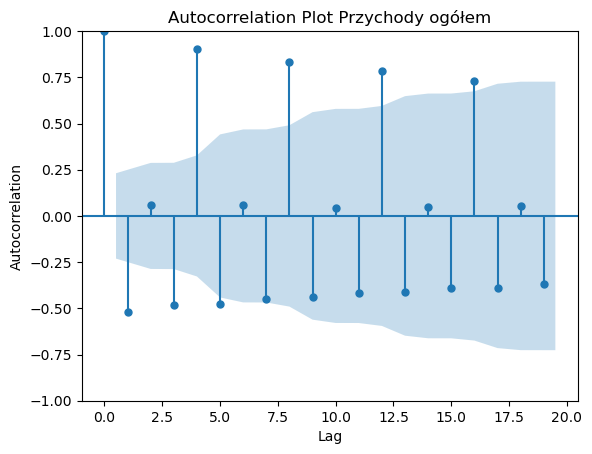

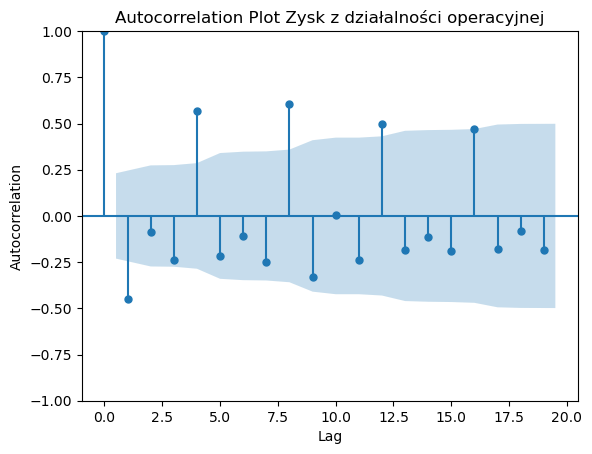

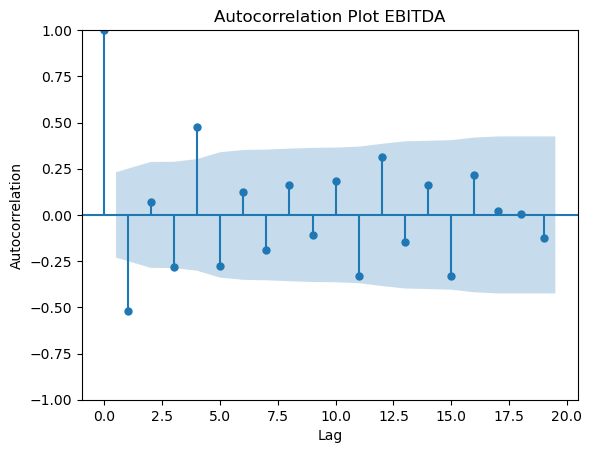

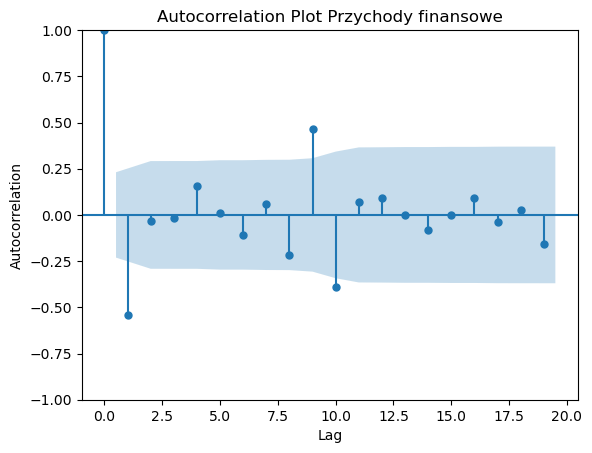

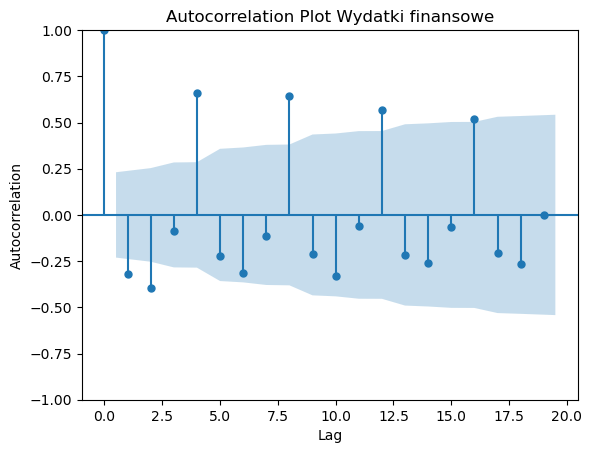

...

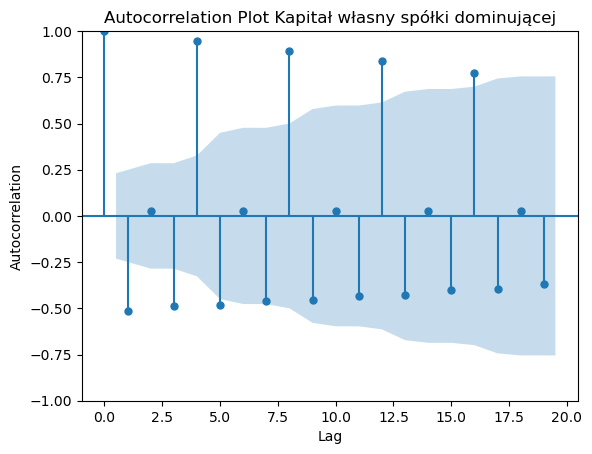

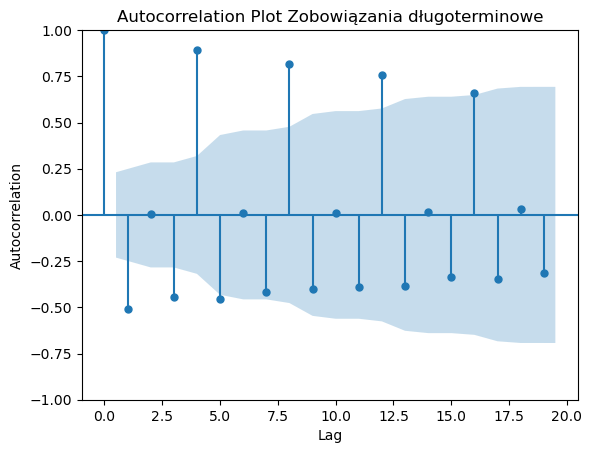

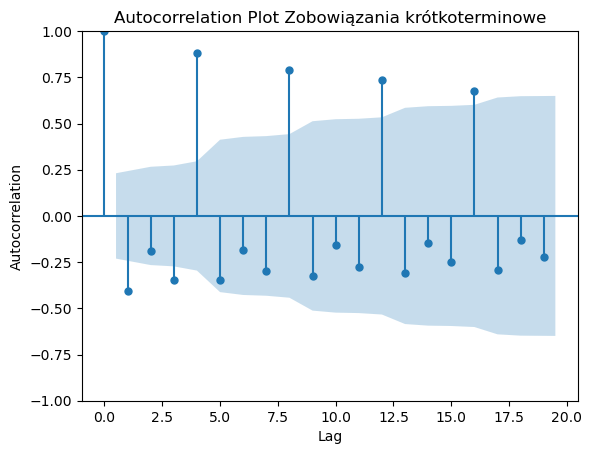

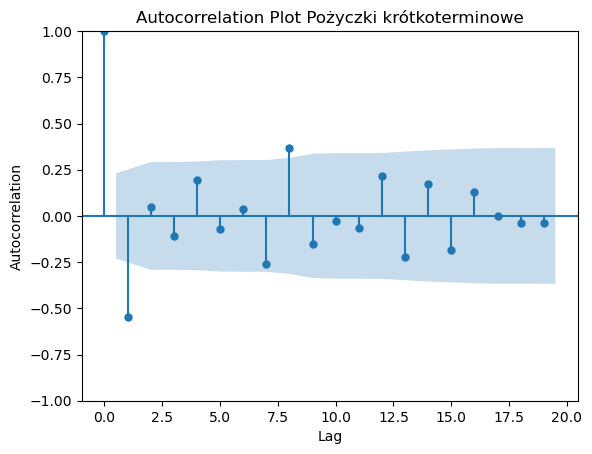

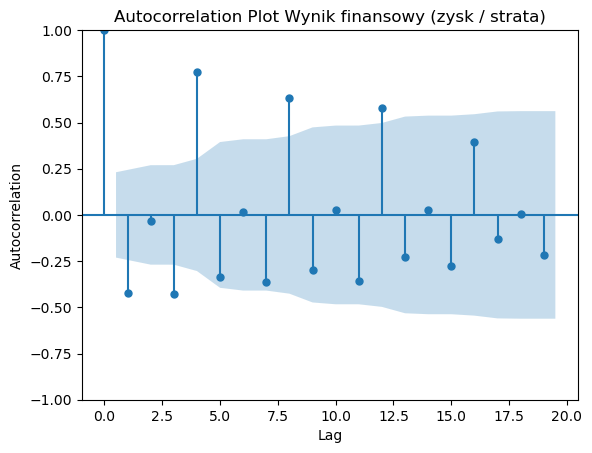

In [11]:
#Sprawdzam autokorelacje każdej ze zmiennych
import warnings
warnings.filterwarnings("ignore")


#ACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf


for i in list(columns):
    acf = plot_acf(mol_diff[i])
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation Plot {i}')
    #acf.savefig(f"{i}_acf_Cola.png")


    
plt.show()



#Zróbmy liste opóźnien dla każdej ze zmiennych:

#Przychody ogółem: 1,3,5,7,9,11,13,15,17
#Zysk z działalności operacyjnej: 1,3,5,7,9,11,13,15,17
#EBITDA: 1,3,5,7,9,11,13,15,17
#Przychody finansowe: 1,2,3
#Wydatki finansowe: 1,2,3,7,11
#Zysk brutto: 1,3,5
#Aktywa trwałe: 1,5,8
#Aktywa obrotowe: 1,5
#Kapitał własny ogółem: 1,2,3,4,5
#Zobowiązania długoterminowe: 1
#Zobowiązania krótkoterminowe:1
#Pożyczki krótkoterminowe: 1

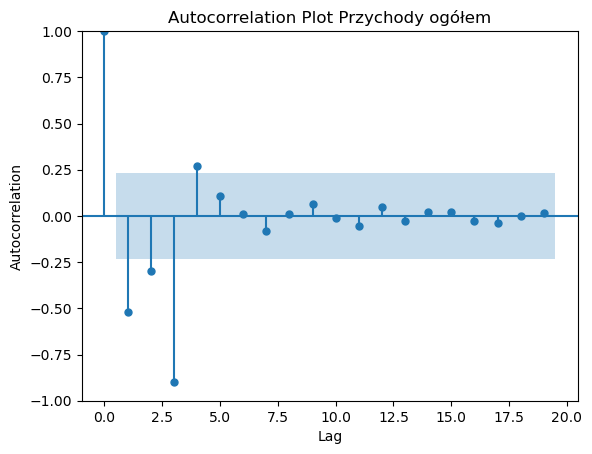

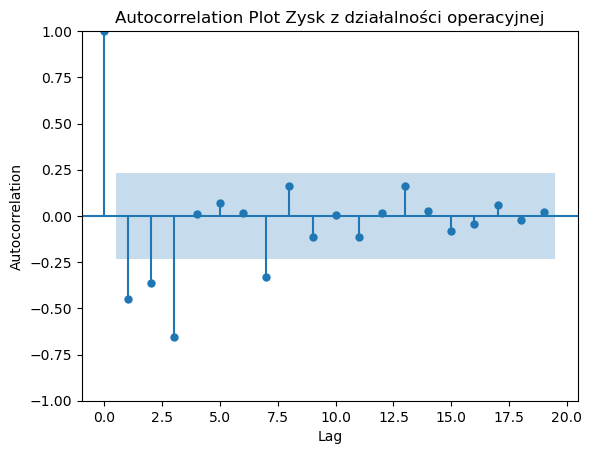

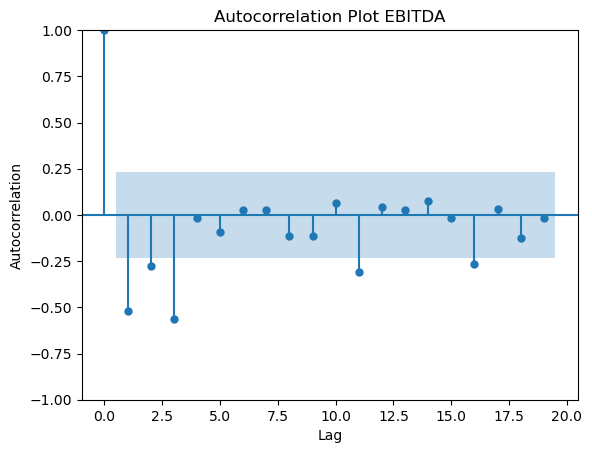

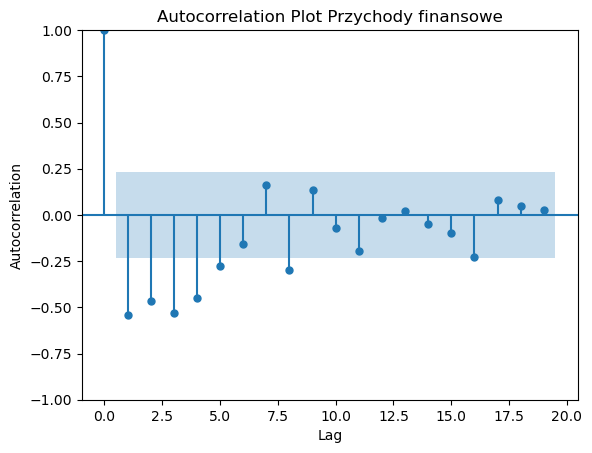

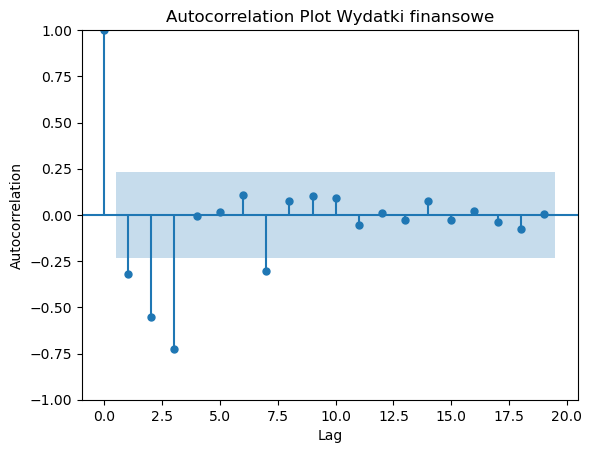

...

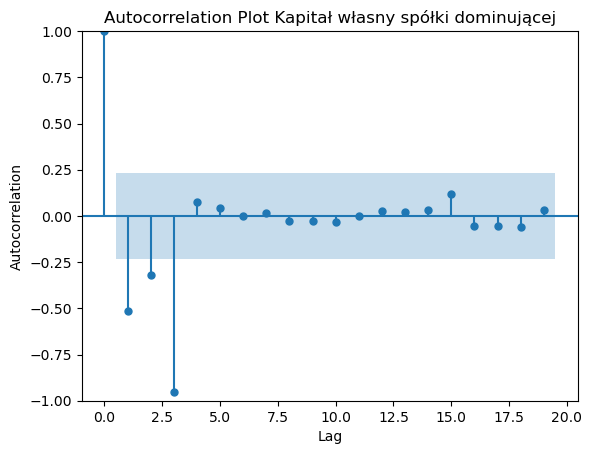

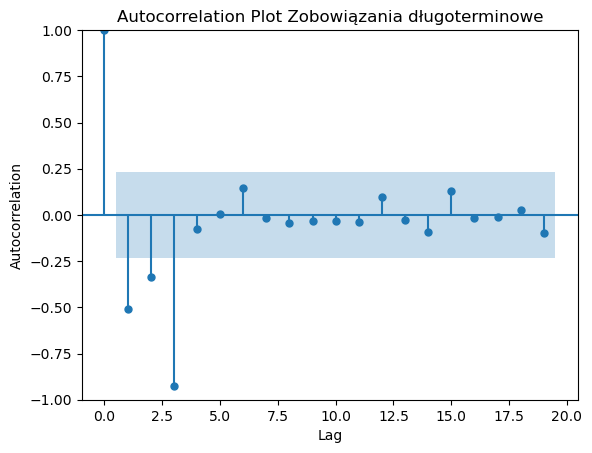

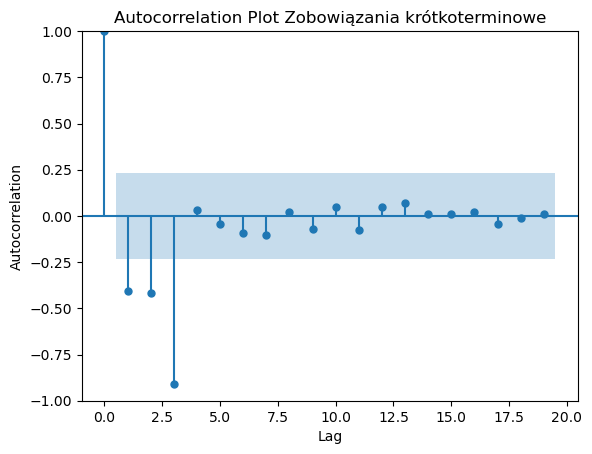

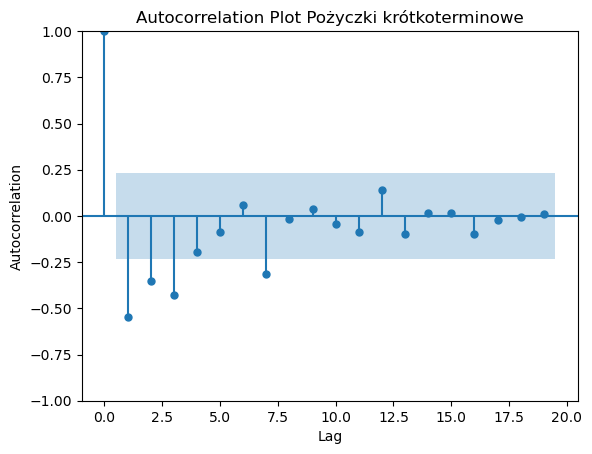

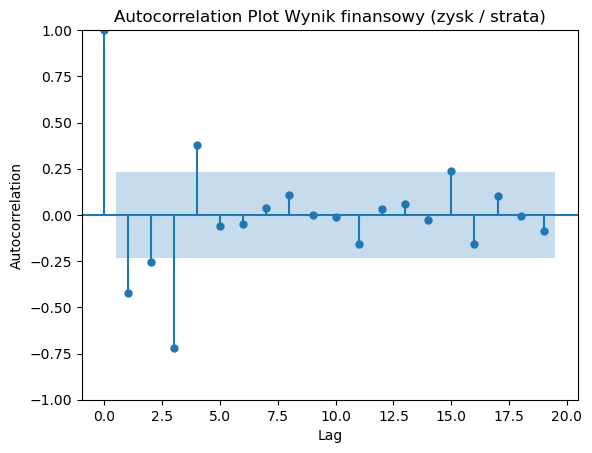

In [12]:

#PACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf


for i in list(columns):
    pacf = plot_pacf(mol_diff[i])
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation Plot {i}')
    #pacf.savefig(f"{i}_pacf_Cola.png")


    
plt.show()

#Zróbmy liste opóźnien dla każdej ze zmiennych:

#Przychody ogółem: 4
#Zysk z działalności operacyjnej: 2,3
#EBITDA: 2,3
#Przychody finansowe: 1
#Wydatki finansowe: 1,3
#Zysk brutto: 1,3,4
#Aktywa trwałe: 2
#Aktywa obrotowe: 1
#Kapitał własny ogółem: 1
#Zobowiązania długoterminowe: 1,2
#Zobowiązania krótkoterminowe:1
#Pożyczki krótkoterminowe: 1,2,3,5

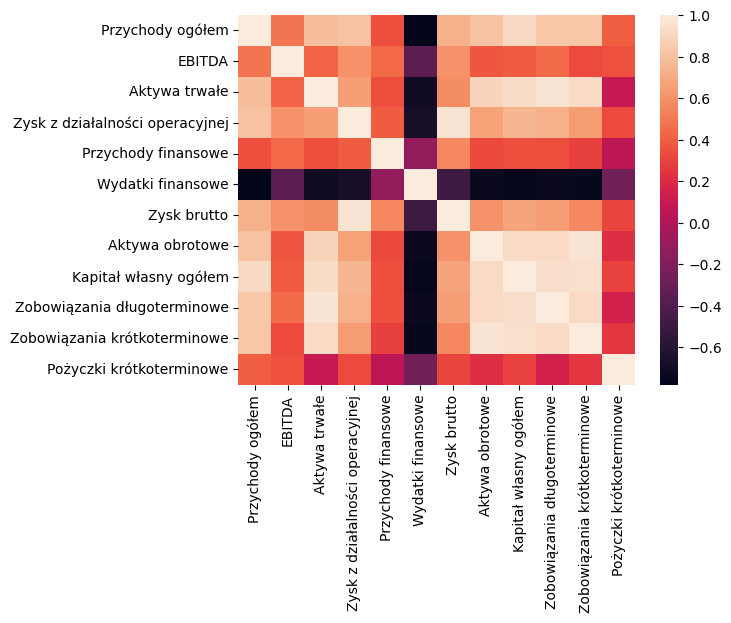

In [20]:
#Correlation
import pandas as pd
corr = data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]]
# Assuming you have a DataFrame called 'df' with relevant columns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


matrix = corr.corr().round(2)
s = sns.heatmap(matrix)
plt.show()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 27, May, 2024
Time:                     23:35:04
--------------------------------------------------------------------
No. of Equations:         16.0000    BIC:                   -457.118
Nobs:                     40.0000    HQIC:                  -478.251
Log likelihood:           9680.28    FPE:               9.95712e-215
AIC:                     -490.220    Det(Omega_mle):    2.75965e-220
--------------------------------------------------------------------
Results for equation Przychody ogółem
                                          coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------------------
const                                        0.000058         0.597579            0.000           1.000
L1.Przychody ogółem                          0.708651        

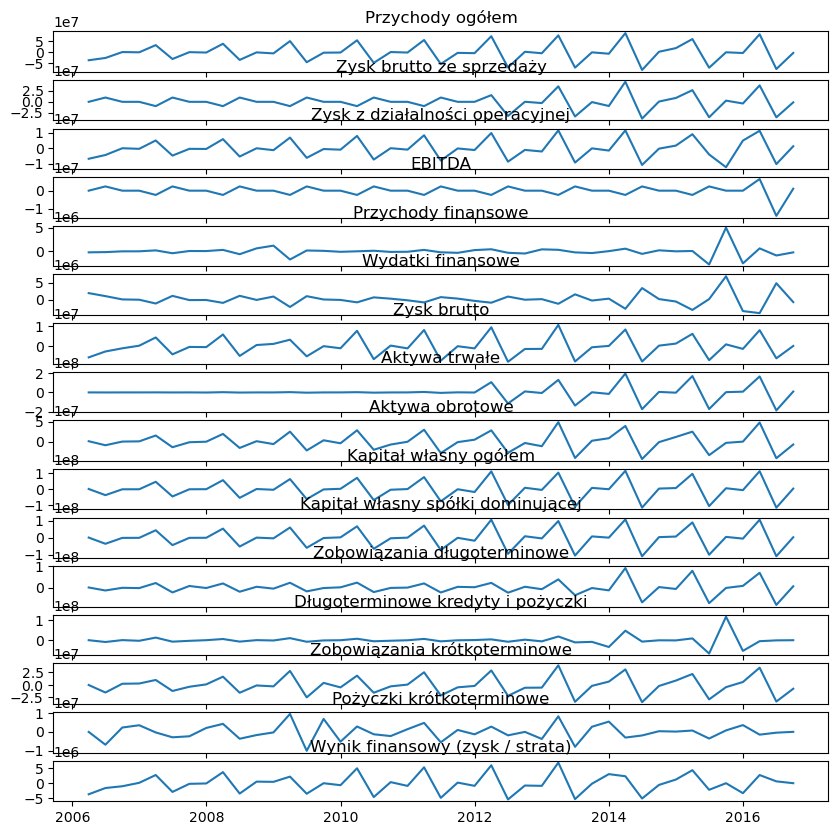

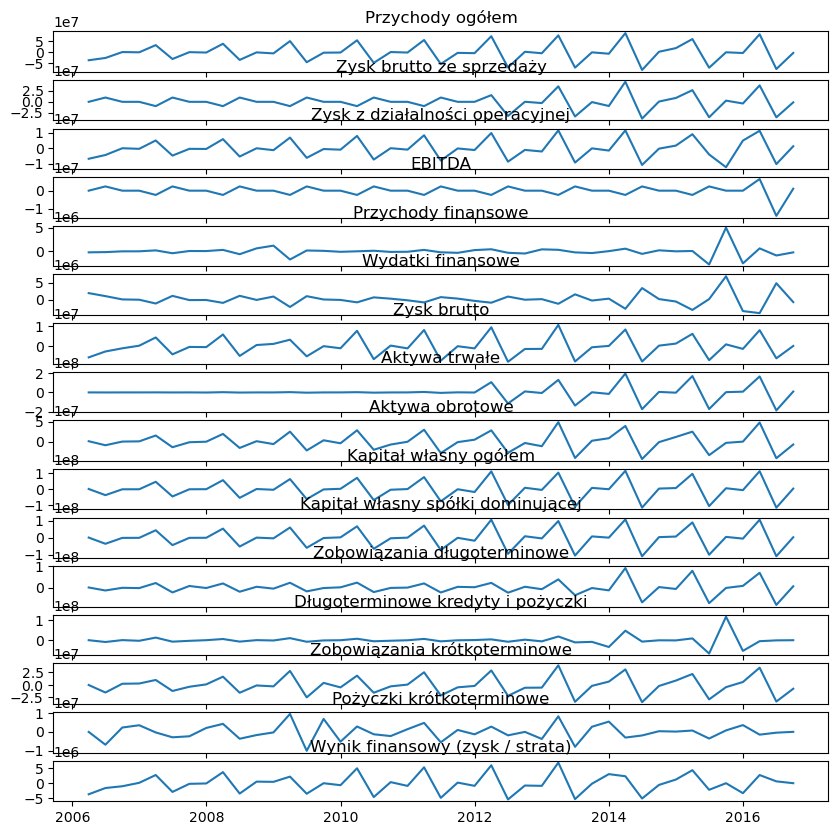

In [13]:
#VAR

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
from statsmodels.tsa.api import VAR
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tools.eval_measures import rmse


#Dziele zbiór danych za część treningową i testową
train = mol_diff[:43]
test = mol_diff[43:]

#Dopasujmy model VAR i wybierzmy ten, który ma najlepszy AIC 

model = VAR(train)
results = model.fit(maxlags=3)

#Sprawdzam podsumowanie
print(results.summary())

results.plot()

Przychody ogółem


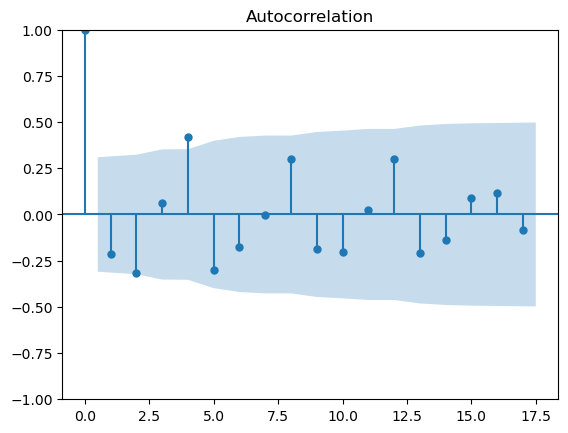

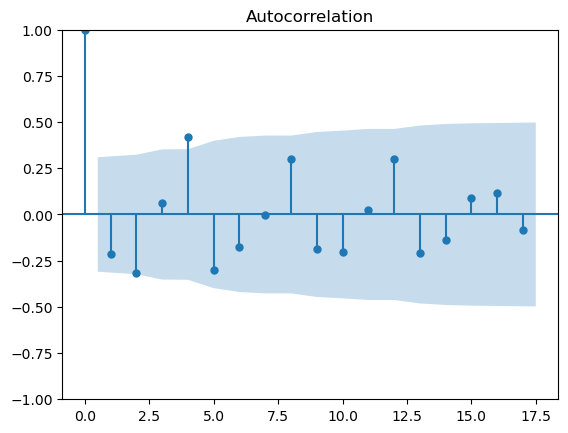

Zysk brutto ze sprzedaży


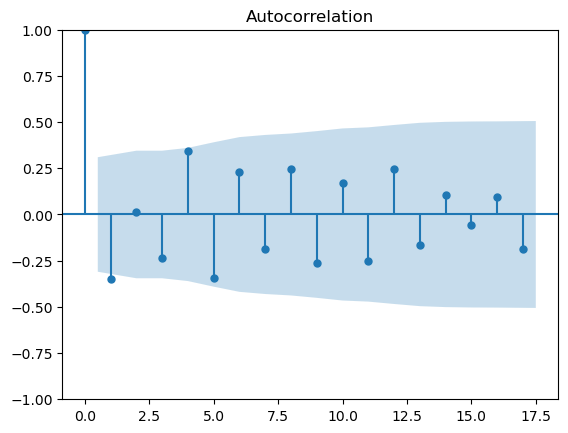

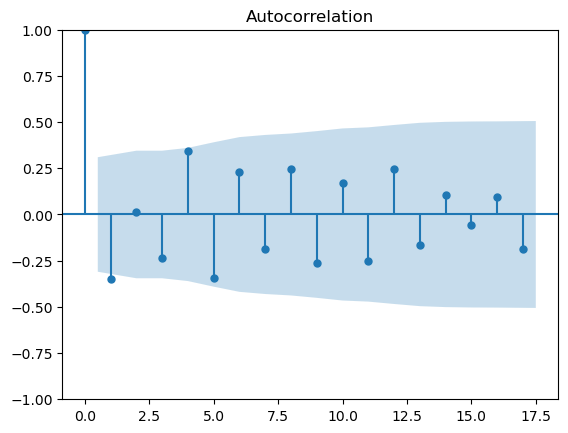

Zysk z działalności operacyjnej


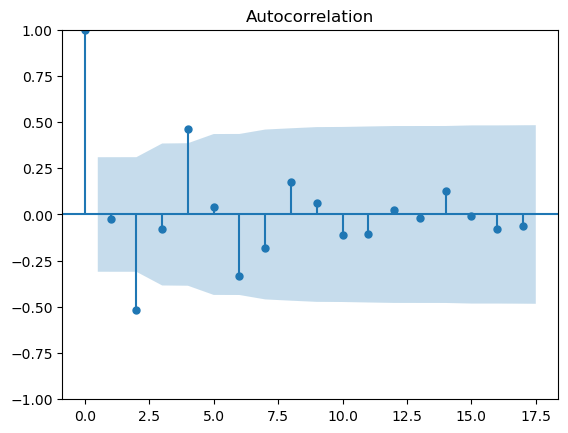

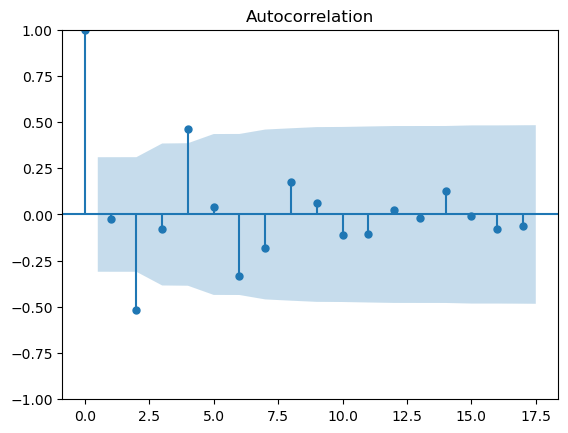

EBITDA


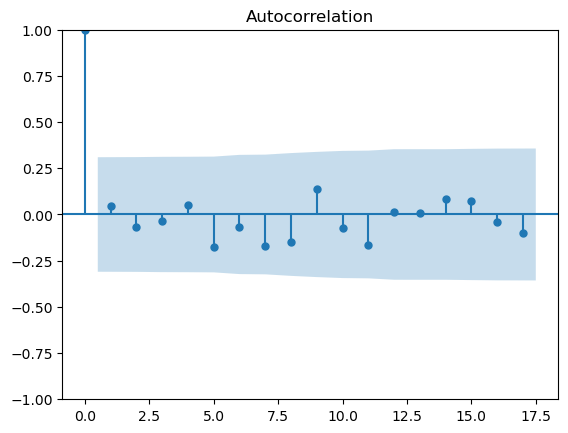

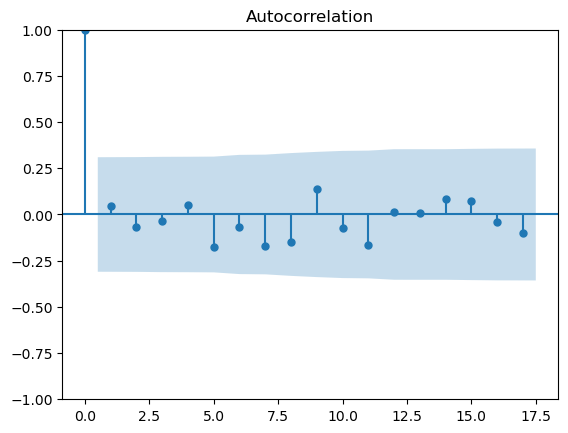

Przychody finansowe


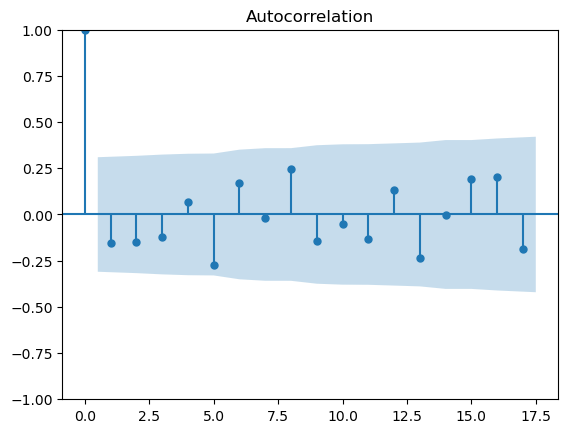

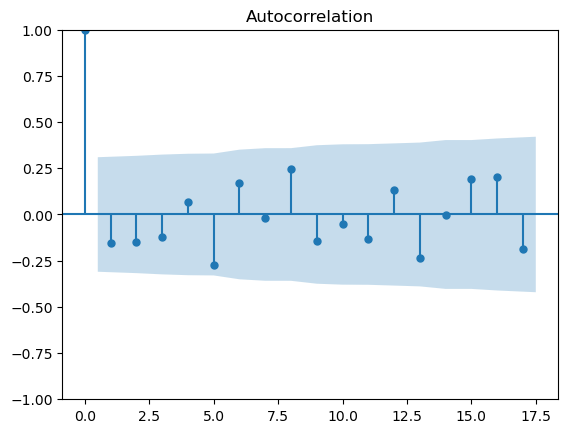

Wydatki finansowe


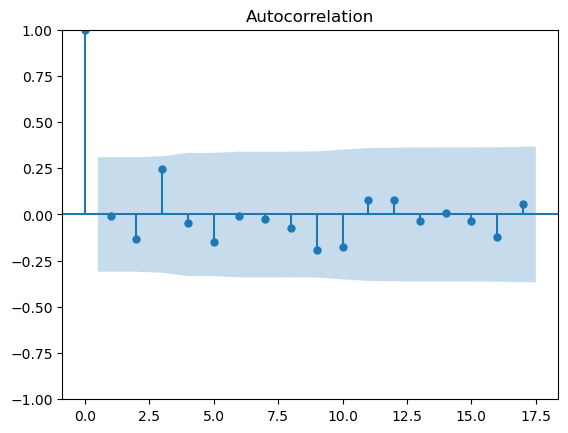

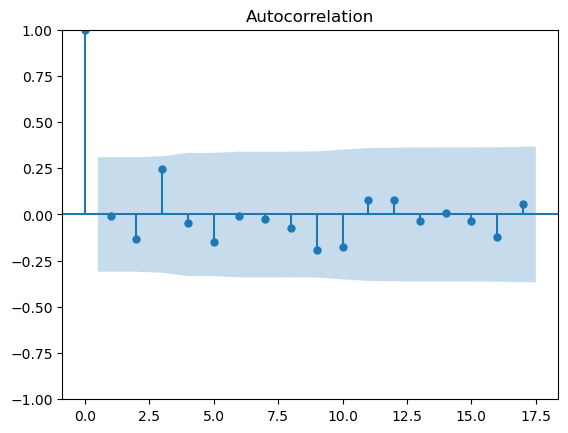

Zysk brutto


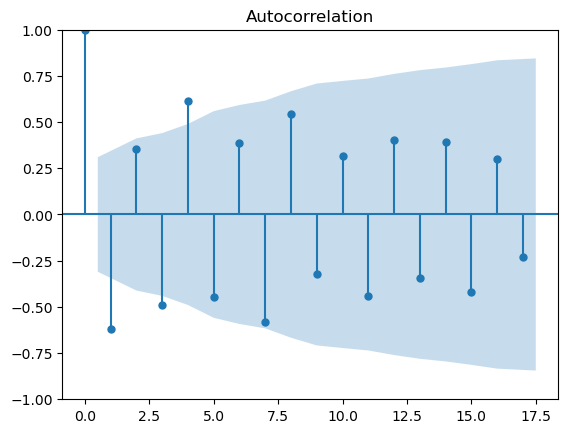

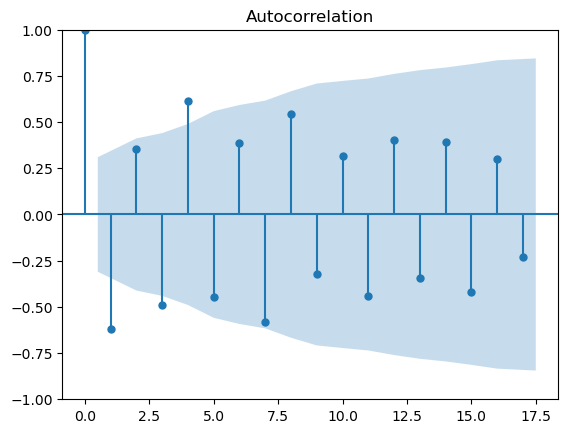

Aktywa trwałe


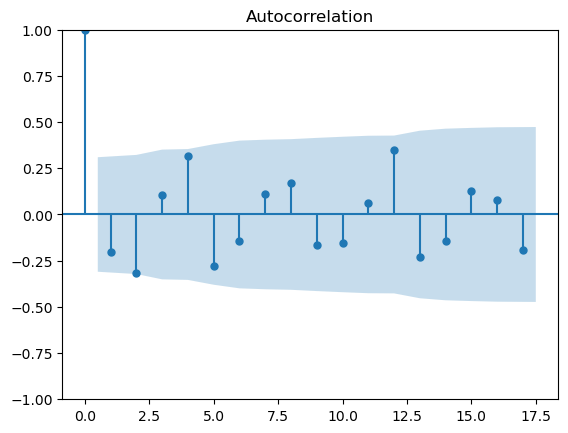

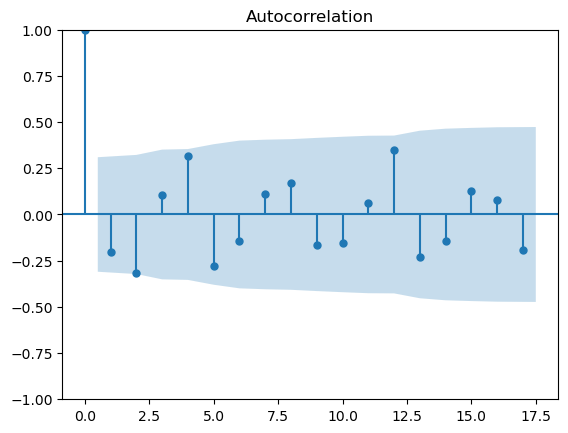

Aktywa obrotowe


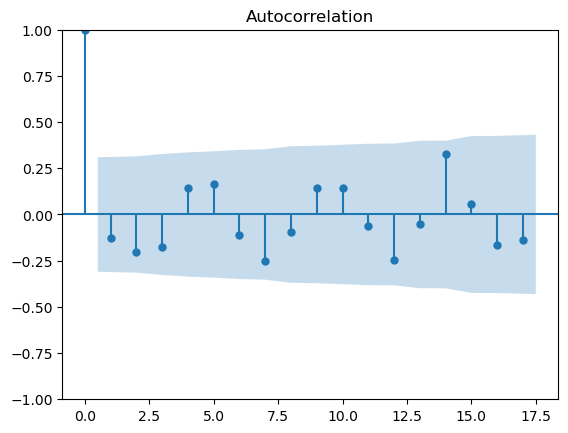

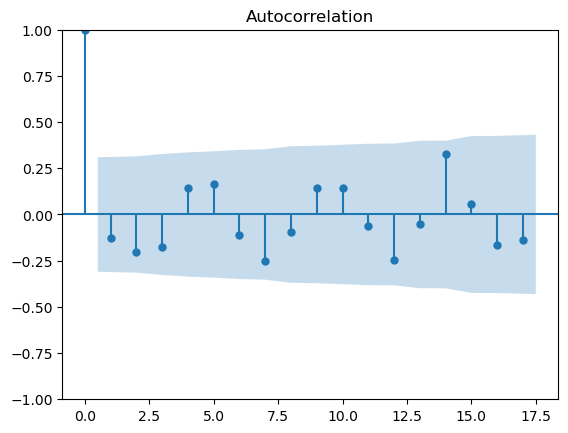

Kapitał własny ogółem


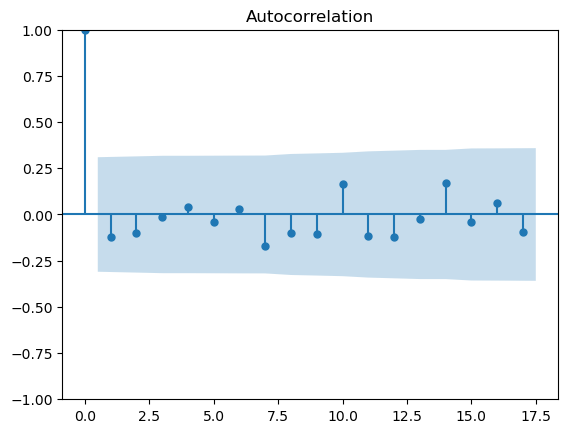

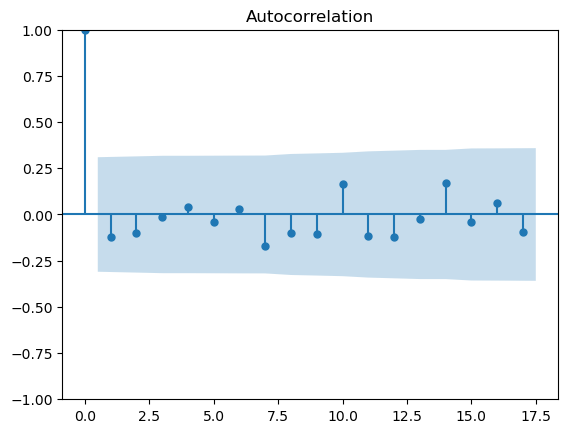

Kapitał własny spółki dominującej


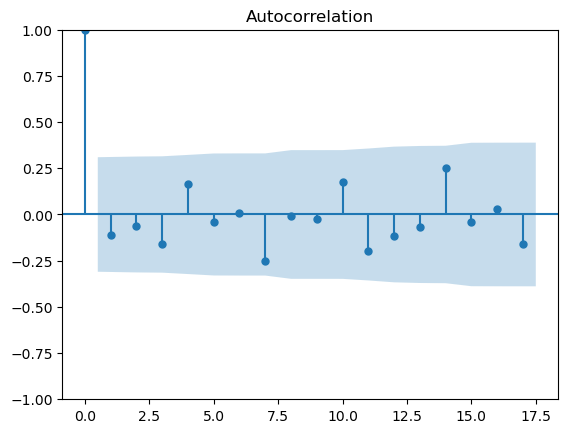

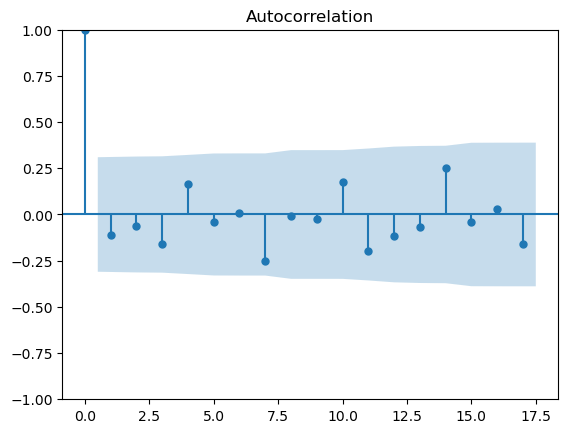

Zobowiązania długoterminowe


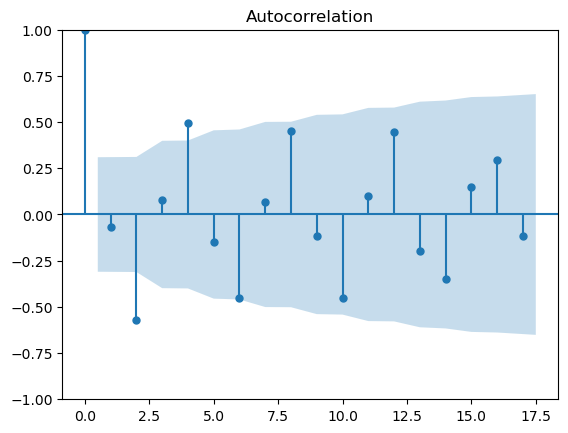

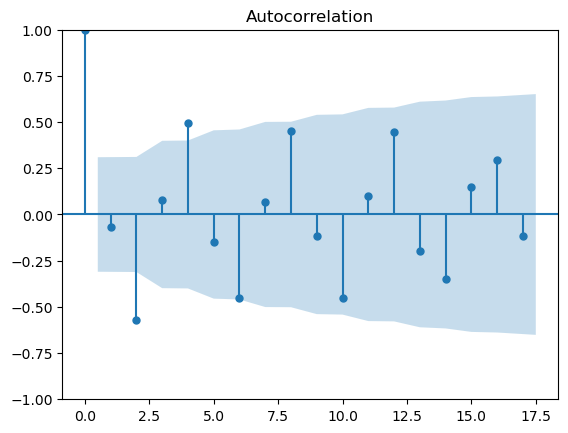

Długoterminowe kredyty i pożyczki


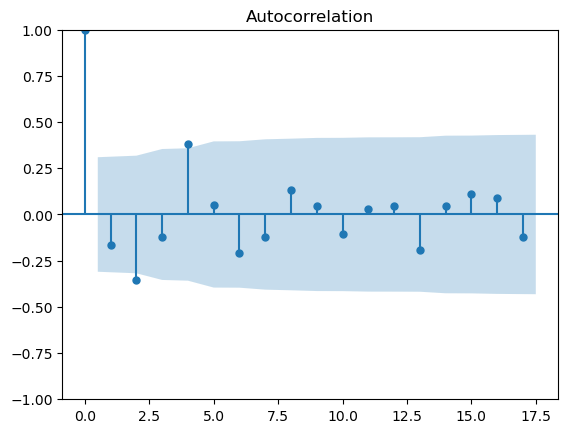

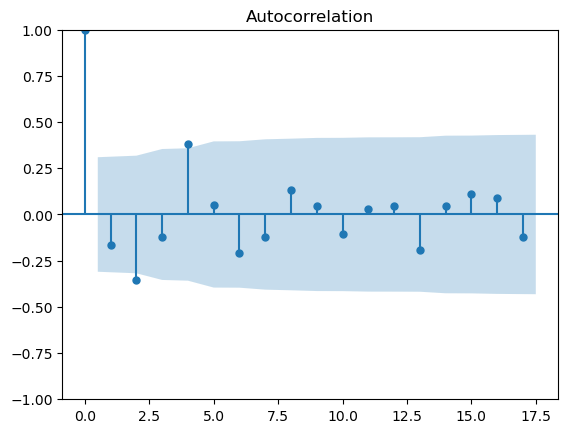

Zobowiązania krótkoterminowe


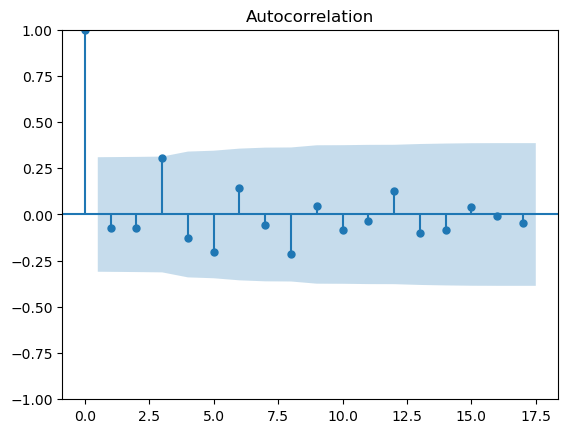

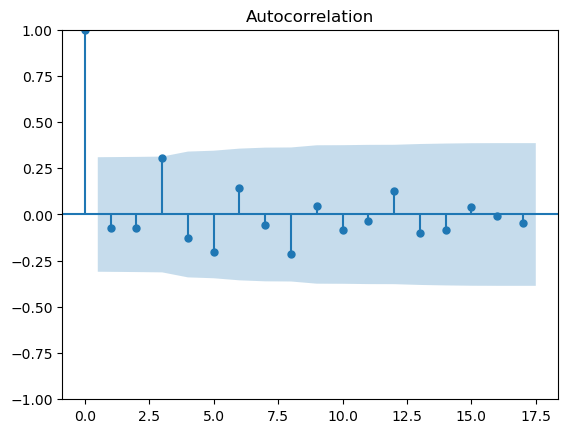

Pożyczki krótkoterminowe


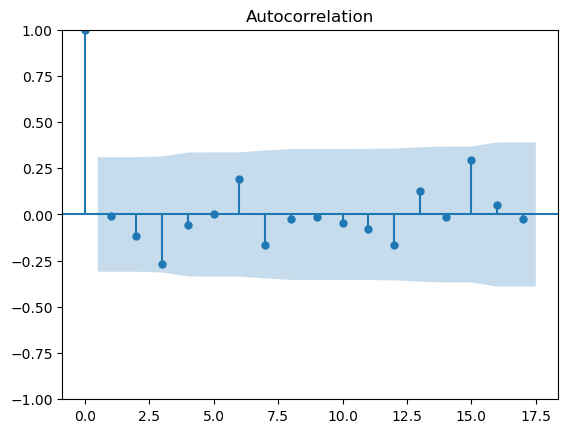

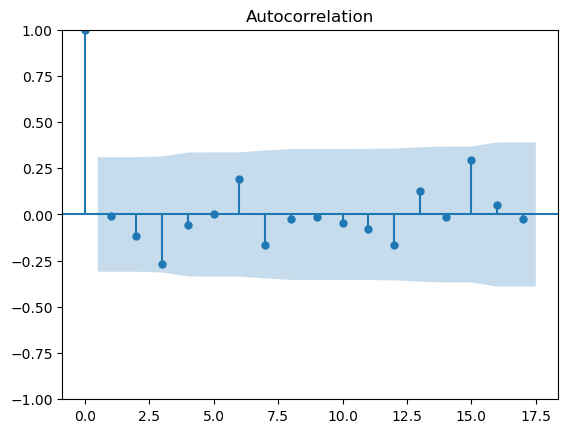

Wynik finansowy (zysk / strata)


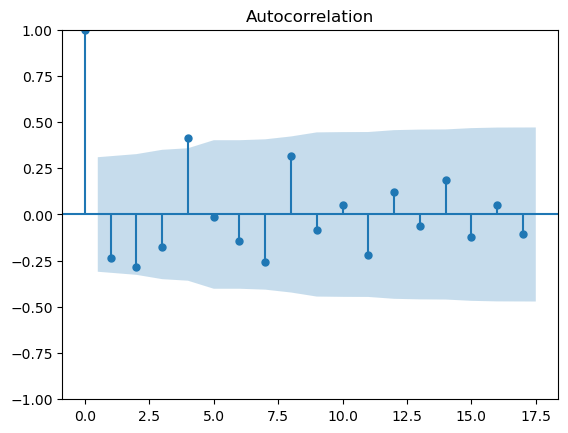

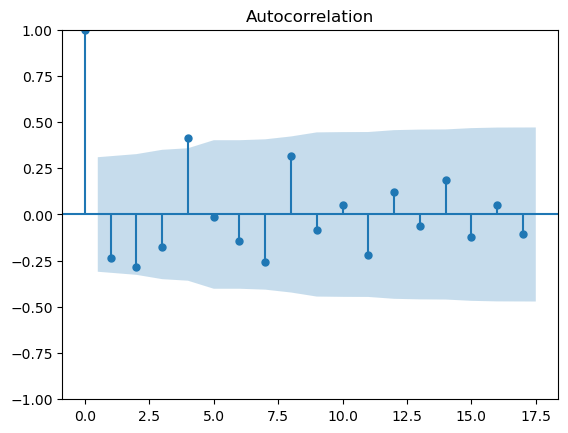

In [22]:
#Sprawdzmy czy reszty modelu wykazują autokroelacje

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


for i in list(results.resid.columns):
# Plot ACF and PACF of residuals
    print(f"{i}")
    plot_acf(results.resid[f"{i}"])
    plot_acf(results.resid[f"{i}"])
    plt.show()


#Na podstawie poniższych wykresów mozna stwierdzić, że nie występuje autokorelacja reszt, a zatem wszystkie zleżności liniowe zostały wyjąsnione

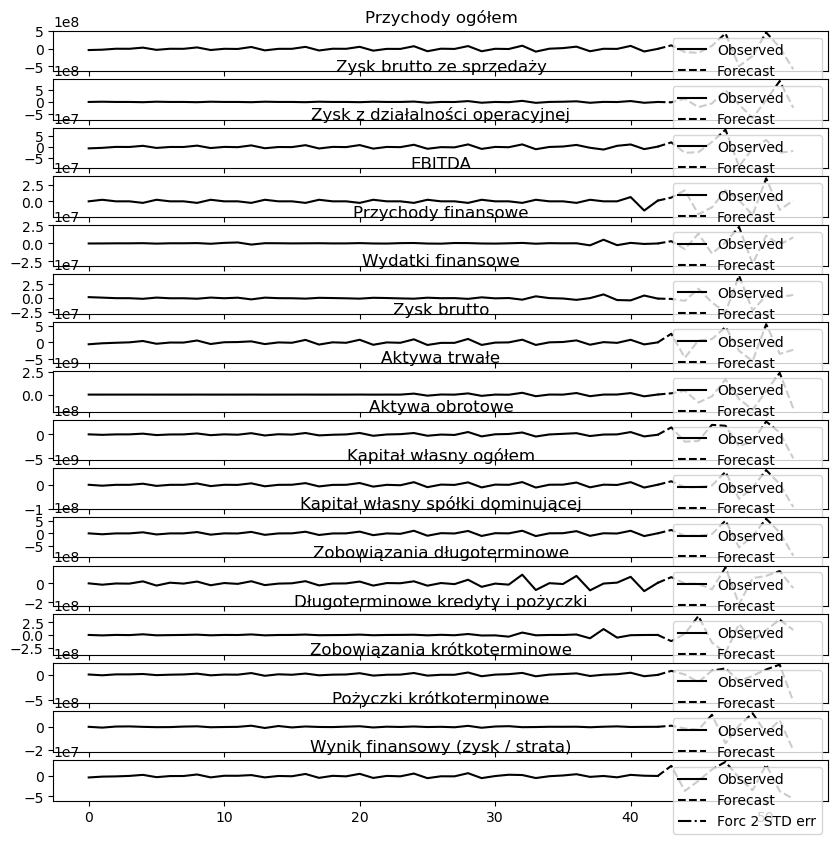

In [37]:
#Prognozy in sample

lag_order = results.k_ar
forc = results.forecast(train.values[-lag_order:], 5)
results.plot_forecast(10)

columns = list(train.columns)
index = [44,45,46,47,48]

forecast = pd.DataFrame(data = forc)
forecast.columns = train.columns
forecast.index = index
test_5 = test[:5]


In [14]:
# Make predictions on the test data

import pandas as pd
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Calculates Mean Absolute Percentage Error (MAPE).

    Parameters:
    y_true : pandas.Series
        Actual values.
    y_pred : pandas.Series
        Forecasted values.

    Returns:
    mape : float
        MAPE value.
    """

    df = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred})
    df = df[df['y_true'] != 0]  # Exclude zero entries to avoid division by zero
    mape = np.mean(np.abs((df['y_true'] - df['y_pred']) / df['y_true'])) * 100
    return mape



forecast = results.forecast(results.endog, steps=len(test))

# Convert the forecast array to a DataFrame for easier manipulation
forecast_df = pd.DataFrame(forecast, index=test.index, columns=test.columns)

# Calculate residuals
residuals = test - forecast_df

# Calculate RMSE for each variable
rmse_values = rmse(test, residuals, axis=0)

# Calculate PMSE for each variable
pmse_values = (residuals ** 2).mean()

# Print RMSE and PMSE for each variable
print("RMSE:")
print(rmse_values)
for column in test.columns:
    mape = mean_absolute_percentage_error(test[column], forecast_df[column])
    print(f"MAPE for {column}: {round(mape, 2)}%")


#Oceniając model na podstawie błędów prognoz można stwierdzić, że model słabo stawia prognozy,
#ponieważ odchylenia wartości rzeczywistych od modelowych są bardzo duże


RMSE:
[4.92277282e+09 2.54299567e+09 9.82560941e+08 3.09893634e+08
 3.18758233e+08 3.65202026e+08 1.06478501e+09 8.76239095e+09
 3.52600227e+09 5.16754128e+09 4.95653435e+09 2.02258808e+09
 5.96355138e+09 1.24186500e+09 1.44908166e+09 7.71863759e+08]
MAPE for Przychody ogółem: 175916.86%
MAPE for Zysk brutto ze sprzedaży: 73186.43%
MAPE for Zysk z działalności operacyjnej: 5297507.4%
MAPE for EBITDA: 8603.7%
MAPE for Przychody finansowe: 62082.05%
MAPE for Wydatki finansowe: 33350.35%
MAPE for Zysk brutto: 57603.57%
MAPE for Aktywa trwałe: 221935.36%
MAPE for Aktywa obrotowe: 53328.54%
MAPE for Kapitał własny ogółem: 49413.12%
MAPE for Kapitał własny spółki dominującej: 81079.11%
MAPE for Zobowiązania długoterminowe: 189688.37%
MAPE for Długoterminowe kredyty i pożyczki: 405985.78%
MAPE for Zobowiązania krótkoterminowe: 14278.27%
MAPE for Pożyczki krótkoterminowe: 103220.14%
MAPE for Wynik finansowy (zysk / strata): 16379.73%


In [15]:
#Random Forest

random_forest_mol = data
#Dostosowanie danych

#random_forest_mol['Rok'] = random_forest_mol['Kwartał'].str[-4:]  # Extract last 4 characters as year
#random_forest_mol['Q'] = random_forest_mol['Kwartał'].str[1:2]  # Extract 2nd character as quarter
#random_forest_mol['Q'] = pd.to_numeric(random_forest_mol['Kwartał'], errors='coerce').fillna(0).astype(int)
#random_forest_mol = random_forest_mol["Rok"].astype(int)



random_forest_mol = random_forest_mol.drop(columns=["Indeks", "Kwartał", "Q", "Rok"])


random_forest_mol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 73 entries, 2005-12-31 to 2023-12-31
Data columns (total 16 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Przychody ogółem                   73 non-null     int64  
 1   Zysk brutto ze sprzedaży           73 non-null     float64
 2   Zysk z działalności operacyjnej    73 non-null     int64  
 3   EBITDA                             73 non-null     float64
 4   Przychody finansowe                73 non-null     int64  
 5   Wydatki finansowe                  73 non-null     int64  
 6   Zysk brutto                        73 non-null     int64  
 7   Aktywa trwałe                      73 non-null     int64  
 8   Aktywa obrotowe                    73 non-null     int64  
 9   Kapitał własny ogółem              73 non-null     int64  
 10  Kapitał własny spółki dominującej  73 non-null     int64  
 11  Zobowiązania długoterminowe        73 non-null  

                                     SARIMAX Results                                      
Dep. Variable:                   Przychody ogółem   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -786.108
Date:                            Thu, 16 May 2024   AIC                           1588.216
Time:                                    11:53:10   BIC                           1602.306
Sample:                                03-31-2006   HQIC                          1593.412
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0216      0.113     -9.026      0.000      -1.243      -0.800
ar.L2         -1.2002      0.090   

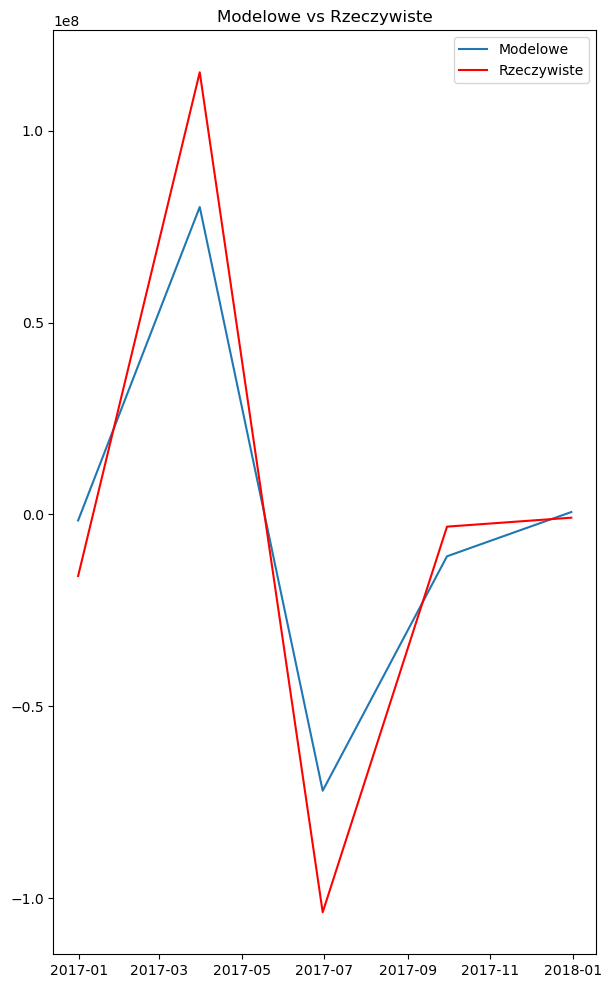

Błąd średniokwadratowy (MSE):  502038485185752.5
MAPE:  113.28 %
                                     SARIMAX Results                                      
Dep. Variable:           Zysk brutto ze sprzedaży   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -741.998
Date:                            Thu, 16 May 2024   AIC                           1499.996
Time:                                    11:53:10   BIC                           1514.085
Sample:                                03-31-2006   HQIC                          1505.192
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9160      0.207     -4.431      

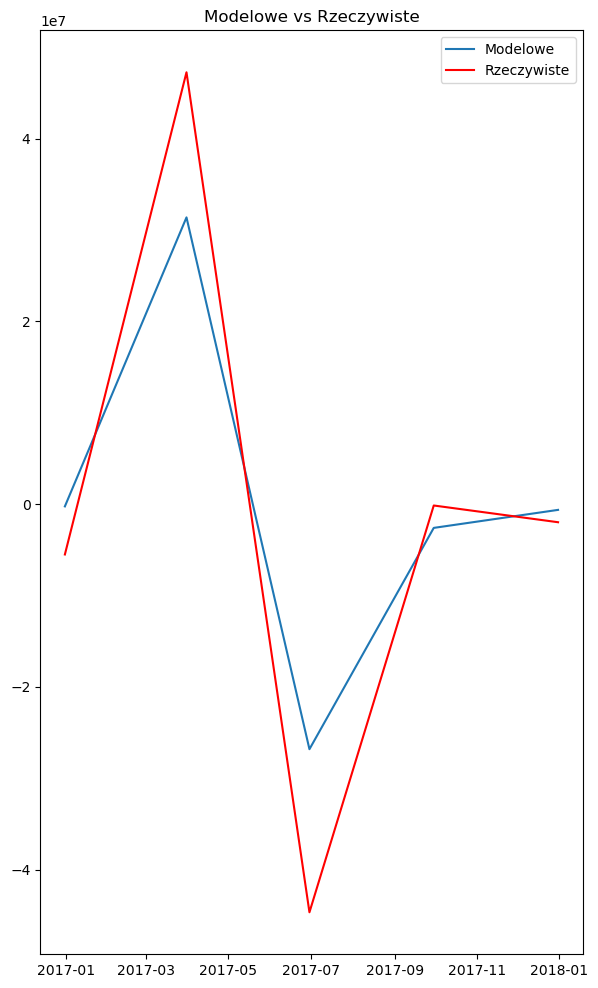

Błąd średniokwadratowy (MSE):  121323742812396.05
MAPE:  391.97 %
                                      SARIMAX Results                                      
Dep. Variable:     Zysk z działalności operacyjnej   No. Observations:                   43
Model:              SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -699.502
Date:                             Thu, 16 May 2024   AIC                           1415.004
Time:                                     11:53:11   BIC                           1429.094
Sample:                                 03-31-2006   HQIC                          1420.200
                                      - 09-30-2016                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0124      0.117     -8.

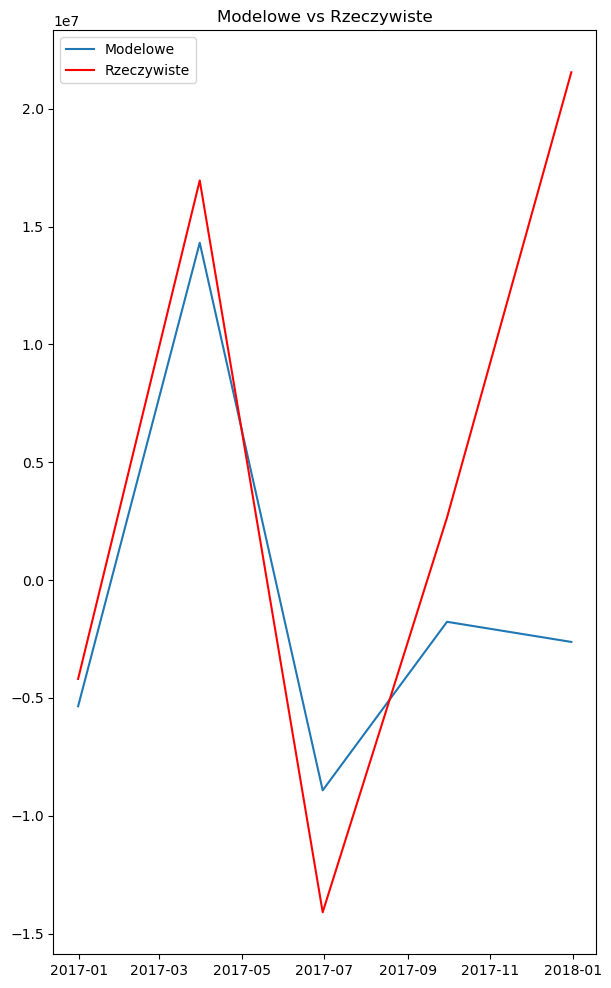

Błąd średniokwadratowy (MSE):  127785226955911.17
MAPE:  71.81 %
                                     SARIMAX Results                                      
Dep. Variable:                             EBITDA   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -673.676
Date:                            Thu, 16 May 2024   AIC                           1363.353
Time:                                    11:53:12   BIC                           1377.442
Sample:                                03-31-2006   HQIC                          1368.548
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8548      3.586     -0.238      

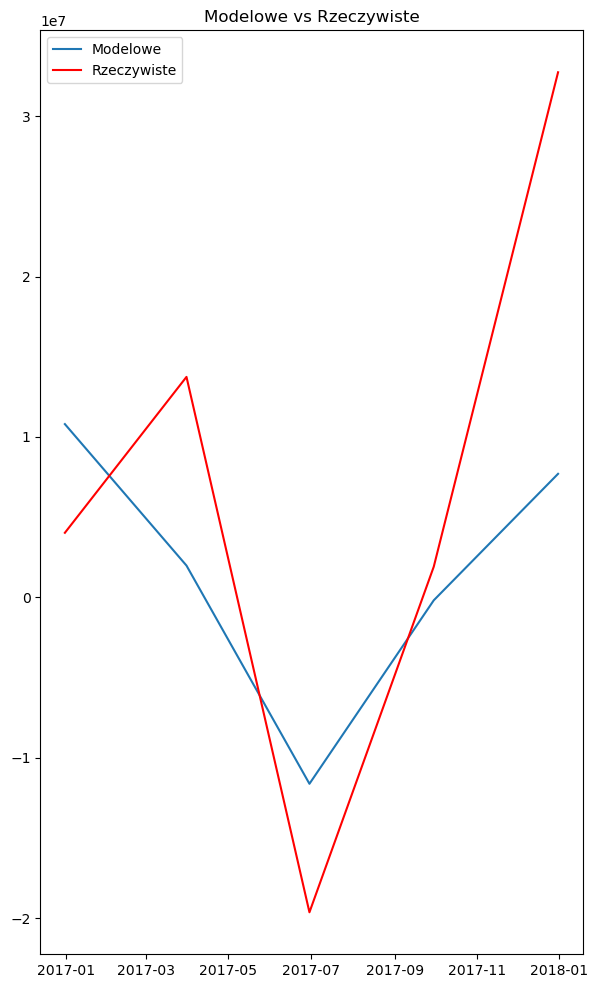

Błąd średniokwadratowy (MSE):  175949808017696.7
MAPE:  96.21 %
                                     SARIMAX Results                                      
Dep. Variable:                Przychody finansowe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -630.167
Date:                            Thu, 16 May 2024   AIC                           1276.335
Time:                                    11:53:12   BIC                           1290.425
Sample:                                03-31-2006   HQIC                          1281.531
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7456      6.319     -0.118      0

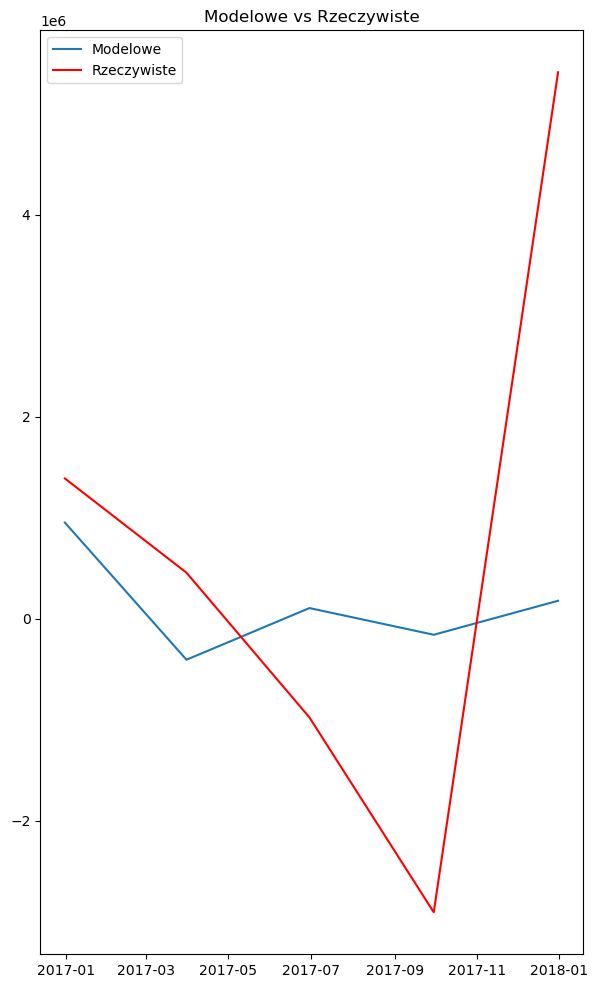

Błąd średniokwadratowy (MSE):  7412787781347.737
MAPE:  104.57 %
                                     SARIMAX Results                                      
Dep. Variable:                  Wydatki finansowe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -656.857
Date:                            Thu, 16 May 2024   AIC                           1329.715
Time:                                    11:53:13   BIC                           1343.804
Sample:                                03-31-2006   HQIC                          1334.911
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.1111      0.235     -8.965      

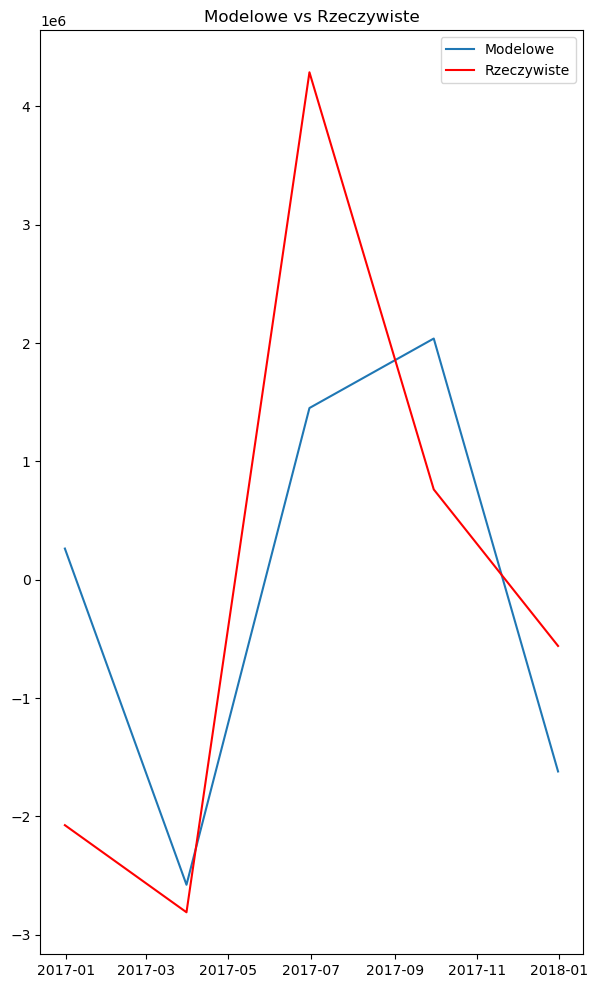

Błąd średniokwadratowy (MSE):  3264262424673.2466
MAPE:  108.77 %
                                     SARIMAX Results                                      
Dep. Variable:                        Zysk brutto   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -693.504
Date:                            Thu, 16 May 2024   AIC                           1403.008
Time:                                    11:53:14   BIC                           1417.097
Sample:                                03-31-2006   HQIC                          1408.203
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.4651      0.143    -10.246     

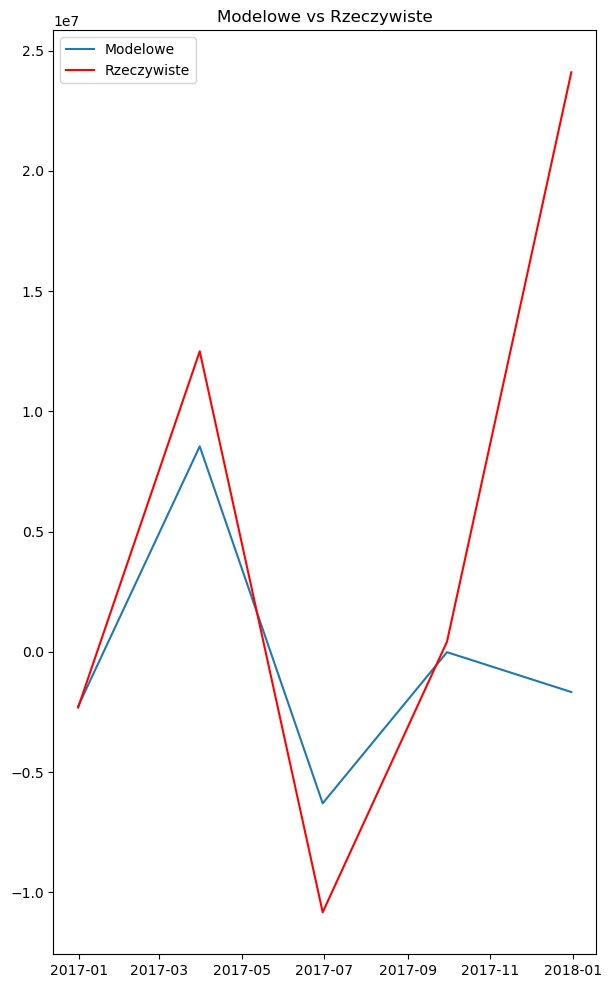

Błąd średniokwadratowy (MSE):  140059385615946.22
MAPE:  56.99 %
                                     SARIMAX Results                                      
Dep. Variable:                      Aktywa trwałe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -784.416
Date:                            Thu, 16 May 2024   AIC                           1584.833
Time:                                    11:53:15   BIC                           1598.922
Sample:                                03-31-2006   HQIC                          1590.028
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6105      0.689     -0.886      

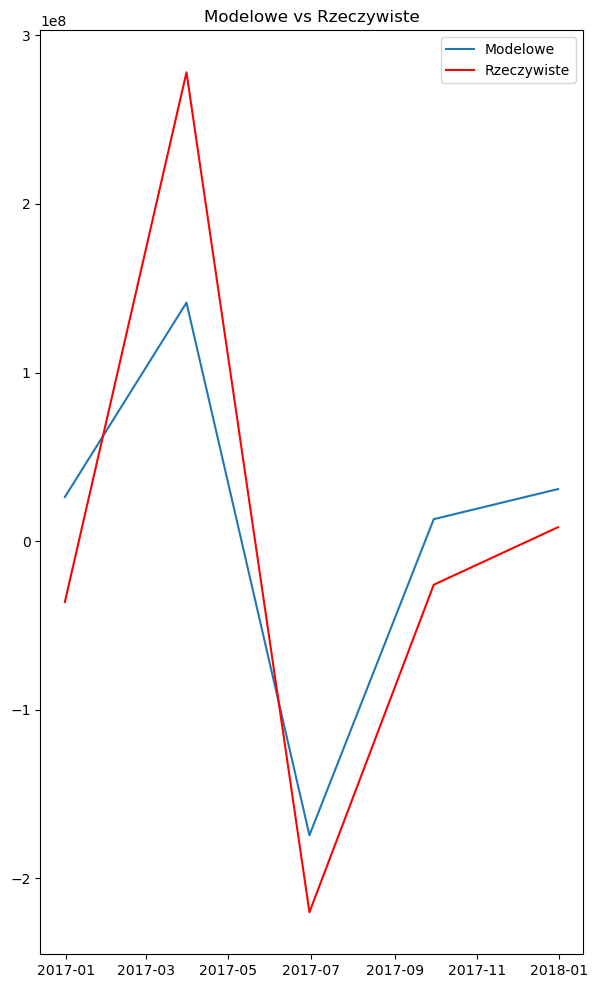

Błąd średniokwadratowy (MSE):  5329927551845182.0
MAPE:  133.25 %
                                     SARIMAX Results                                      
Dep. Variable:                    Aktywa obrotowe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -733.966
Date:                            Thu, 16 May 2024   AIC                           1483.932
Time:                                    11:53:15   BIC                           1498.022
Sample:                                03-31-2006   HQIC                          1489.128
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7763      0.536     -1.448     

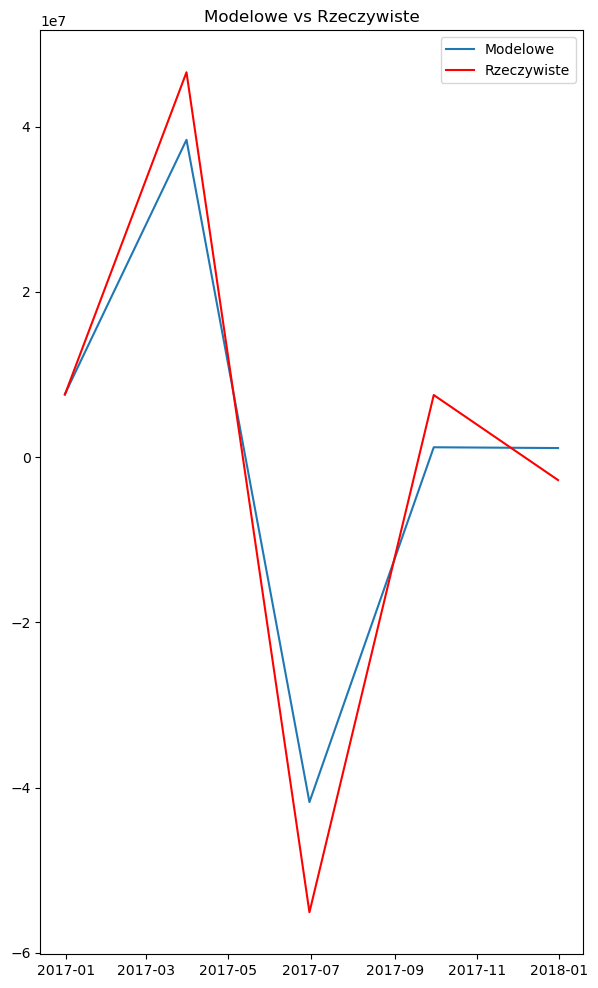

Błąd średniokwadratowy (MSE):  59934634806939.664
MAPE:  53.17 %
                                     SARIMAX Results                                      
Dep. Variable:              Kapitał własny ogółem   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -755.189
Date:                            Thu, 16 May 2024   AIC                           1526.379
Time:                                    11:53:16   BIC                           1540.468
Sample:                                03-31-2006   HQIC                          1531.574
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4076      0.252     -1.619      

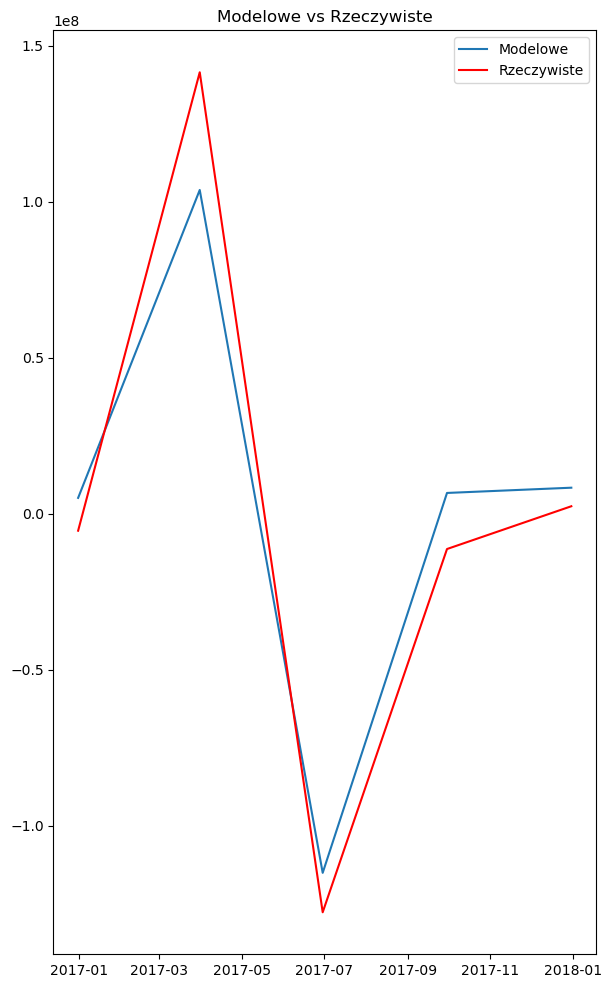

Błąd średniokwadratowy (MSE):  410484823661620.06
MAPE:  127.04 %
                                       SARIMAX Results                                       
Dep. Variable:     Kapitał własny spółki dominującej   No. Observations:                   43
Model:                SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -754.100
Date:                               Thu, 16 May 2024   AIC                           1524.201
Time:                                       11:53:17   BIC                           1538.290
Sample:                                   03-31-2006   HQIC                          1529.396
                                        - 09-30-2016                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4311   

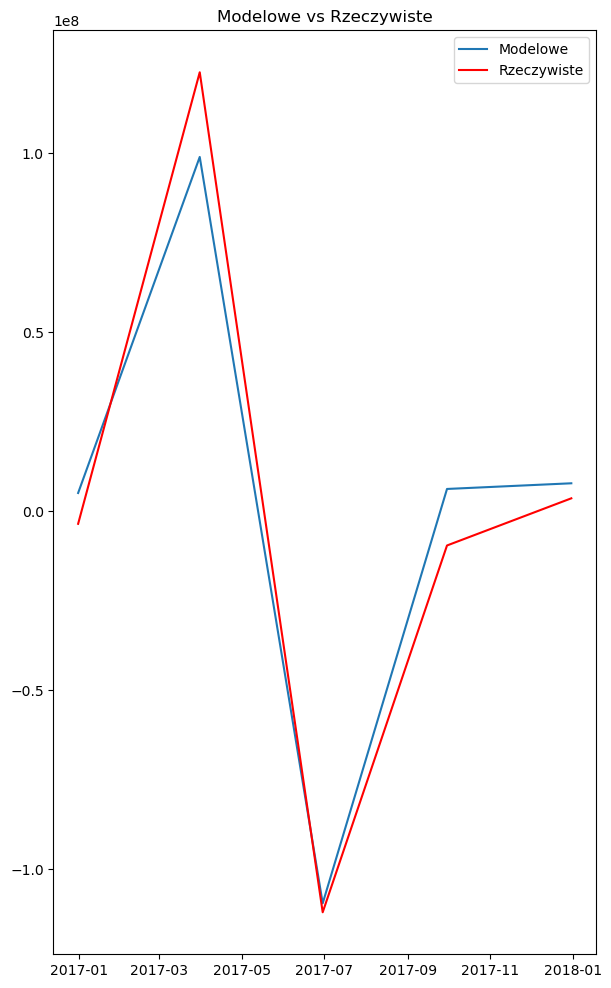

Błąd średniokwadratowy (MSE):  181316785975818.44
MAPE:  109.83 %
                                     SARIMAX Results                                      
Dep. Variable:        Zobowiązania długoterminowe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -751.124
Date:                            Thu, 16 May 2024   AIC                           1518.248
Time:                                    11:53:18   BIC                           1532.338
Sample:                                03-31-2006   HQIC                          1523.444
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9936      0.425     -2.339     

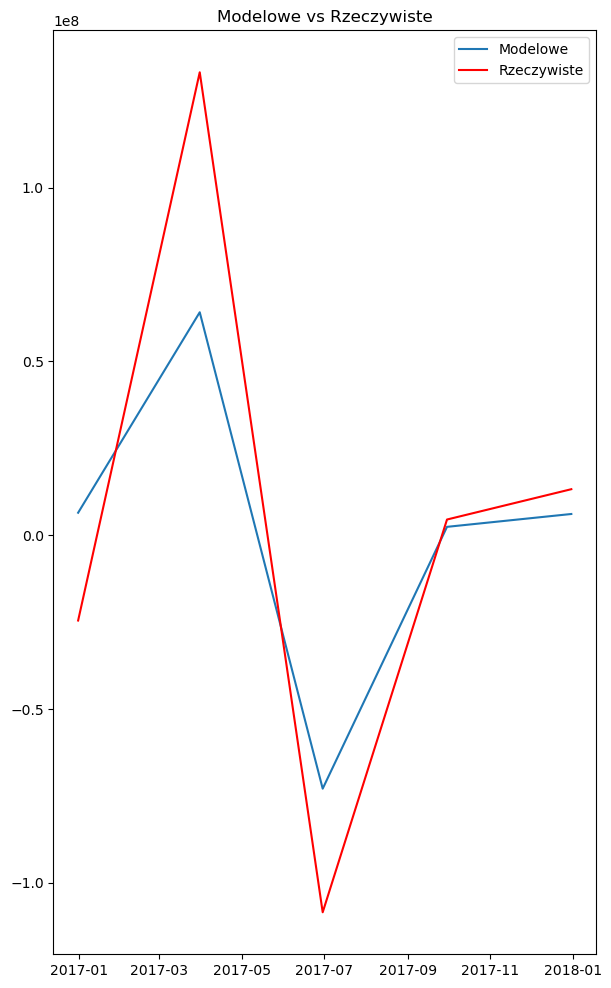

Błąd średniokwadratowy (MSE):  1409875322338357.5
MAPE:  62.32 %
                                       SARIMAX Results                                       
Dep. Variable:     Długoterminowe kredyty i pożyczki   No. Observations:                   43
Model:                SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -769.393
Date:                               Thu, 16 May 2024   AIC                           1554.787
Time:                                       11:53:18   BIC                           1568.876
Sample:                                   03-31-2006   HQIC                          1559.983
                                        - 09-30-2016                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5541    

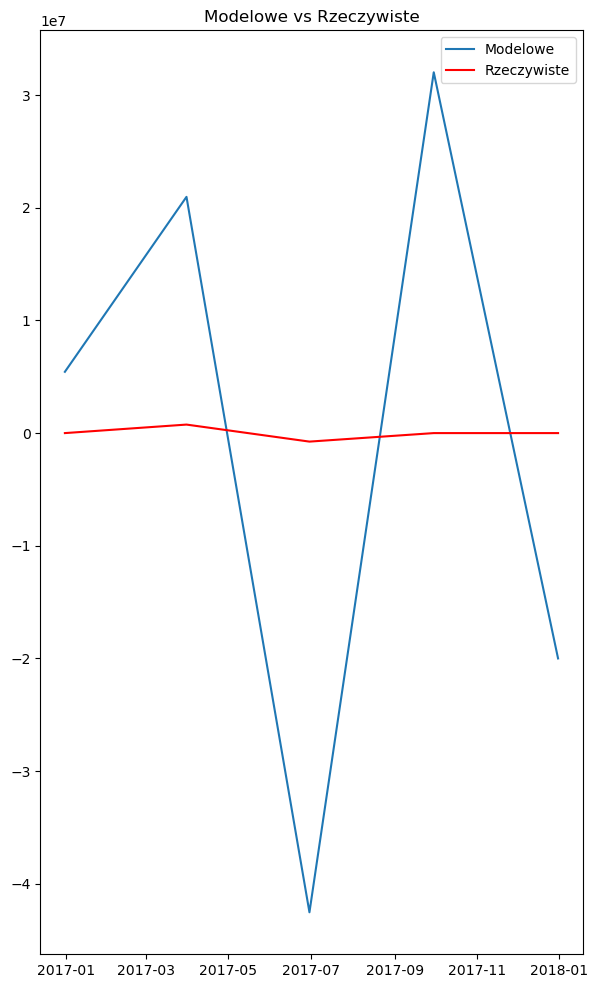

Błąd średniokwadratowy (MSE):  721662289336507.8
MAPE:  inf %
                                     SARIMAX Results                                      
Dep. Variable:       Zobowiązania krótkoterminowe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -720.710
Date:                            Thu, 16 May 2024   AIC                           1457.420
Time:                                    11:53:19   BIC                           1471.510
Sample:                                03-31-2006   HQIC                          1462.616
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2351     60.982     -0.020      0.9

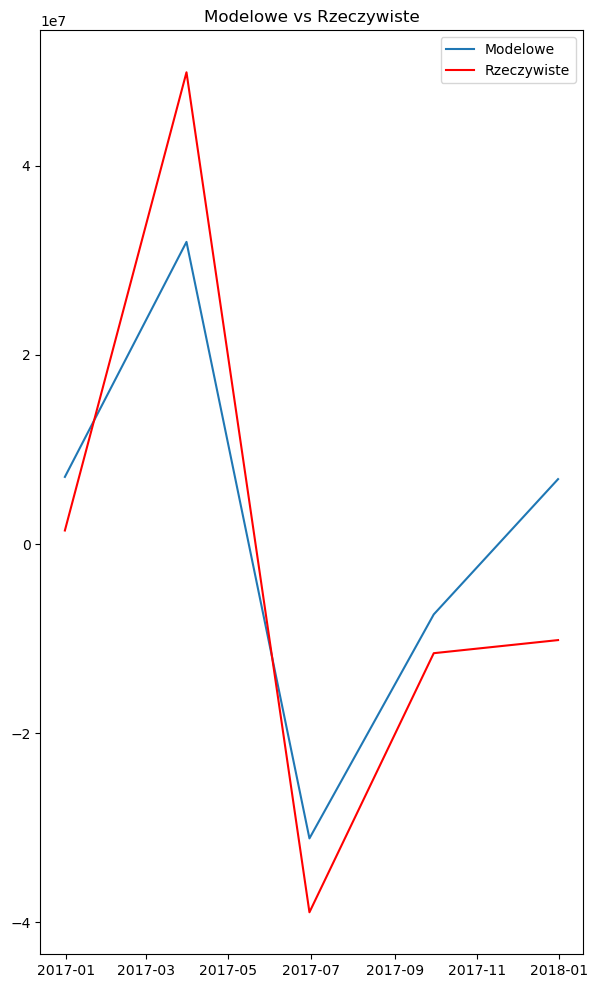

Błąd średniokwadratowy (MSE):  144433824423802.38
MAPE:  131.48 %
                                     SARIMAX Results                                      
Dep. Variable:           Pożyczki krótkoterminowe   No. Observations:                   43
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -689.997
Date:                            Thu, 16 May 2024   AIC                           1395.993
Time:                                    11:53:19   BIC                           1410.083
Sample:                                03-31-2006   HQIC                          1401.189
                                     - 09-30-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5985      0.420     -1.425     

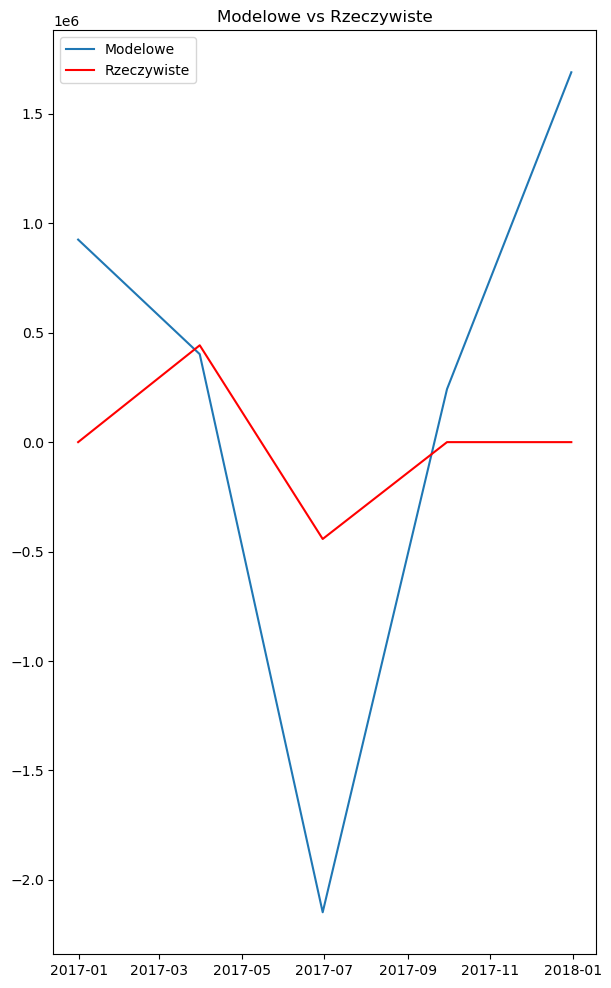

Błąd średniokwadratowy (MSE):  1336219708189.5012
MAPE:  inf %
                                      SARIMAX Results                                      
Dep. Variable:     Wynik finansowy (zysk / strata)   No. Observations:                   43
Model:              SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -673.793
Date:                             Thu, 16 May 2024   AIC                           1363.586
Time:                                     11:53:20   BIC                           1377.675
Sample:                                 03-31-2006   HQIC                          1368.781
                                      - 09-30-2016                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0341      1.797      0.019

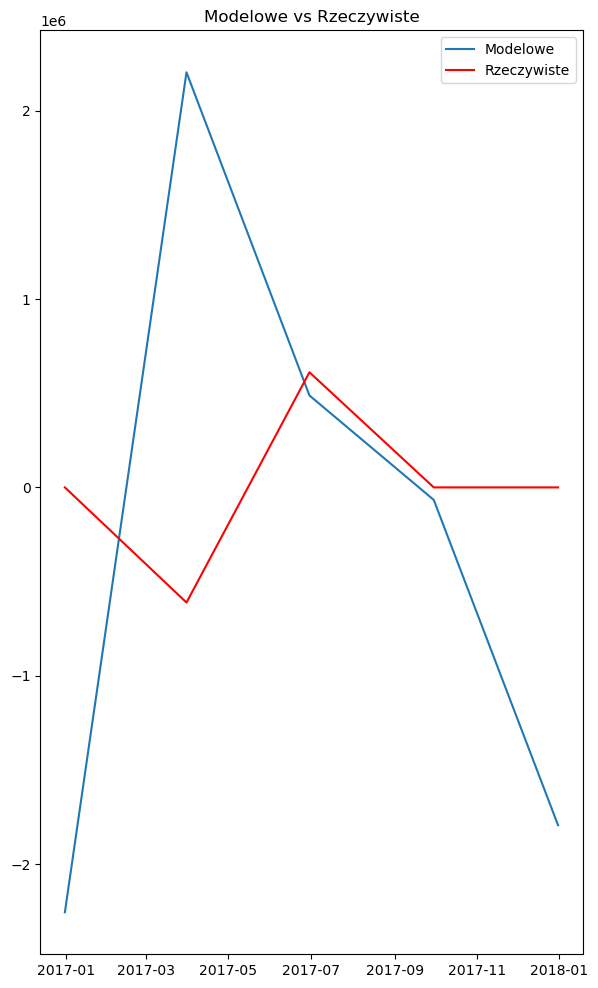

Błąd średniokwadratowy (MSE):  3251347246515.9985
MAPE:  inf %


In [40]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

for i in list(train.columns):
    train_t = train[f"{i}"]
    model = SARIMAX(train_t, order=(3, 0, 3), seasonal_order=(1, 0, 0, 4))
    results = model.fit()
    
    # Wyświetlenie podsumowania modelu
    print(results.summary())
    
    forecast_results = results.forecast(steps=5)
    test_t = test[:5]
    
    fig = plt.figure(figsize=(7,12))
    plt.plot(forecast_results, label="Modelowe")
    plt.plot(test_t[f"{i}"], c='r', label="Rzeczywiste")
    plt.title("Modelowe vs Rzeczywiste")
    plt.legend()
    plt.show()
    
    from sklearn.metrics import mean_squared_error
    
    mse = mean_squared_error(test_t[f"{i}"], forecast_results)
    print("Błąd średniokwadratowy (MSE): ", mse)
    
    
    import numpy as np
    
    def mean_absolute_percentage_error(y_true, y_pred):
        """
        Oblicza średnią bezwzględną błędu procentowego (MAPE).
    
        Parametry:
        y_true : array-like
            Rzeczywiste wartości.
        y_pred : array-like
            Prognozowane wartości.
    
        Zwraca:
        mape : float
            Wartość MAPE.
        """
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    
    
    
    mape = mean_absolute_percentage_error(test_t[f"{i}"], forecast_results)
    print("MAPE: ", round(mape,2),"%")


Błąd średniokwadratowy (MSE):  4769495287939680.0


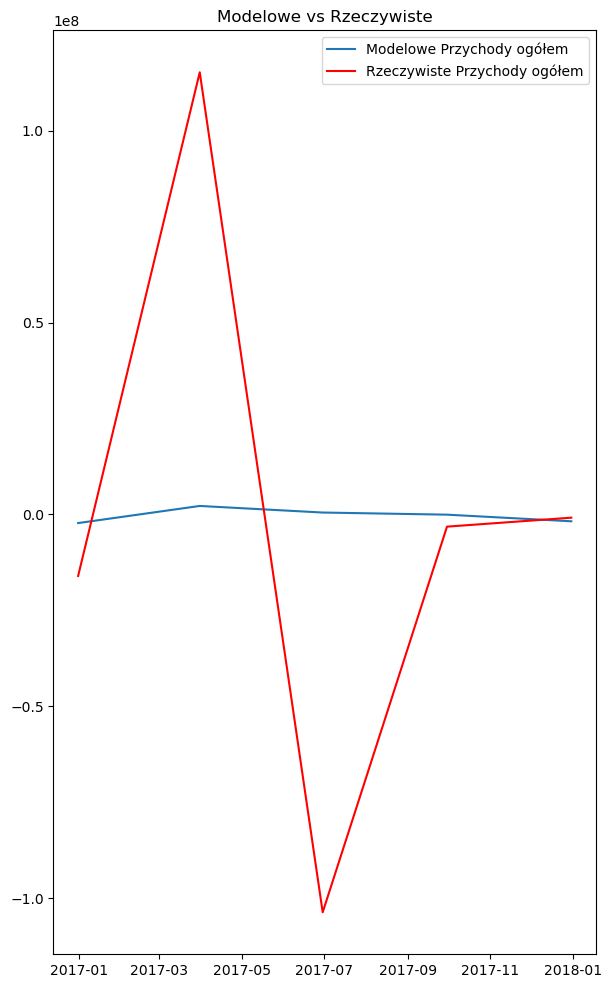

MAPE Przychody ogółem:  98.54 %


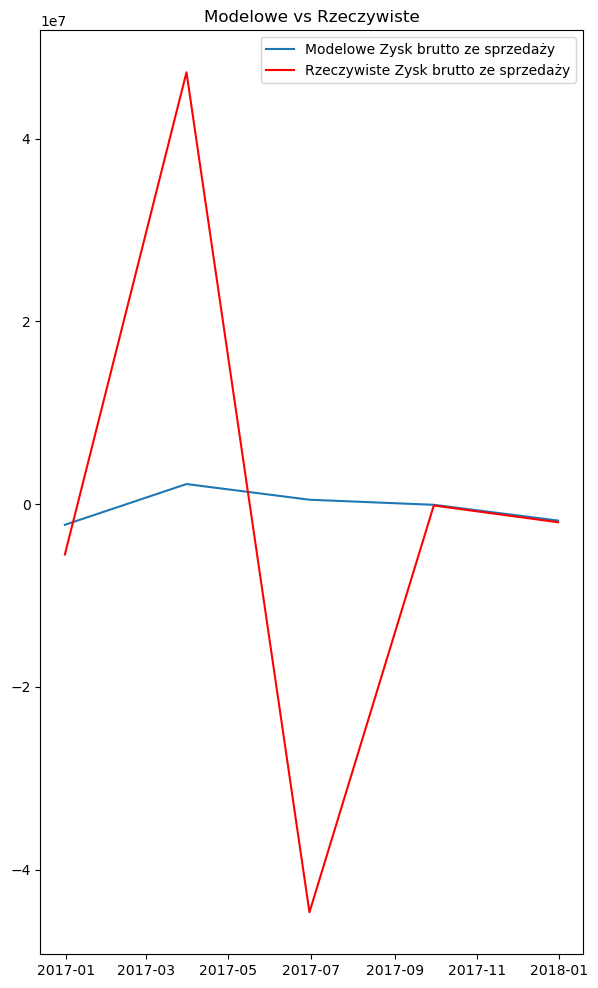

MAPE Zysk brutto ze sprzedaży:  63.61 %


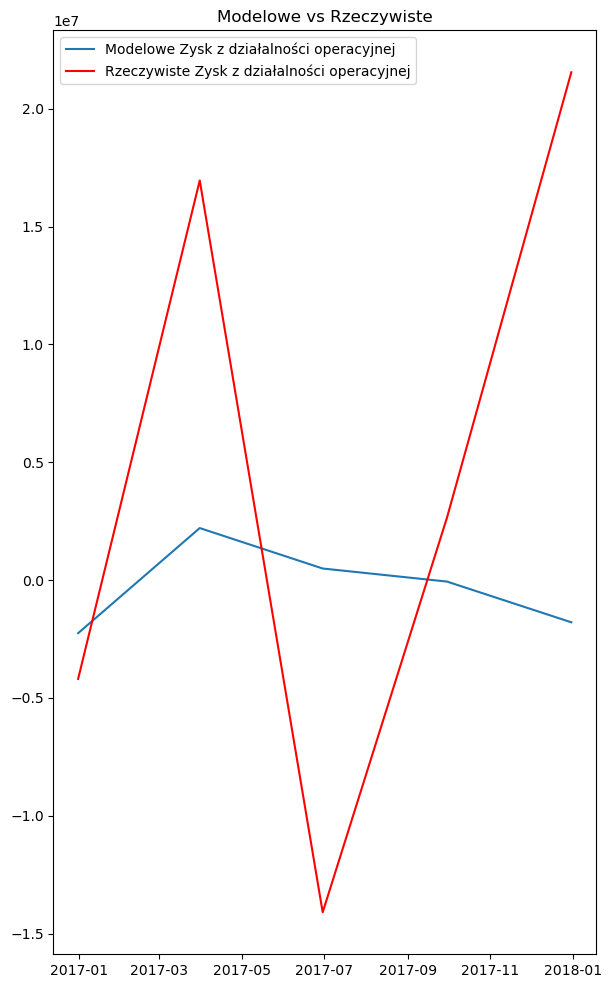

MAPE Zysk z działalności operacyjnej:  89.5 %


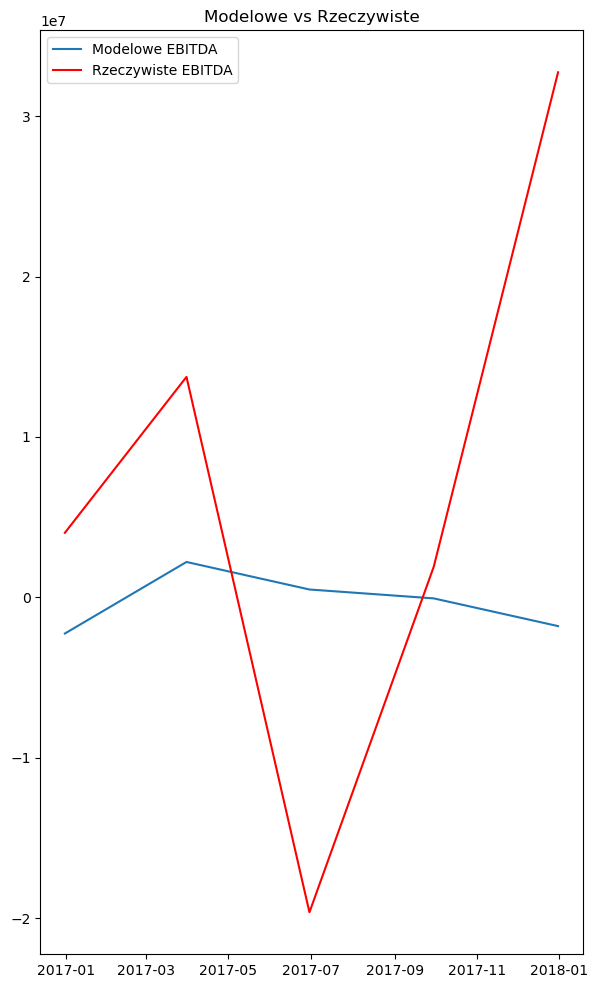

MAPE EBITDA:  110.29 %


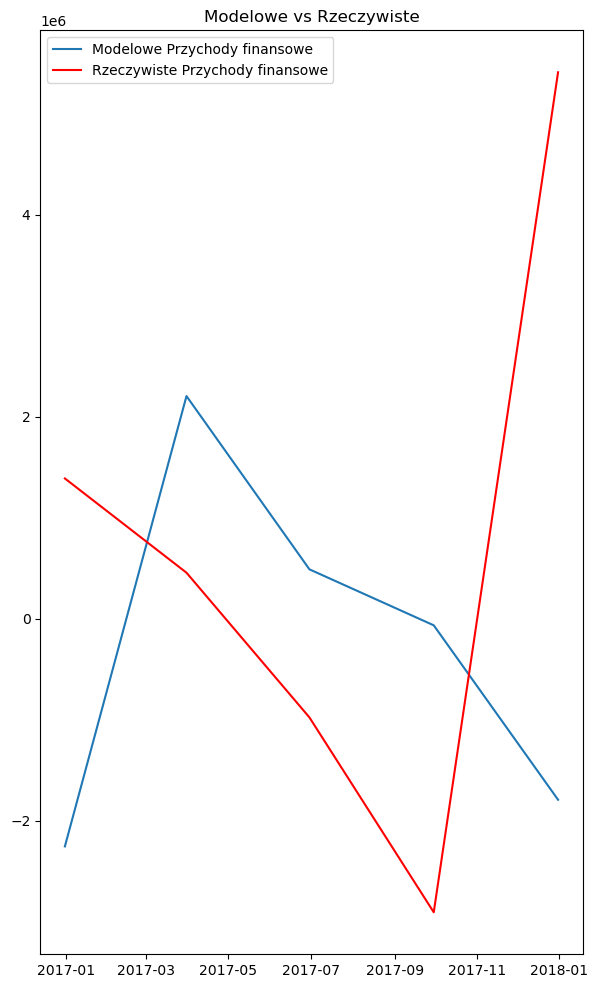

MAPE Przychody finansowe:  205.56 %


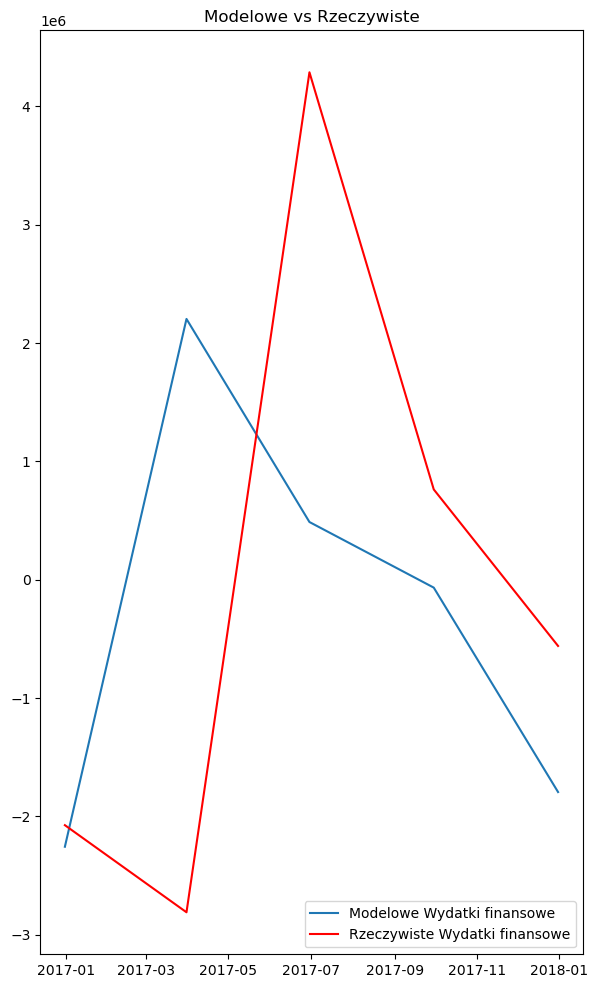

MAPE Wydatki finansowe:  121.07 %


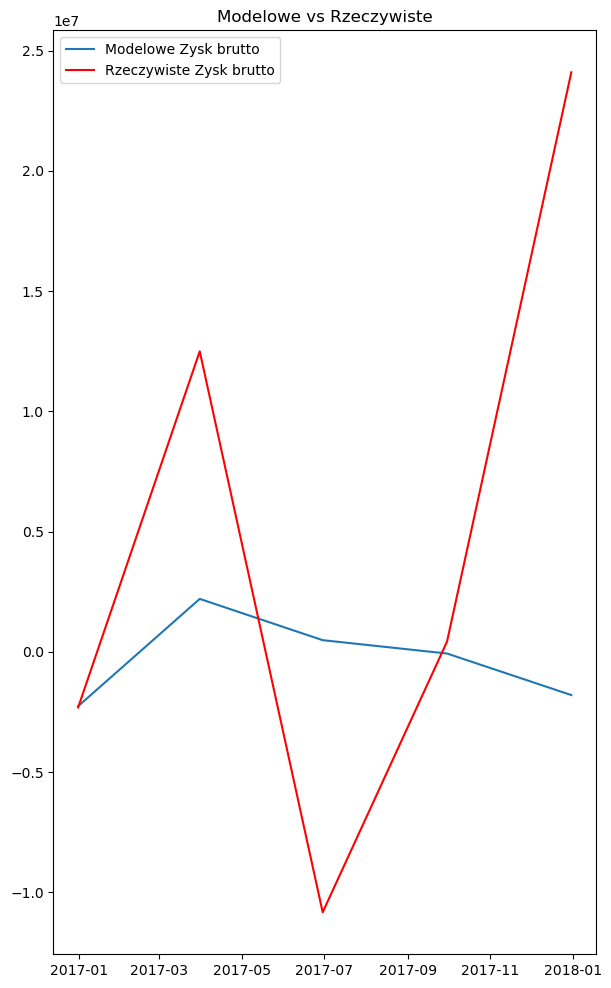

MAPE Zysk brutto:  82.44 %


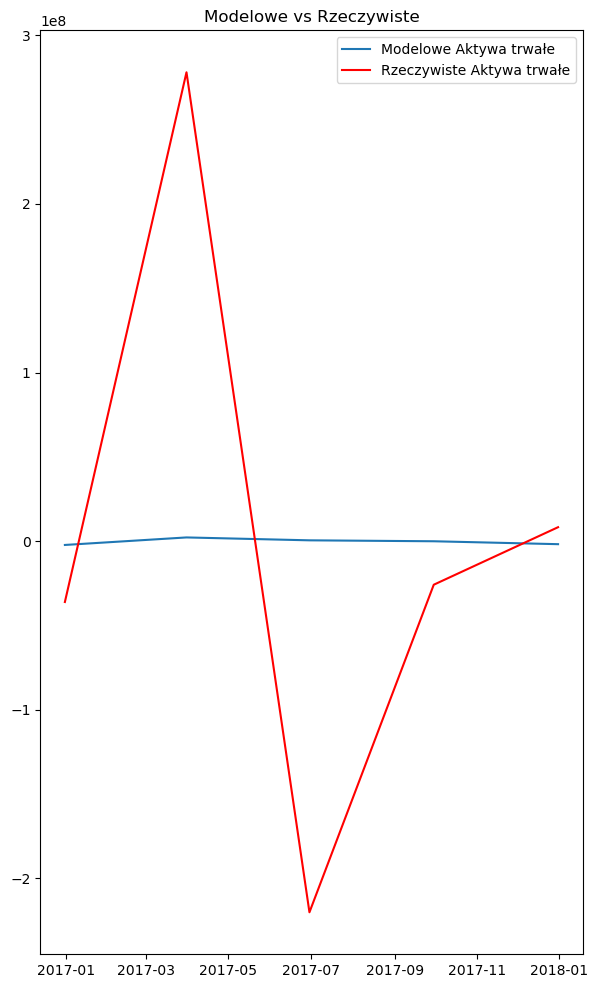

MAPE Aktywa trwałe:  102.92 %


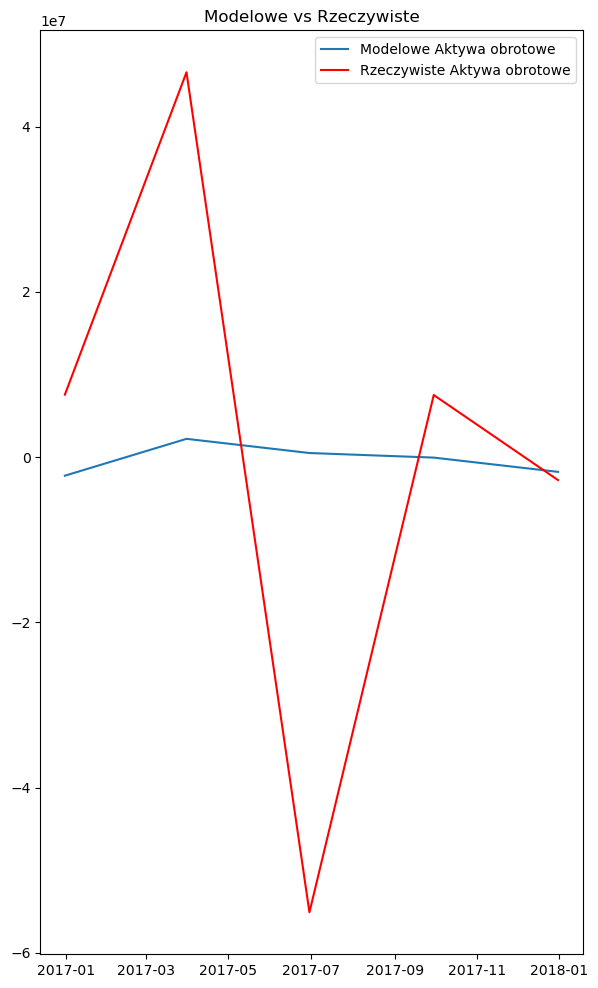

MAPE Aktywa obrotowe:  92.51 %


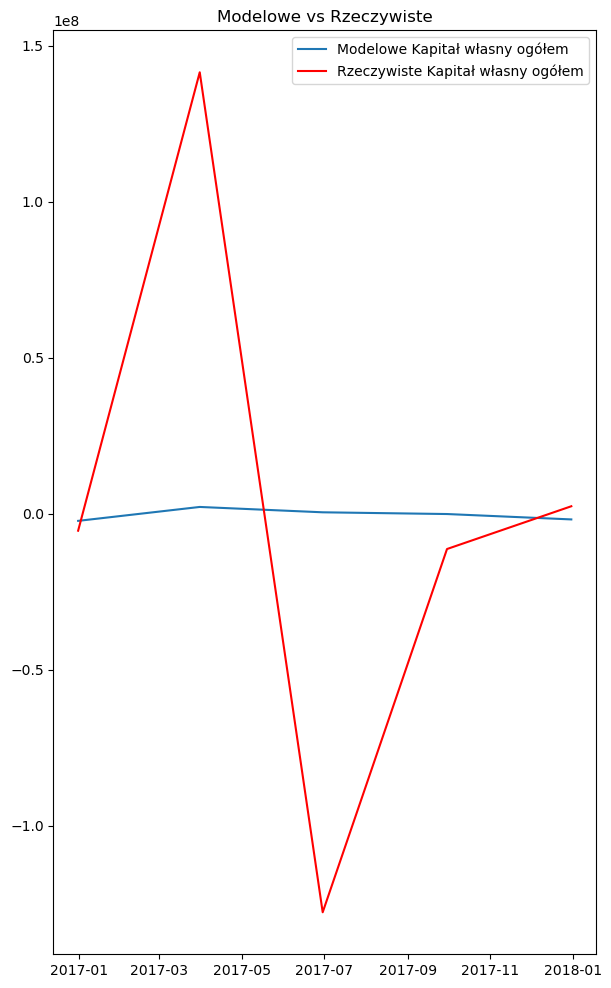

MAPE Kapitał własny ogółem:  106.09 %


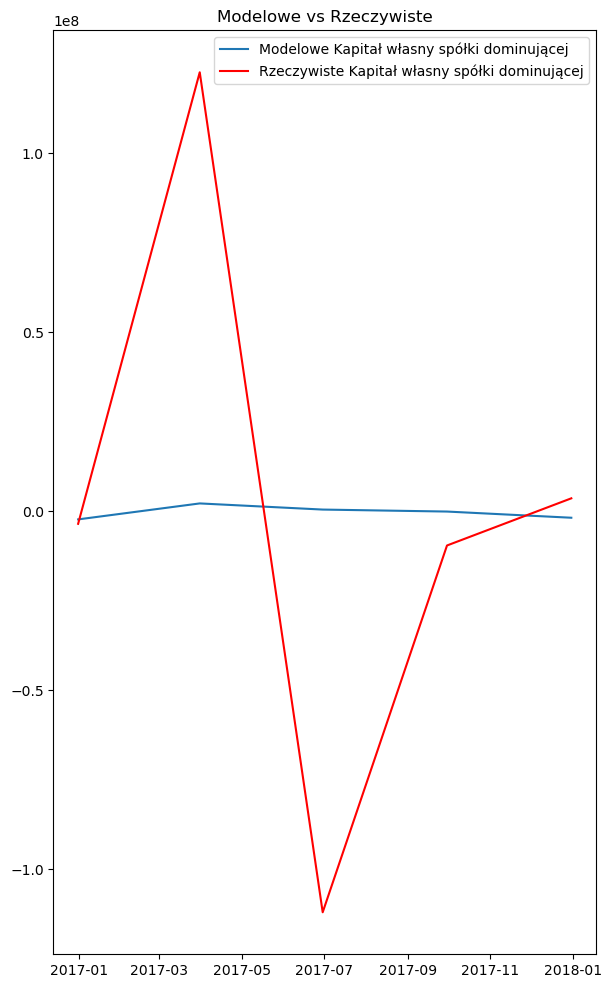

MAPE Kapitał własny spółki dominującej:  96.56 %


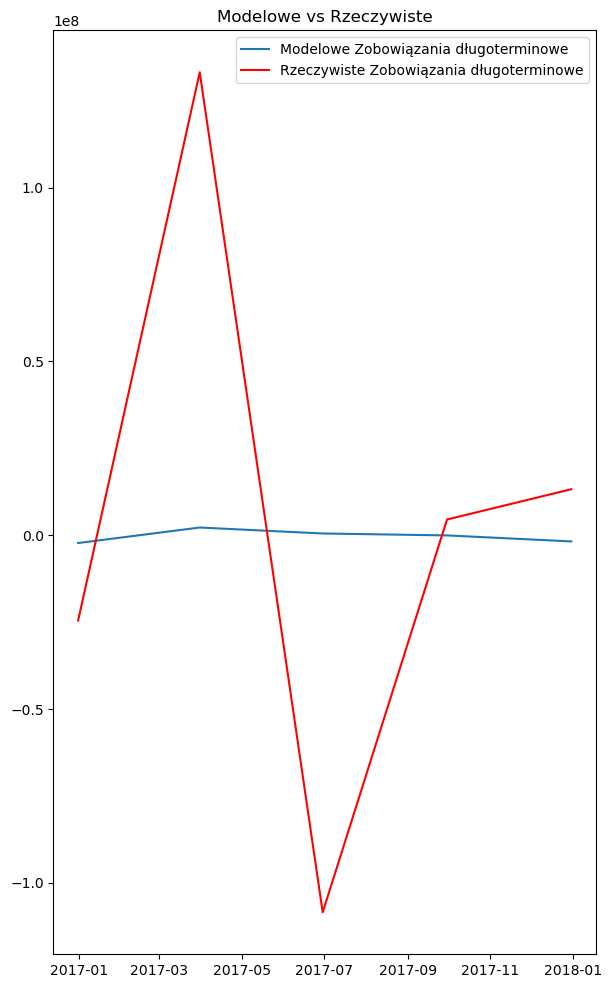

MAPE Zobowiązania długoterminowe:  100.93 %


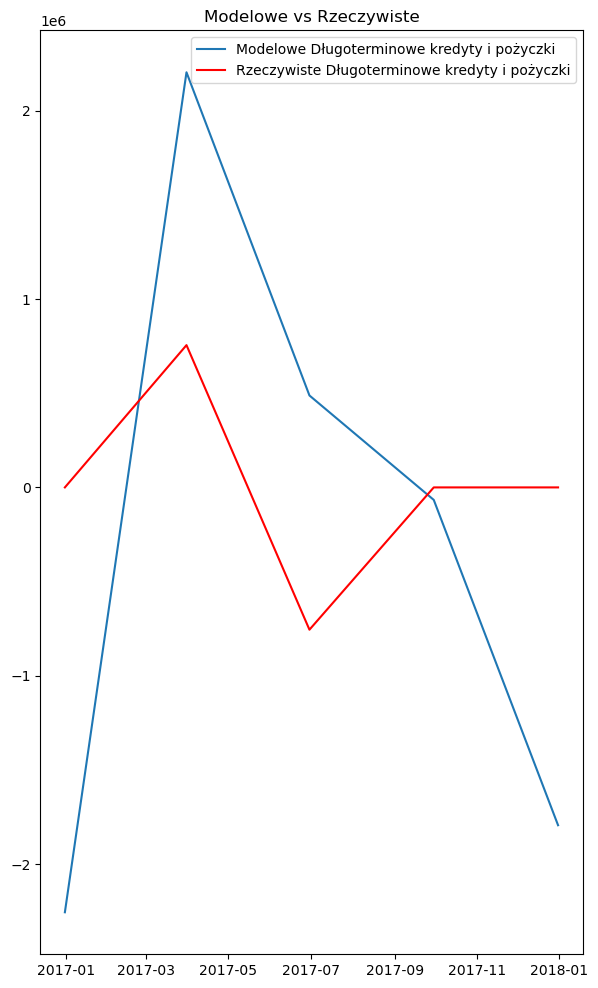

MAPE Długoterminowe kredyty i pożyczki:  inf %


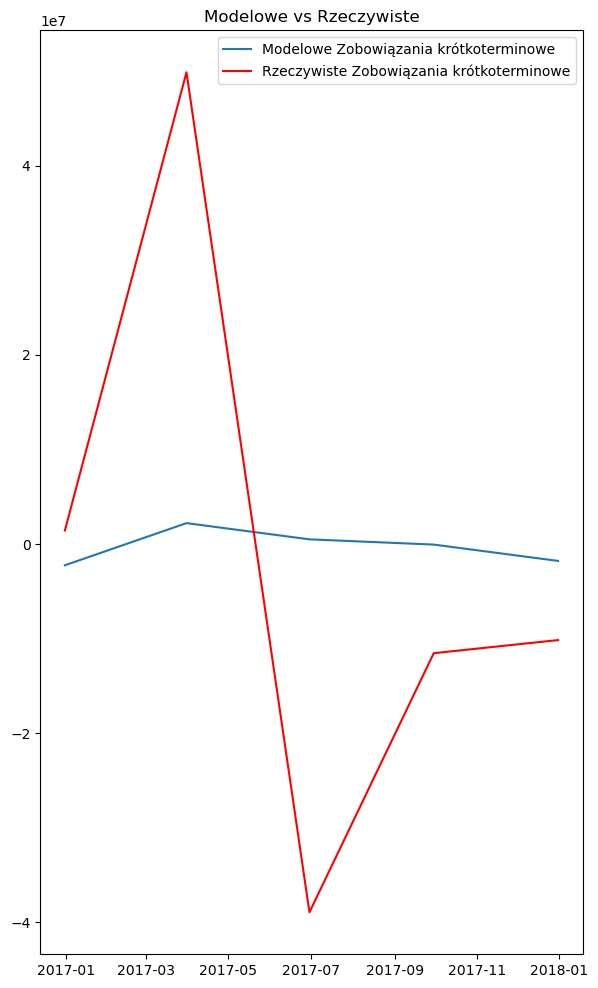

MAPE Zobowiązania krótkoterminowe:  127.43 %


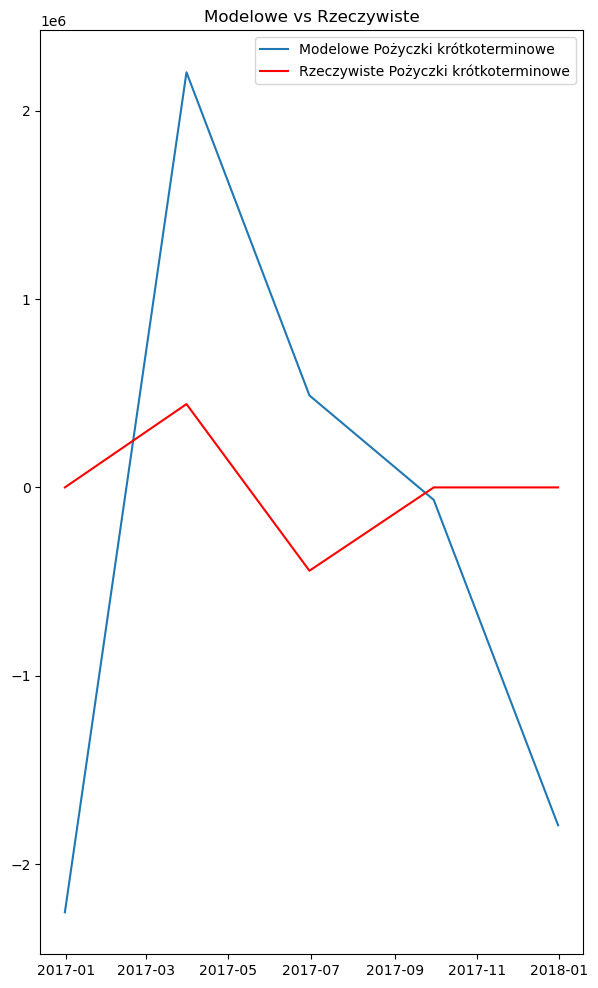

MAPE Pożyczki krótkoterminowe:  inf %


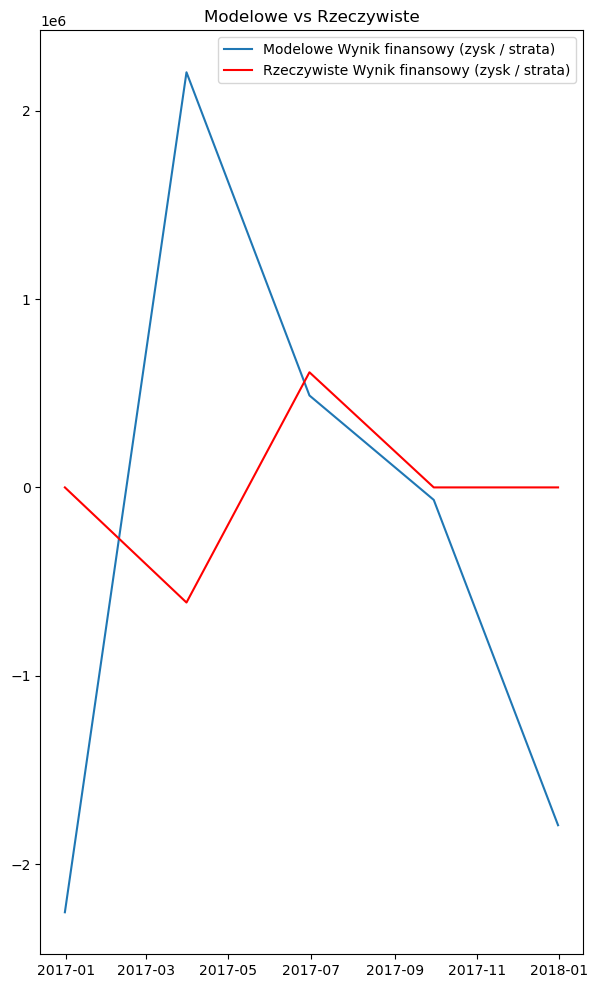

MAPE Wynik finansowy (zysk / strata):  inf %


In [41]:
forecast_results = results.forecast(steps=5)
forecast_result = pd.DataFrame(forecast_results, index=test[:5].index)
test_t = test[:5]

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(test_t["Przychody ogółem"], forecast_results)
print("Błąd średniokwadratowy (MSE): ", mse)


import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100






for i in list(test.columns):
    
    fig = plt.figure(figsize=(7,12))
    plt.plot(forecast_result, label=f"Modelowe {i}")
    plt.plot(test_t[f"{i}"], c='r', label=f"Rzeczywiste {i}")
    plt.title("Modelowe vs Rzeczywiste")
    plt.legend()
    plt.show()
    mape = mean_absolute_percentage_error(test_t[f"{i}"], forecast_results)
    print(f"MAPE {i}: ", round(mape,2),"%")

In [22]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming random_forest_mol contains your data

def RandomForest(i):
    # Extracting labels
    labels = np.array(random_forest_mol[f"{i}"])
    
    # Extracting features
    features = random_forest_mol.drop(f"{i}", axis=1)
    features_np = np.array(features)
    
    # Splitting data into training and testing sets
    train_l = labels[:60]
    test_l = labels[61:]
    
    train_f = features_np[:60]
    test_f = features_np[61:]
    
    # List of feature names
    f_list = list(features.columns)
    
    # Initialize RandomForestRegressor
    rf = RandomForestRegressor(n_estimators=1000, random_state=42)
    
    # Perform cross-validation
    scores = cross_val_score(rf, train_f, train_l, cv=5)
    
    # Fit the model
    rf.fit(train_f, train_l)
    
    # Print average accuracy obtained from cross-validation
    print("----------------------------------------")
    print(f'Random Forest for {i}')
    print("Cross-validation scores:", scores)
    print("Mean accuracy:", scores.mean())
    print("Standard deviation of accuracy:", scores.std())


vars = list(mol_diff.columns)

for i in vars:
    RandomForest(i)

----------------------------------------
Random Forest for Przychody ogółem
Cross-validation scores: [ 0.88593437  0.80278983  0.77101524  0.74425886 -0.21086406]
Mean accuracy: 0.5986268491841611
Standard deviation of accuracy: 0.407536525809159
----------------------------------------
Random Forest for Zysk z działalności operacyjnej
Cross-validation scores: [0.98024496 0.80999908 0.37286111 0.97608689 0.97670346]
Mean accuracy: 0.8231790995461499
Standard deviation of accuracy: 0.2343417223681415
----------------------------------------
Random Forest for EBITDA
Cross-validation scores: [ 0.94552269  0.54740592  0.2957189  -0.99076    -3.28765657]
Mean accuracy: -0.49795381081428314
Standard deviation of accuracy: 1.5382858744367418
----------------------------------------
Random Forest for Przychody finansowe
Cross-validation scores: [ 0.5855822   0.7611034  -0.71541302  0.44302047 -5.42697882]
Mean accuracy: -0.8705371560029957
Standard deviation of accuracy: 2.336372926358754
----

MAPE Przychody ogółem:  57.91 %


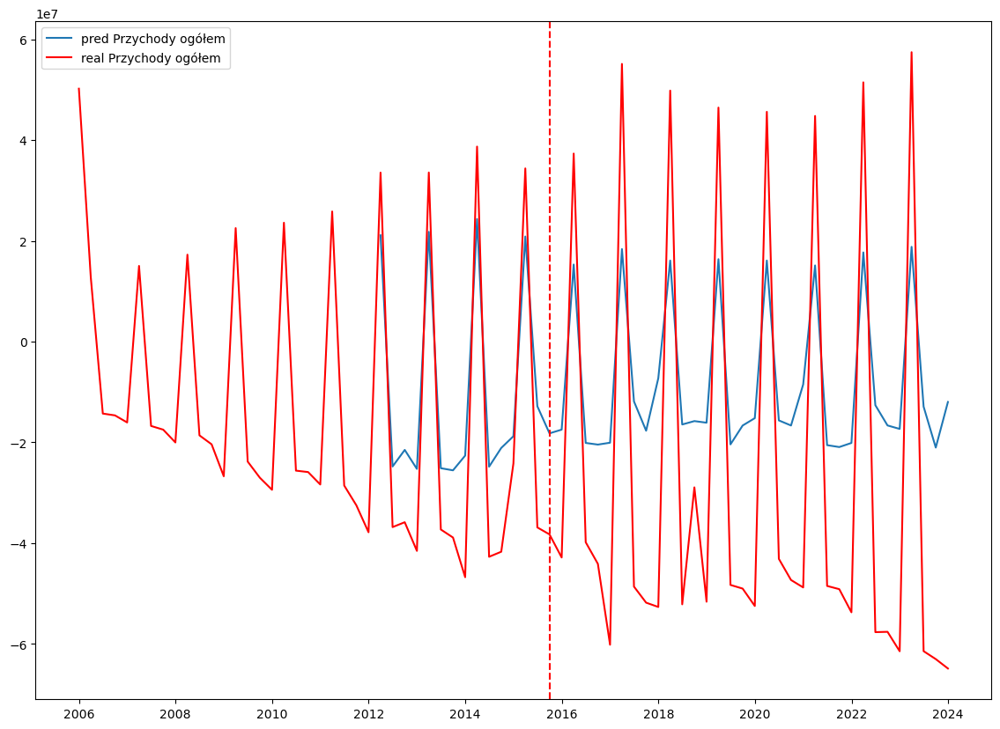

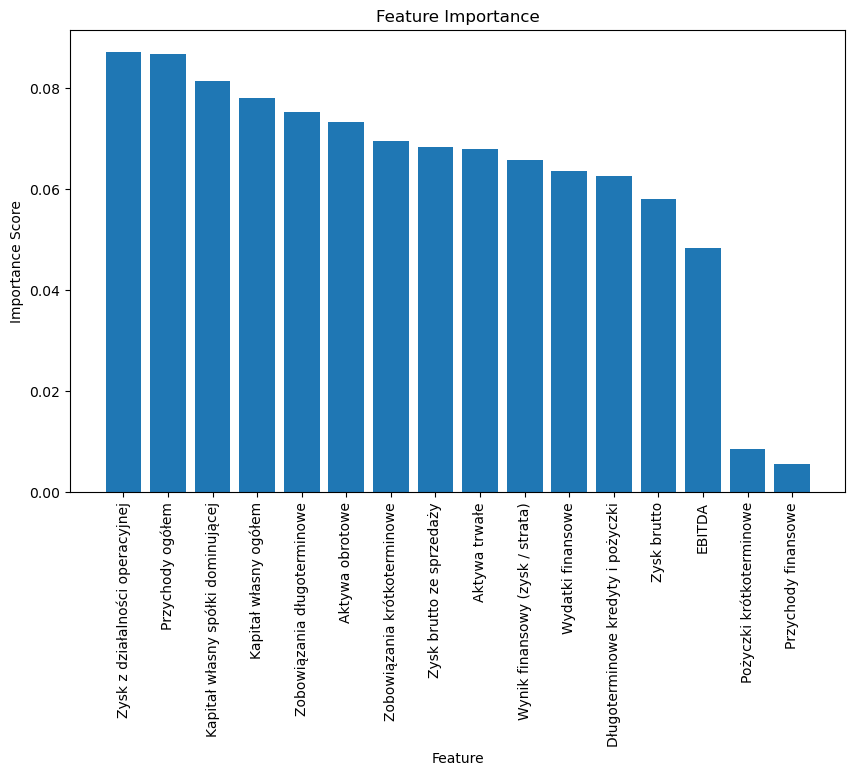

MAPE Zysk brutto ze sprzedaży:  102.57 %


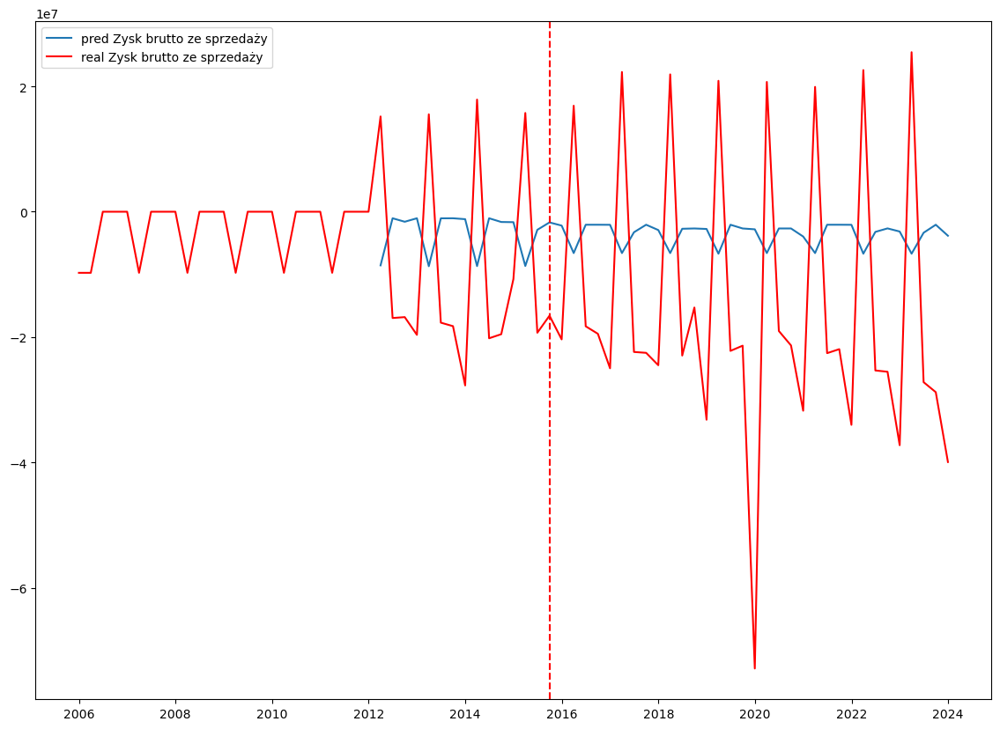

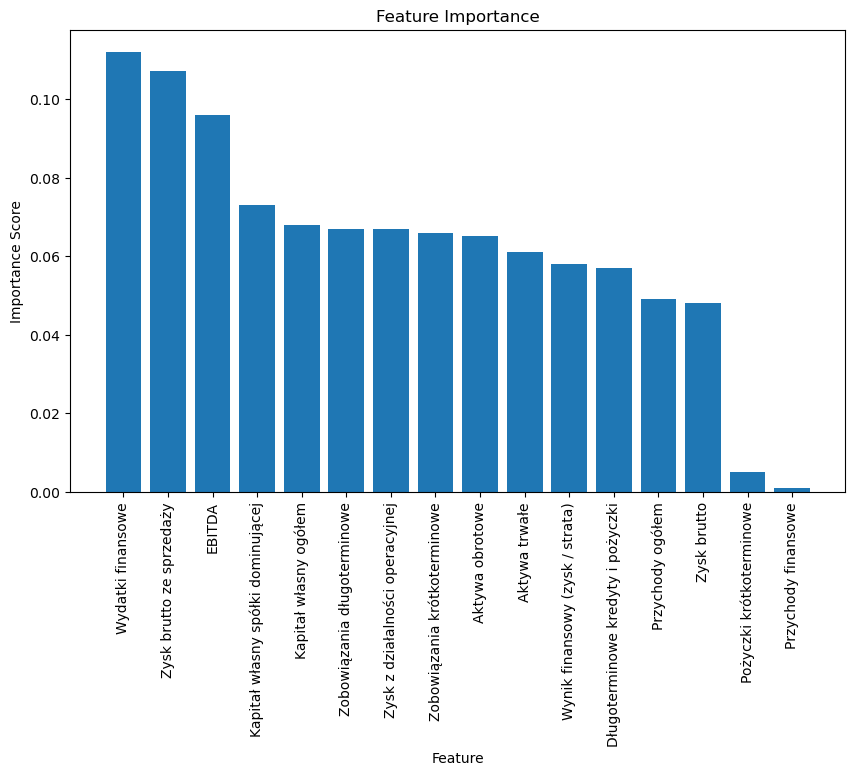

MAPE Zysk z działalności operacyjnej:  60.31 %


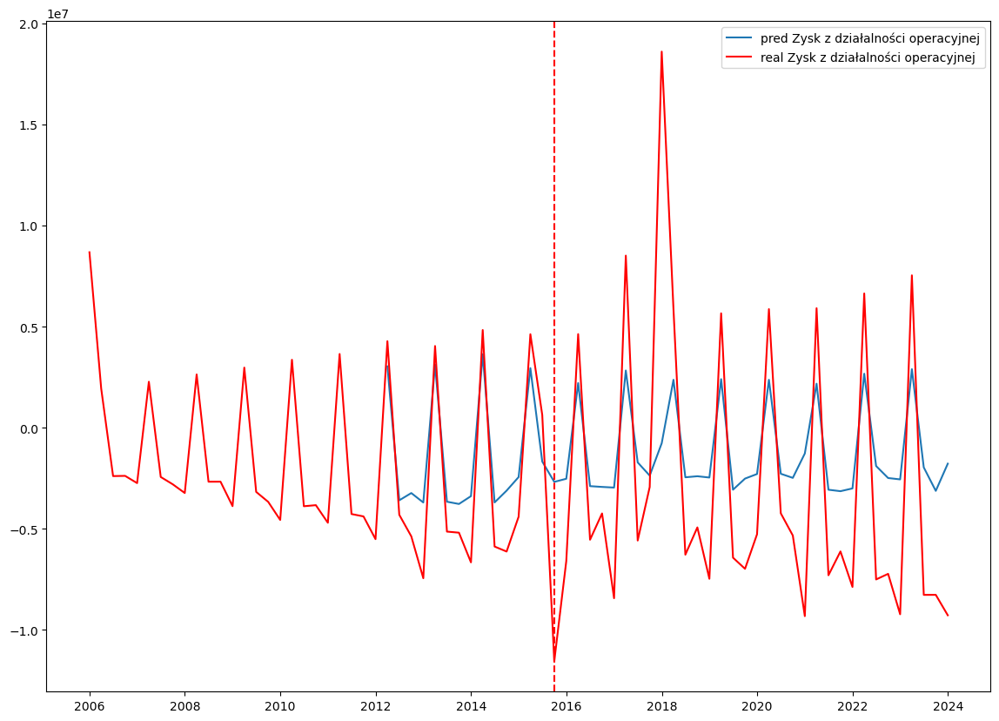

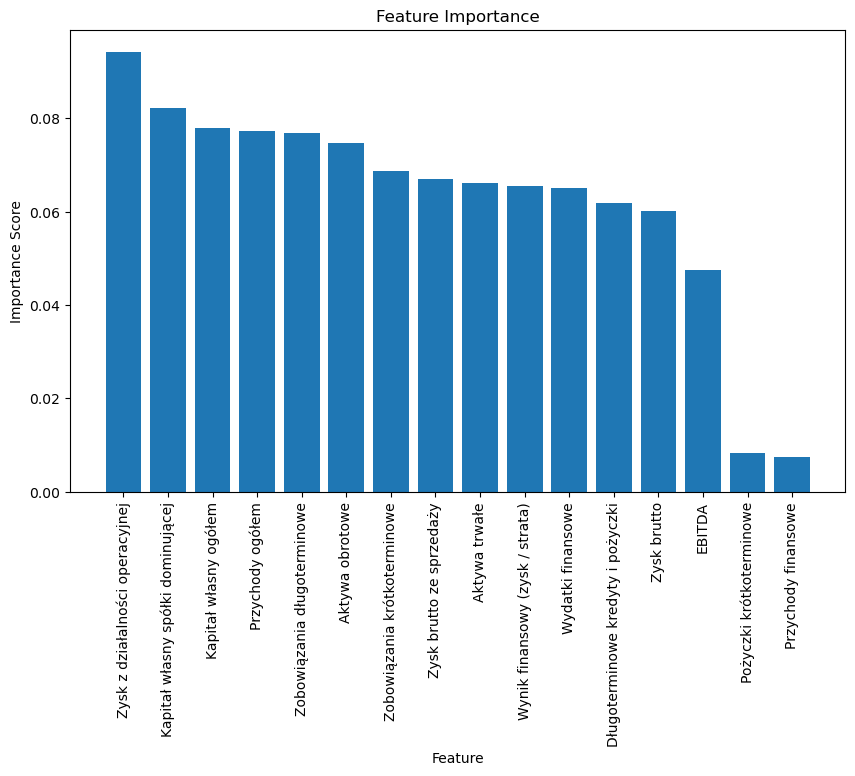

MAPE EBITDA:  89.44 %


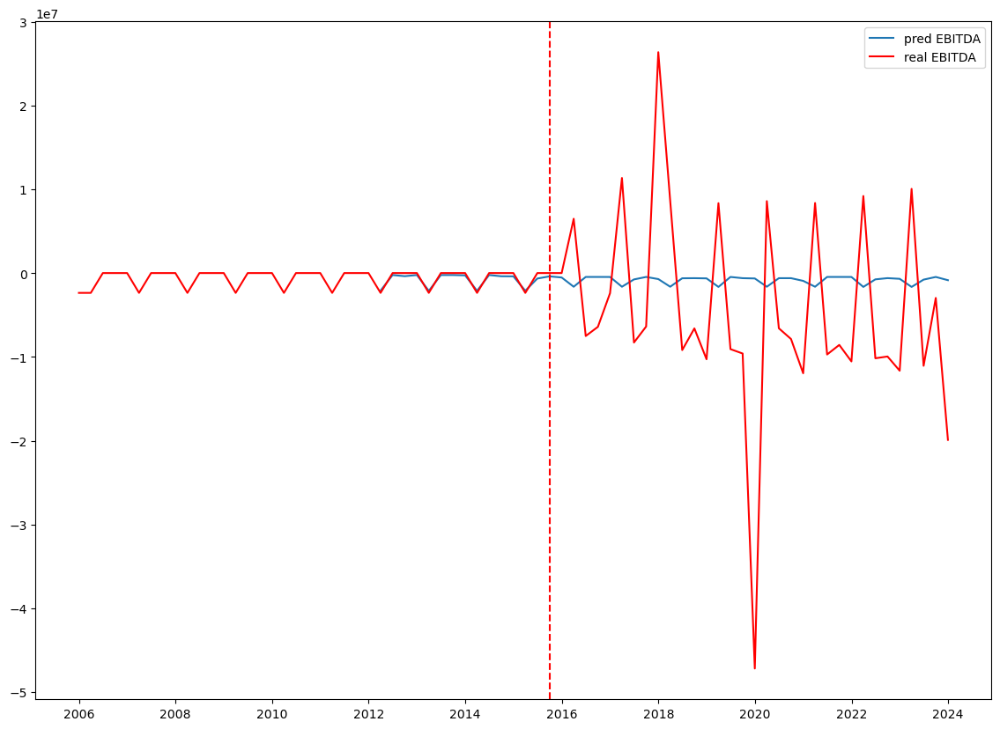

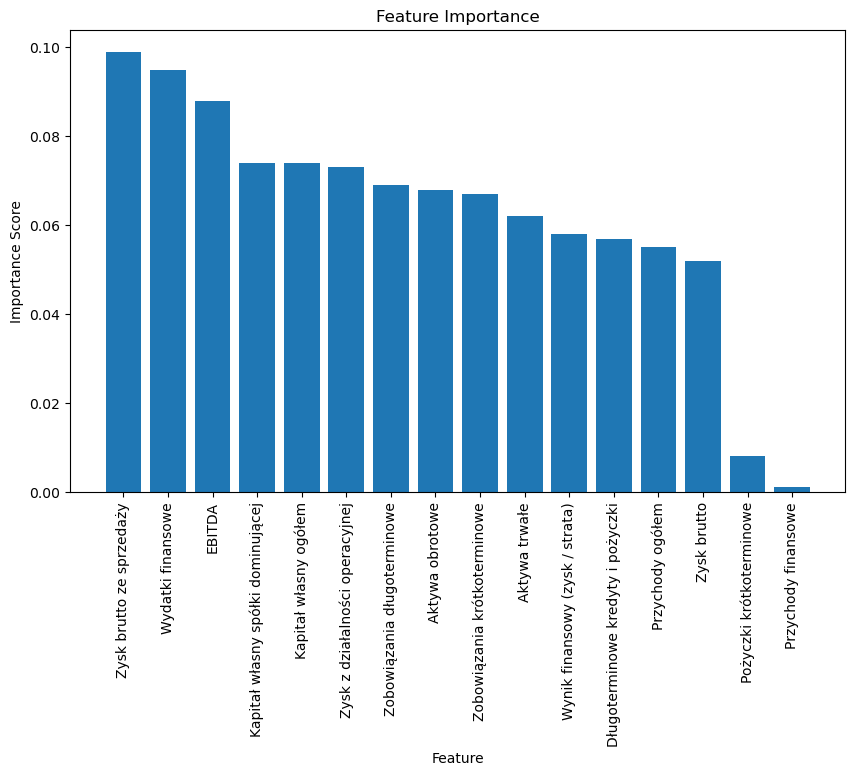

MAPE Przychody finansowe:  216.99 %


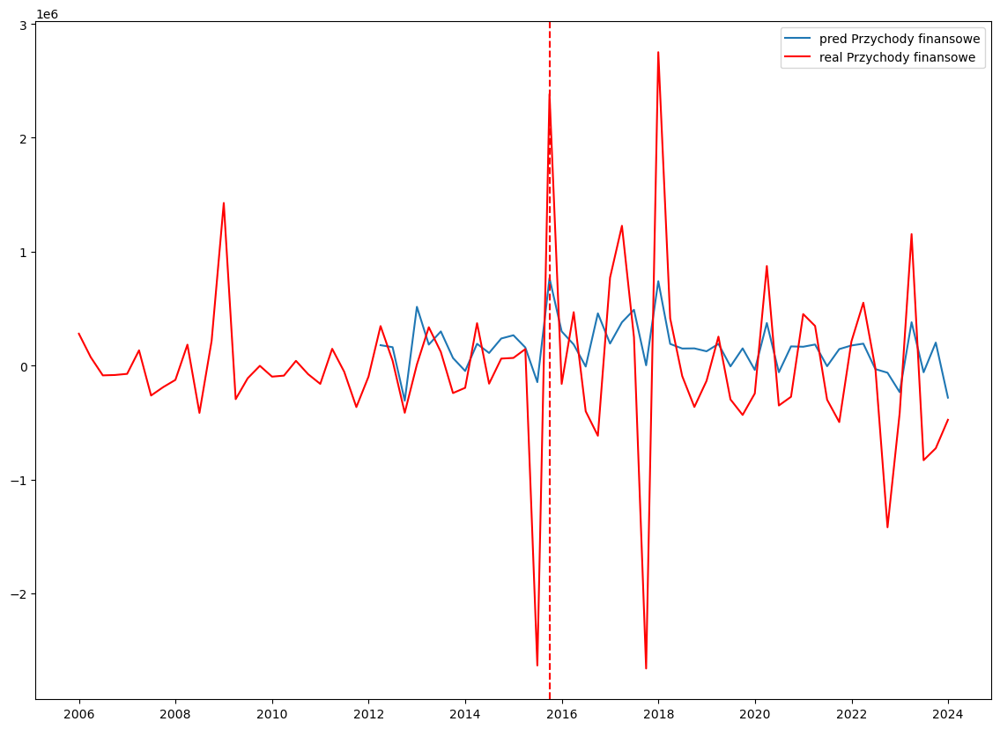

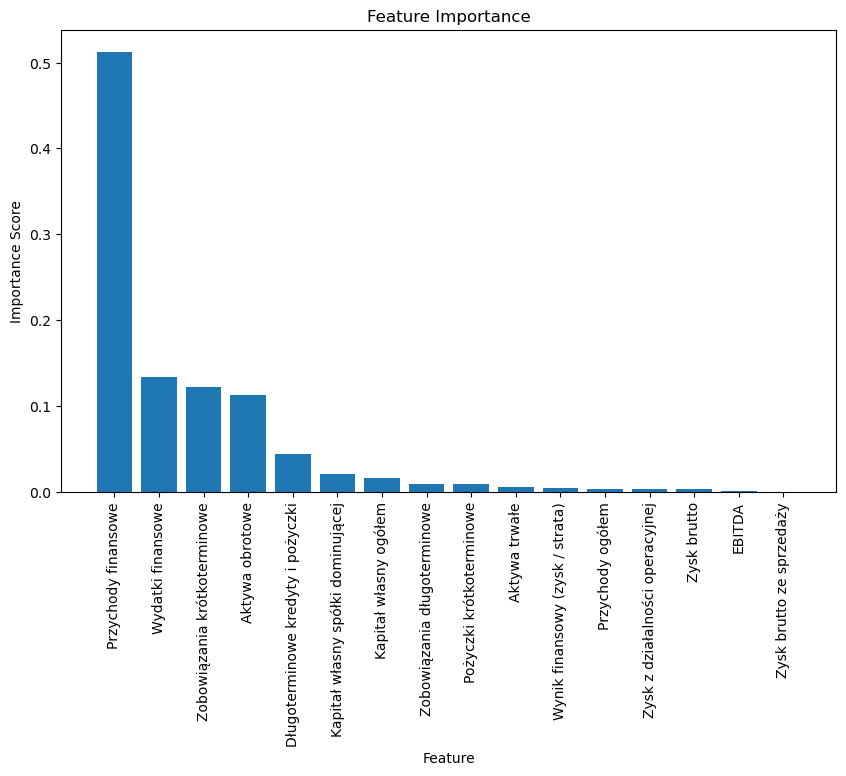

MAPE Wydatki finansowe:  64.6 %


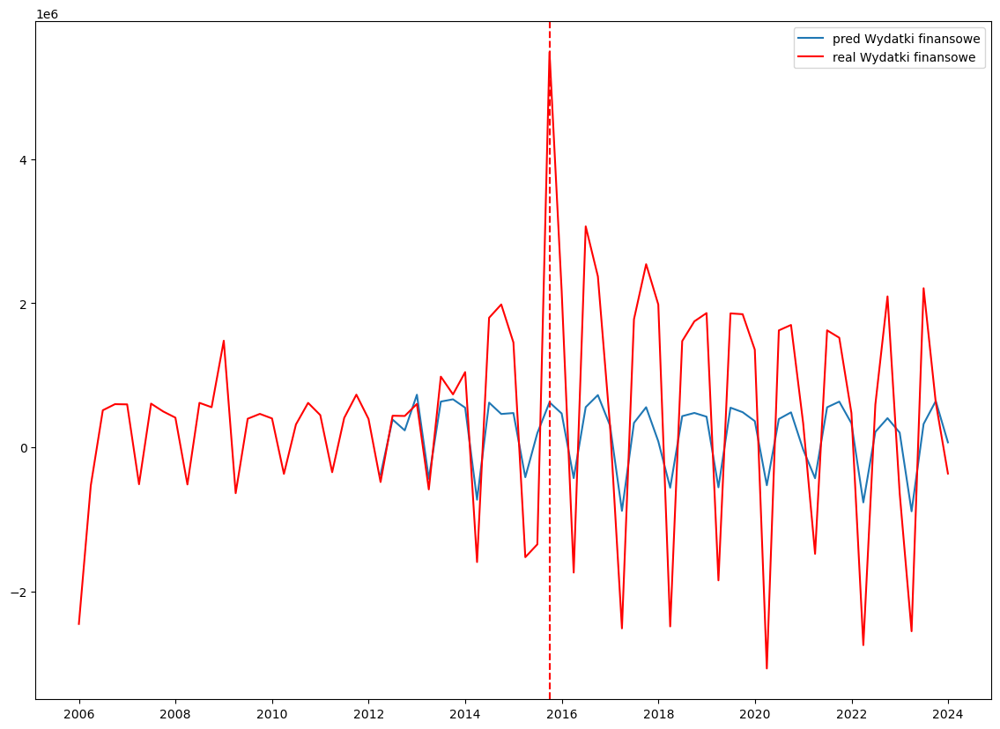

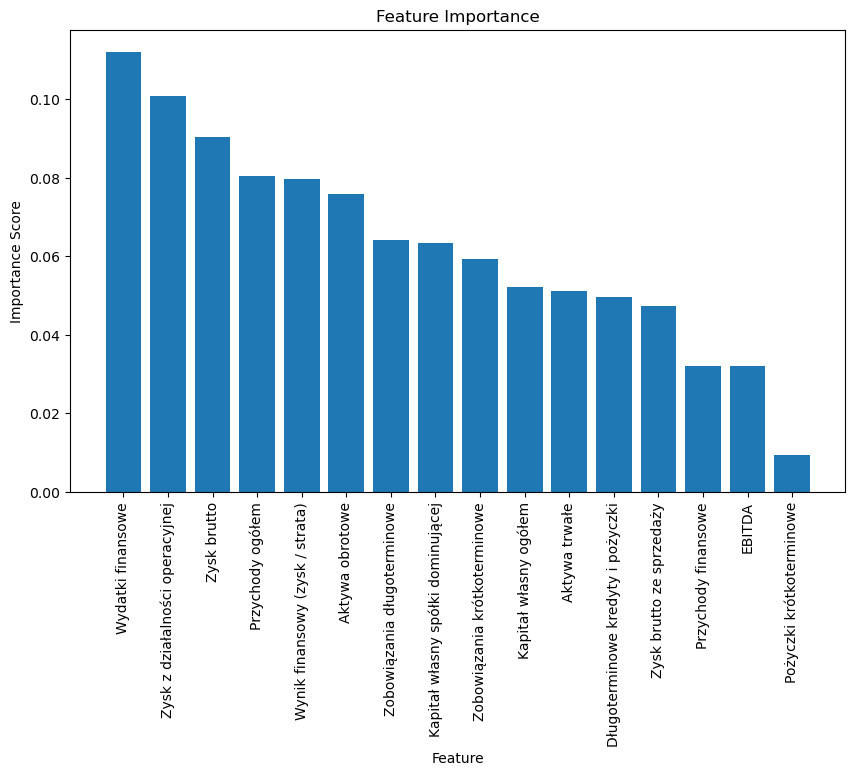

MAPE Zysk brutto:  50.24 %


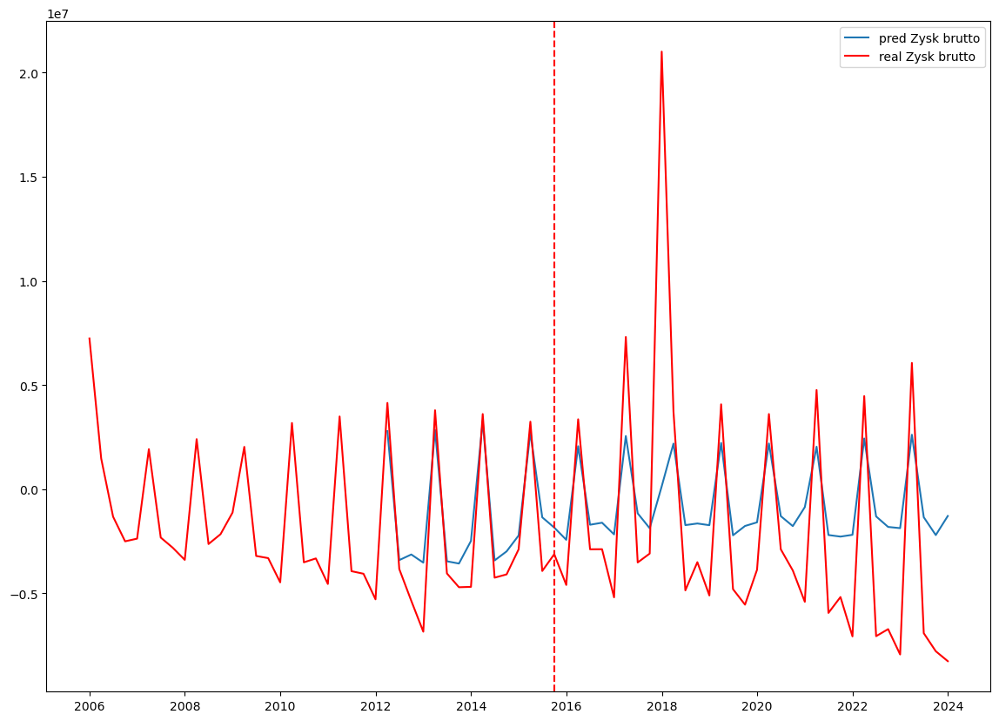

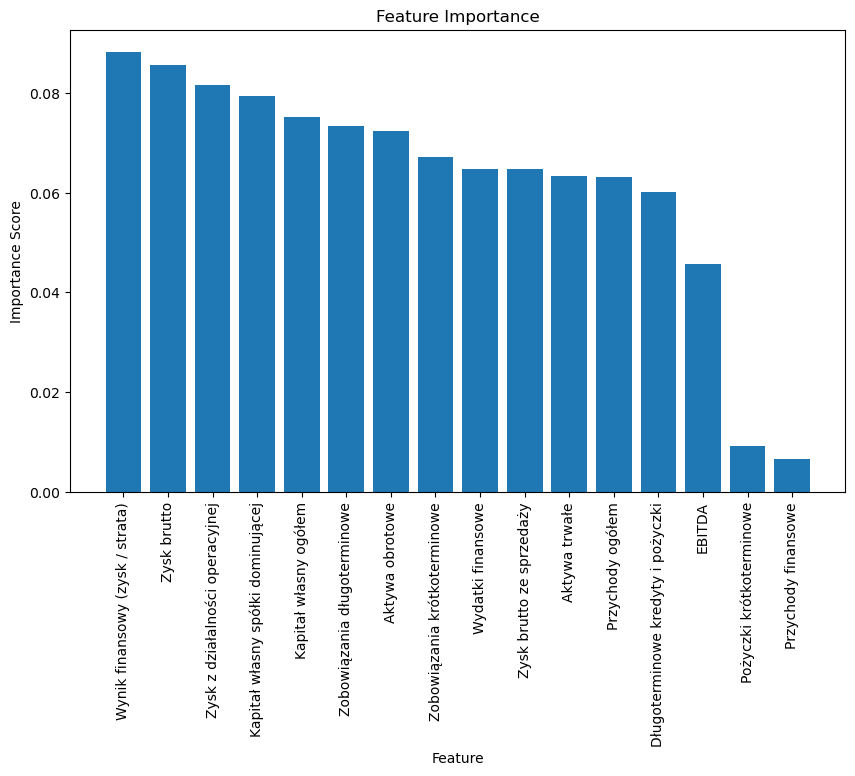

MAPE Aktywa trwałe:  84.92 %


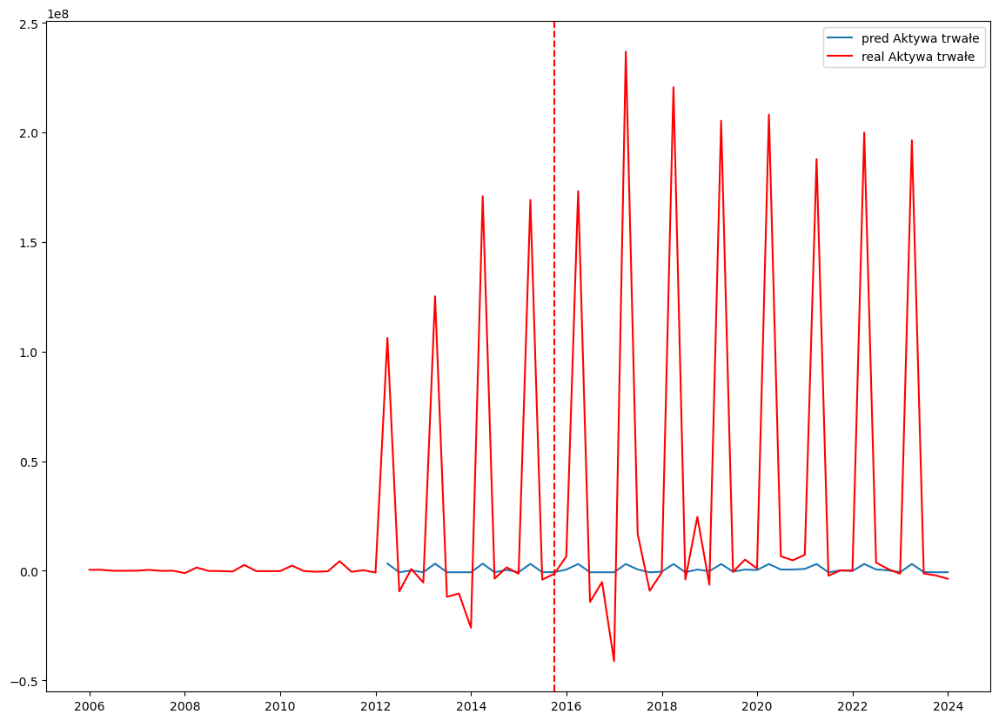

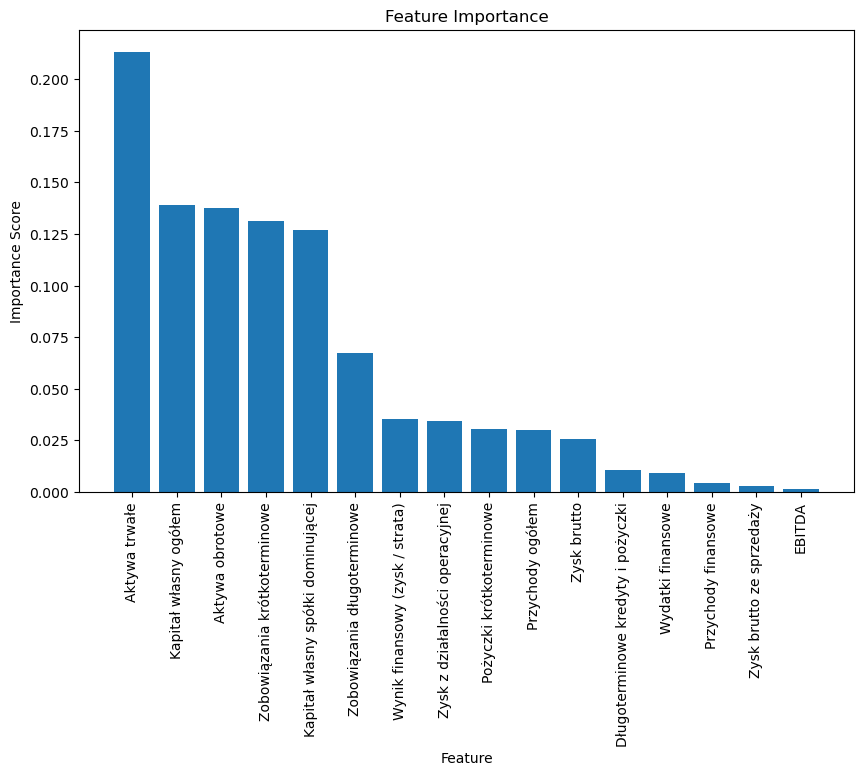

MAPE Aktywa obrotowe:  66.46 %


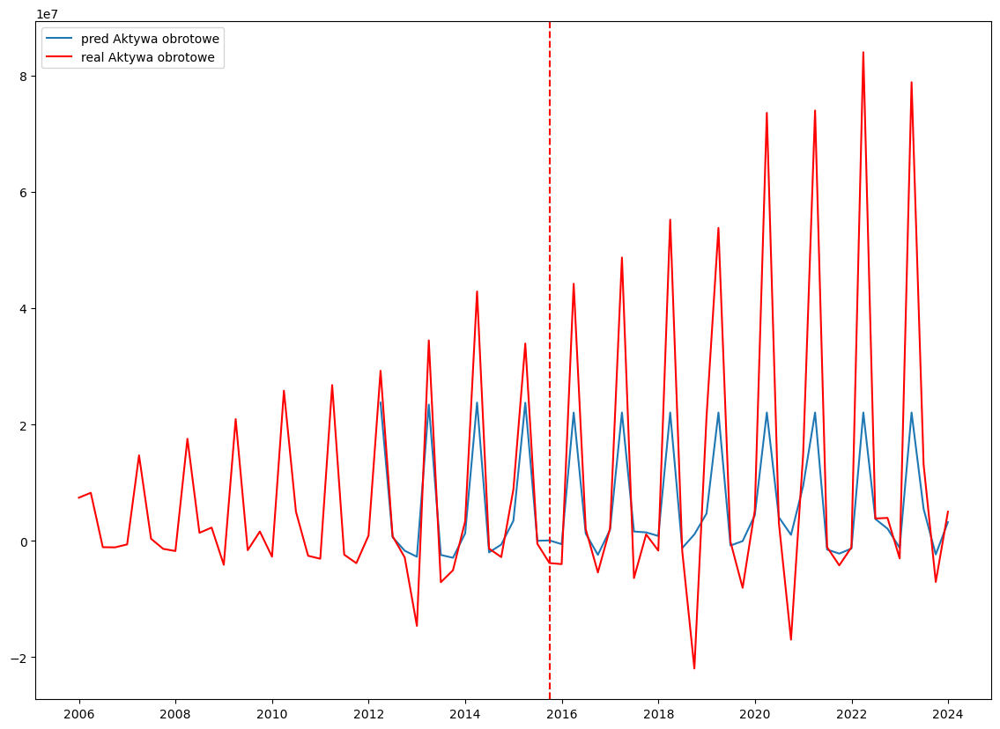

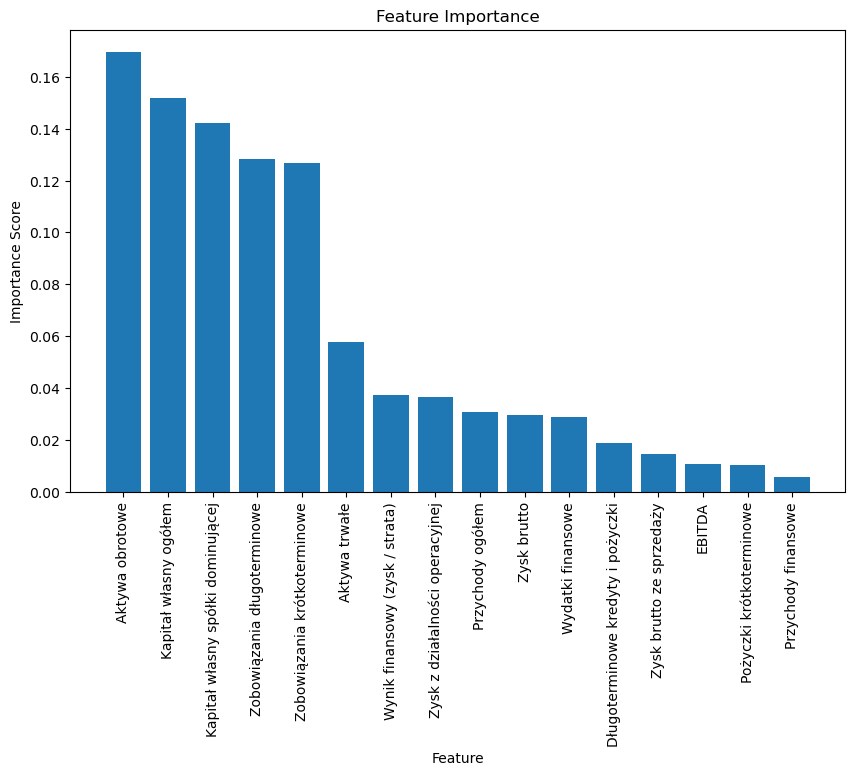

MAPE Kapitał własny ogółem:  1581.61 %


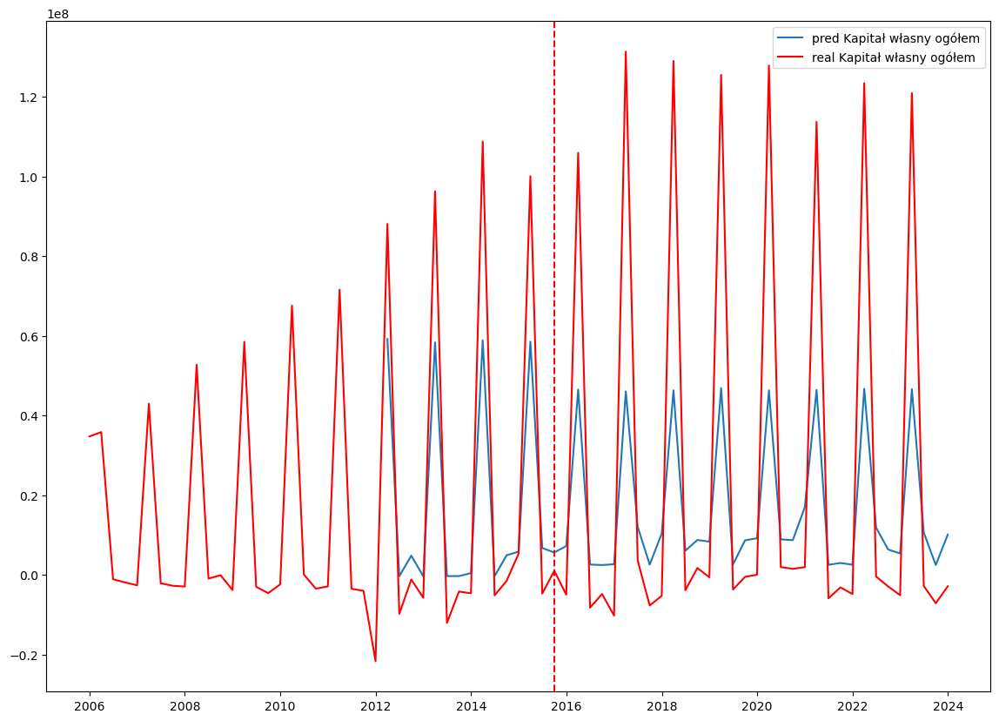

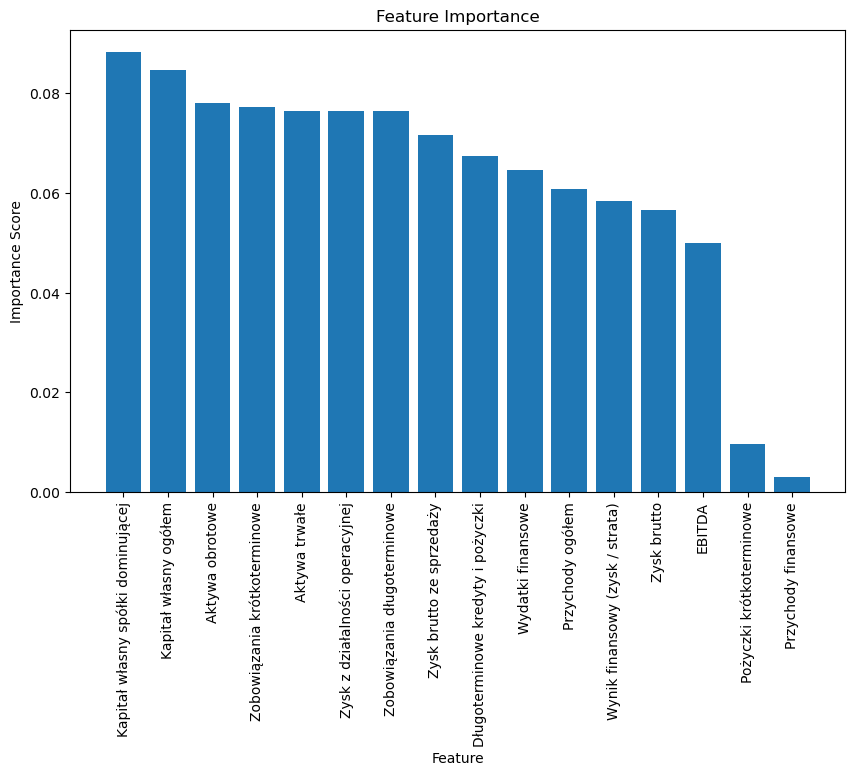

MAPE Kapitał własny spółki dominującej:  440.63 %


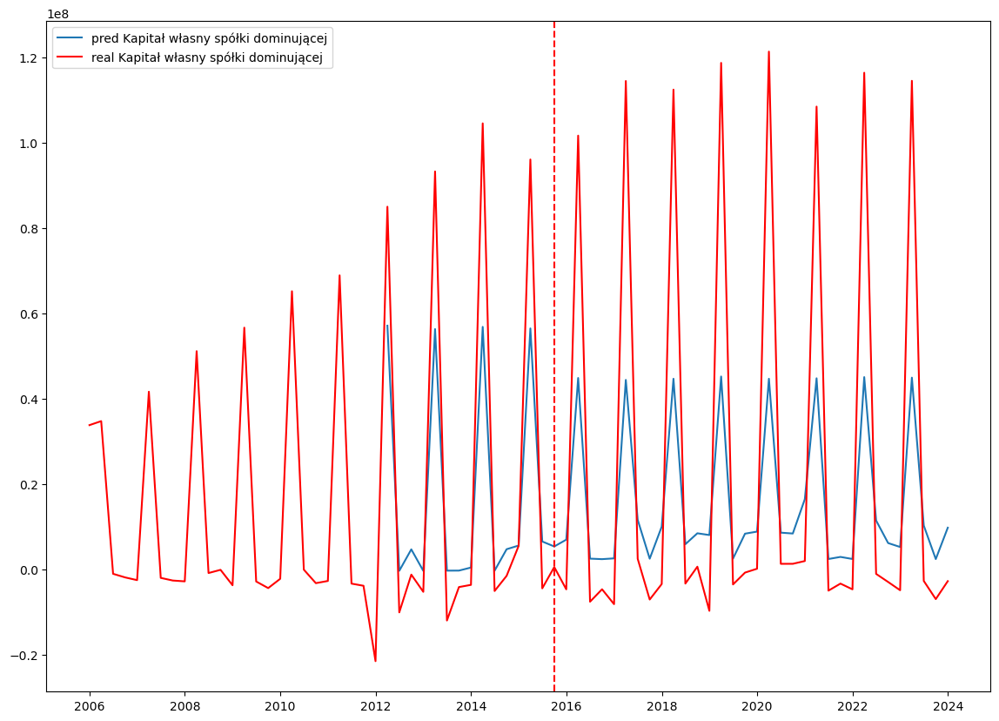

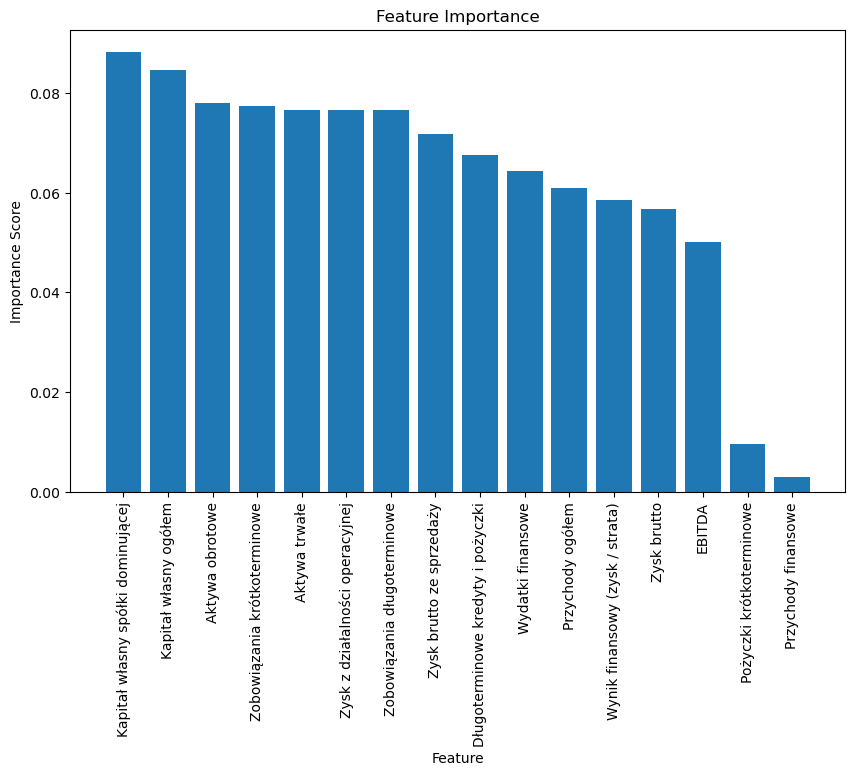

MAPE Zobowiązania długoterminowe:  301.54 %


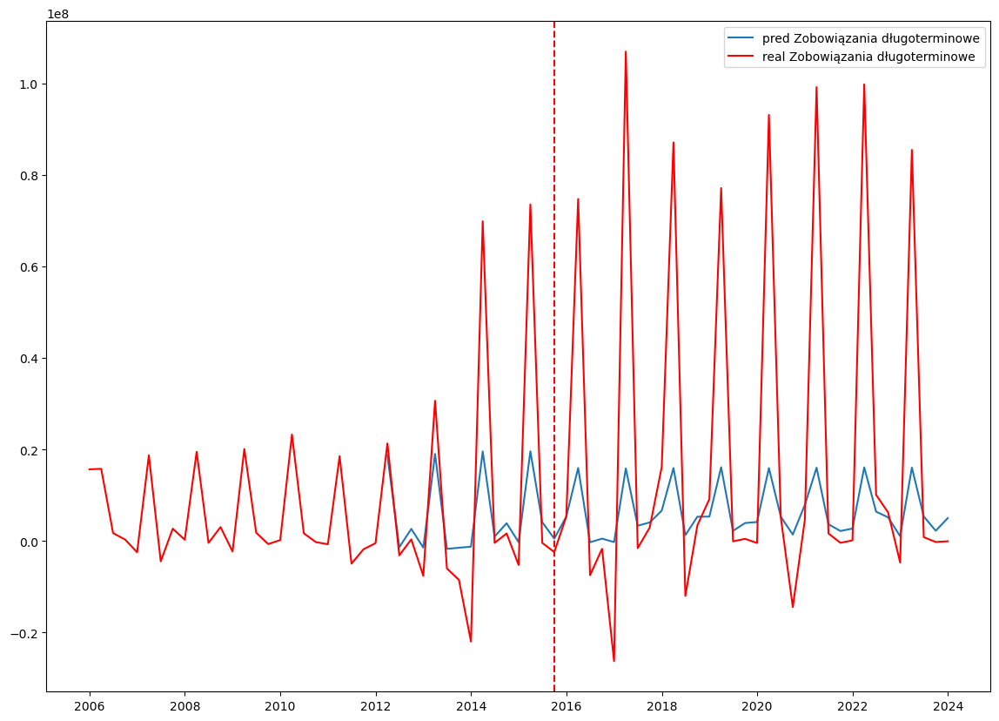

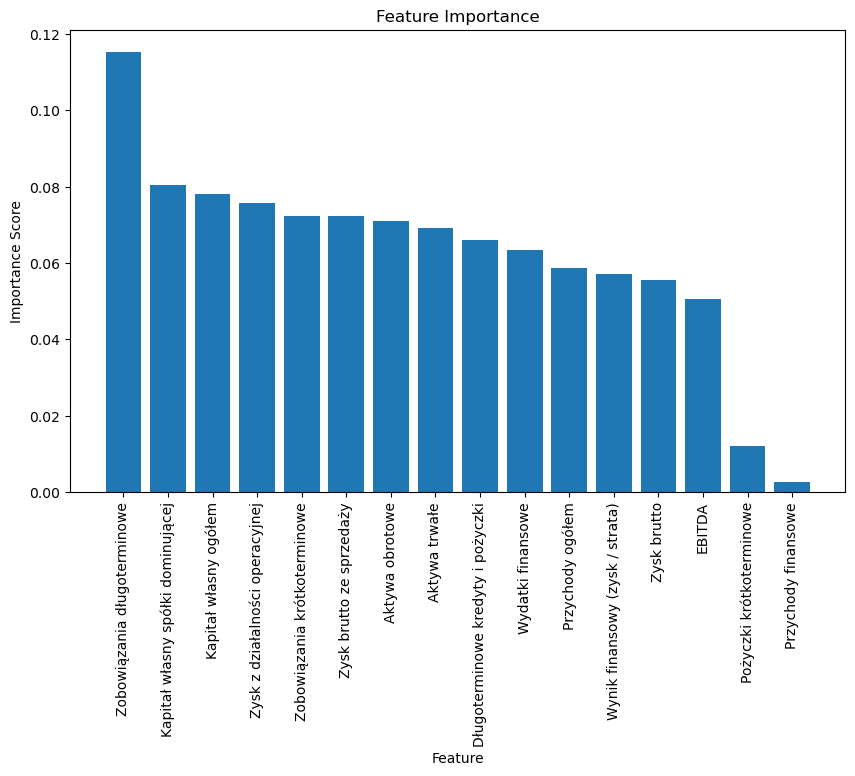

MAPE Długoterminowe kredyty i pożyczki:  365.86 %


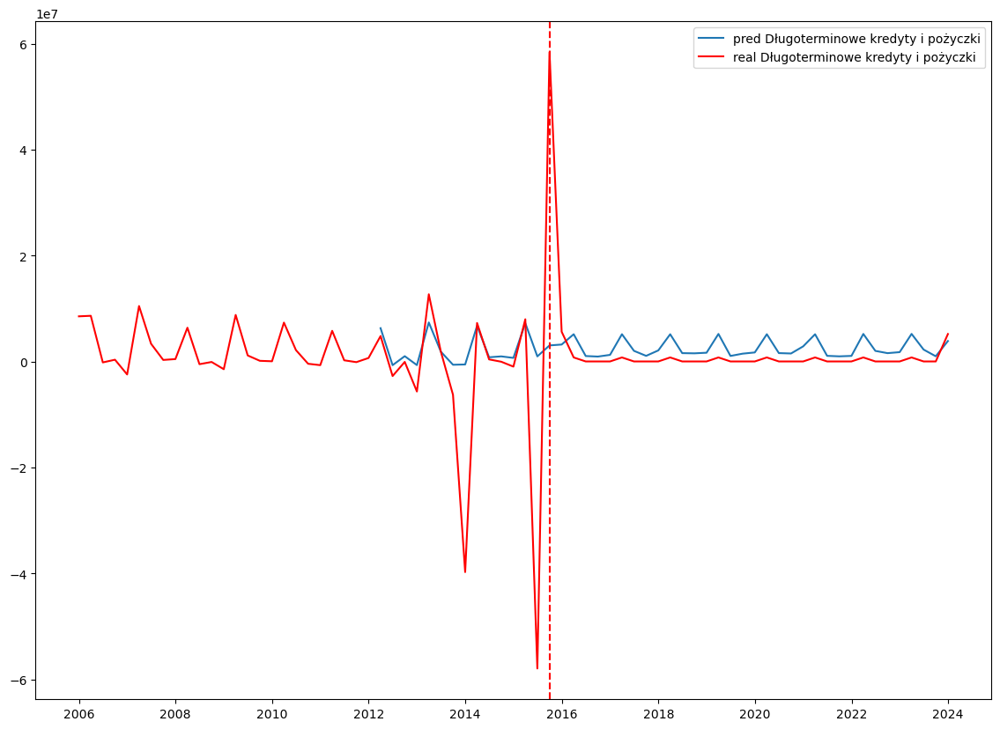

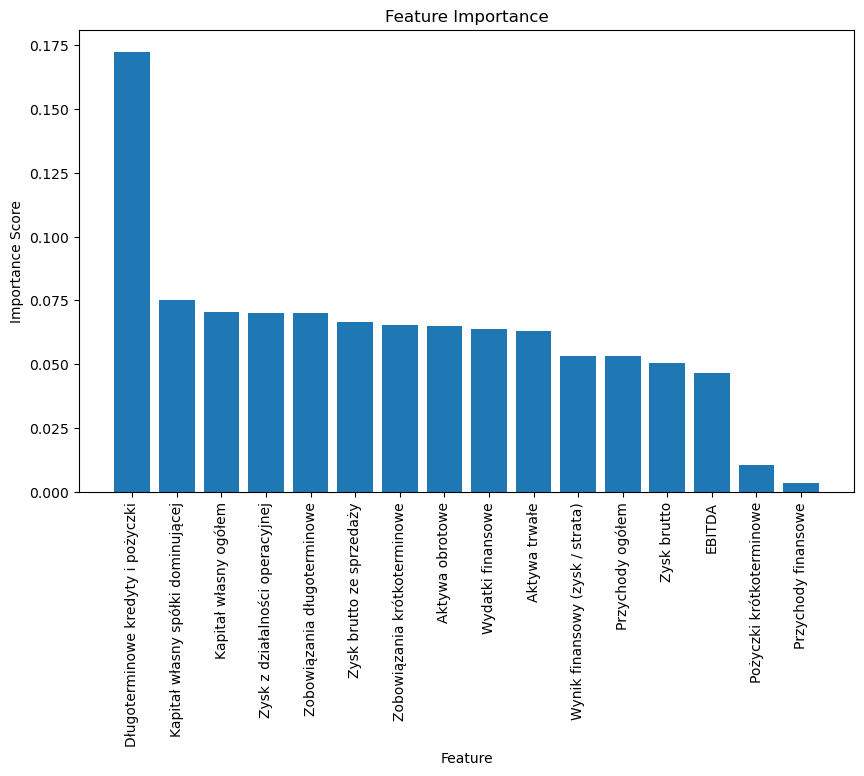

MAPE Zobowiązania krótkoterminowe:  118.24 %


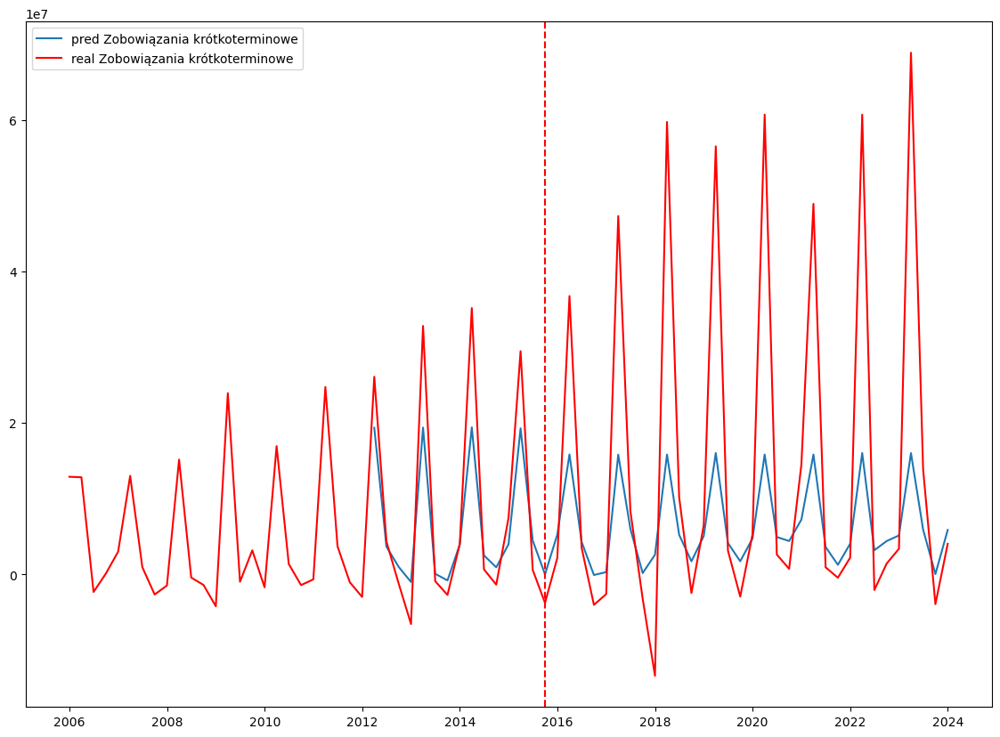

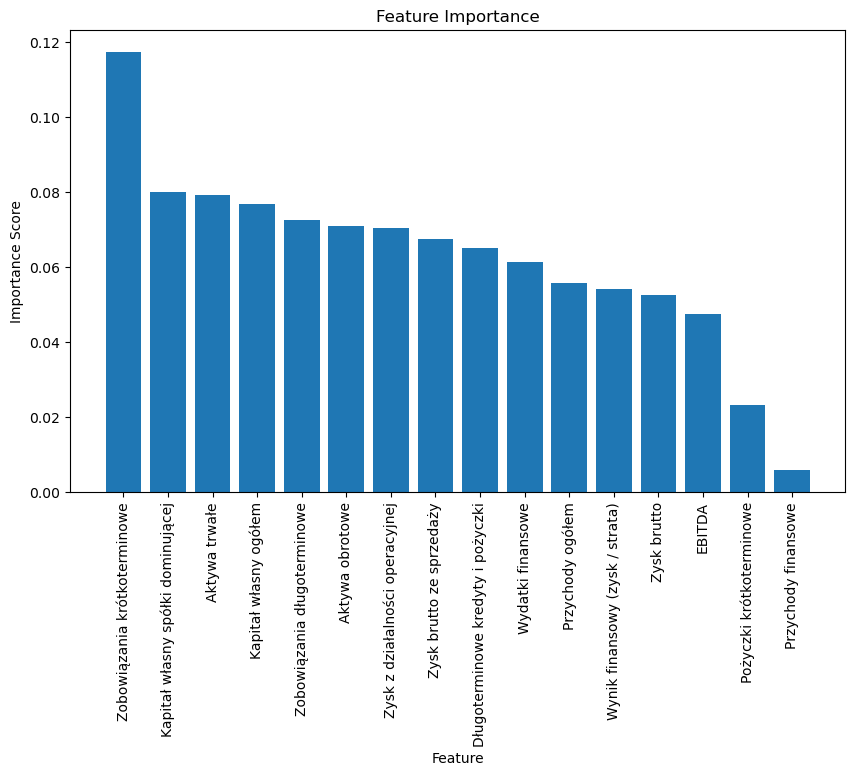

MAPE Pożyczki krótkoterminowe:  139.37 %


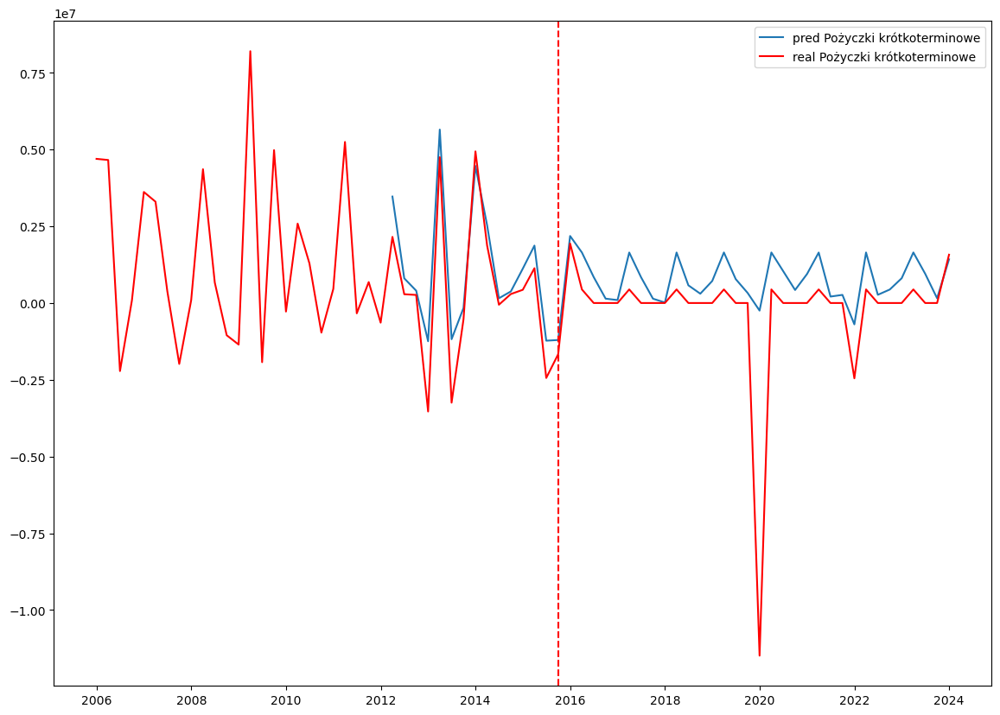

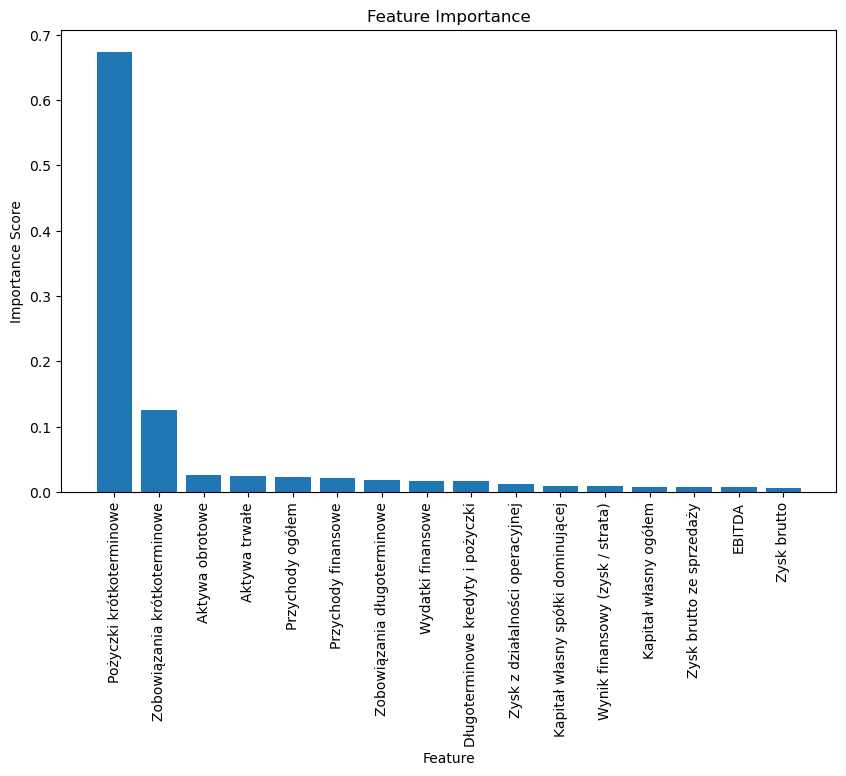

MAPE Wynik finansowy (zysk / strata):  112.22 %


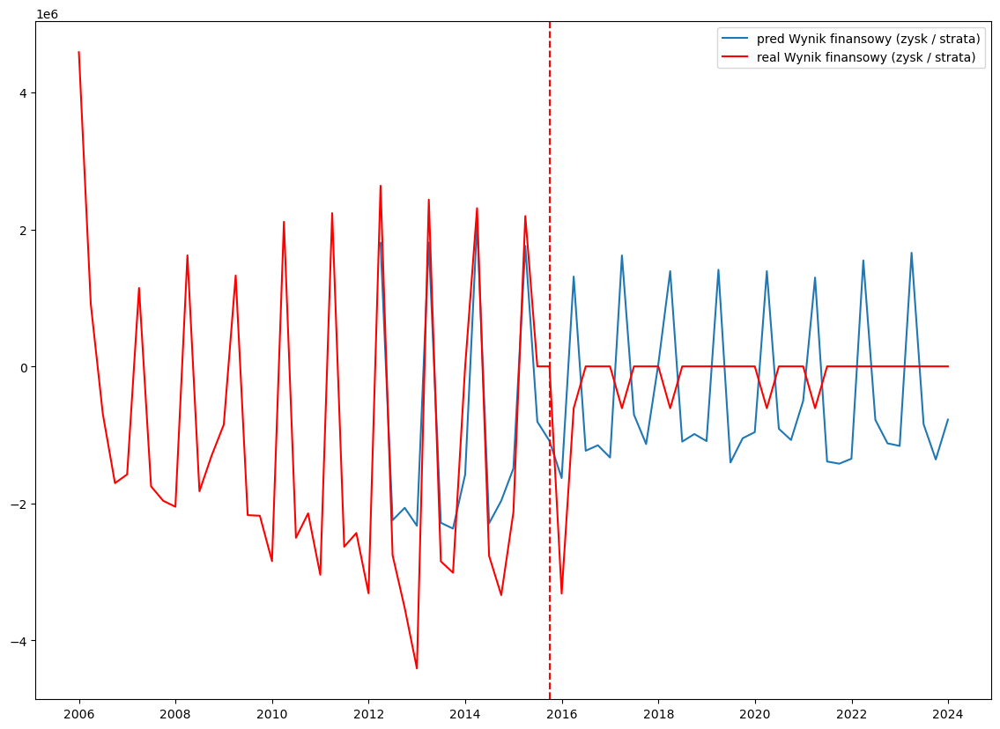

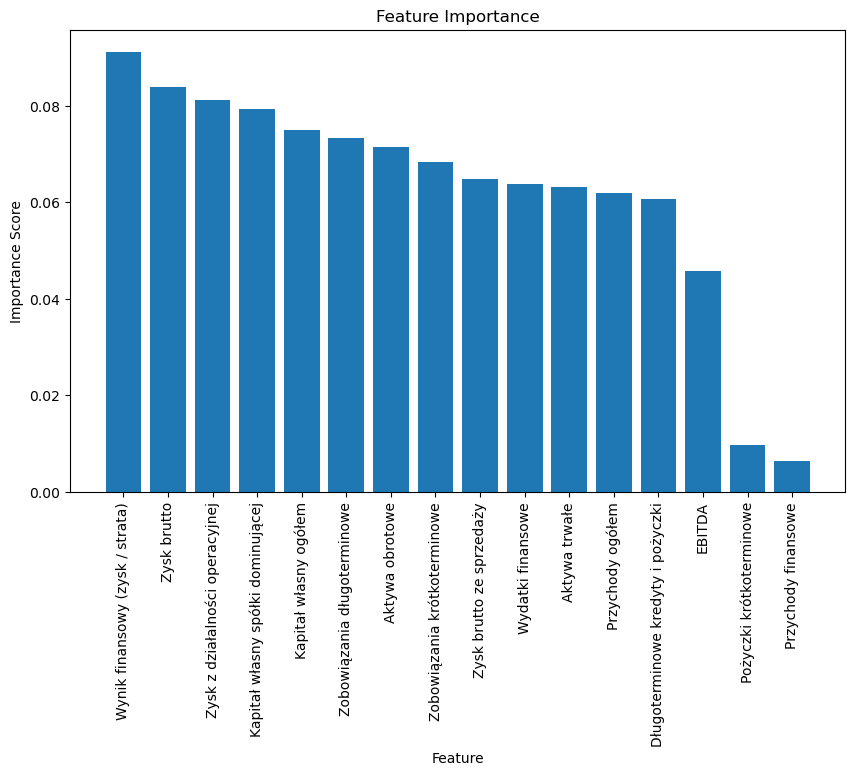

In [42]:
from sklearn.ensemble import RandomForestRegressor
from datetime import datetime

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """

    df = pd.DataFrame(data={"y_true":y_true[0],"y_pred":y_pred[0]}, index=y_true.index)
    df_filtered = df[df['y_true'] != 0]
    y_true, y_pred = np.array(df_filtered['y_true']), np.array(df_filtered['y_pred'])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

rf = RandomForestRegressor(n_estimators=1000, random_state=42)
best = list(random_forest_mol.columns)

for i in best:
    labels = np.array(random_forest_mol[f"{i}"])
        
    # Extracting features
    features = random_forest_mol
    features_np = np.array(features)
    
    
                                
    train_l = labels[:24]
    test_l = labels[25:]
        
    train_f = features_np[:24]
    test_f = features_np[25:]
    
    rf.fit(train_f, train_l)
    predictions = rf.predict(test_f)
    predictions = pd.DataFrame(predictions, index=features[25:].index)
    test_l = pd.DataFrame(test_l, random_forest_mol[f"{i}"][25:].index)
    f_list = list(features.columns)
    fig = plt.figure(figsize=(14,10))
    plt.plot(predictions, label=f"pred {i}")
    plt.plot(random_forest_mol[f"{i}"], c='r', label=f"real {i}")

    target_date = '2015-09-30'
    target_x = datetime.strptime(target_date, '%Y-%m-%d')


    plt.axvline(x=target_x, color='r', linestyle='--')
    plt.legend()
    
    mape = mean_absolute_percentage_error(test_l[:-1], predictions[:-1])
    #print("test_l:", test_l[0])
    #print("predictions:", predictions[0])
    print(f"MAPE {i}: ", round(mape,2),"%")

    feature_importances = rf.feature_importances_

    import matplotlib.pyplot as plt
    
    # Sort feature importances in descending order
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_feature_importances = feature_importances[sorted_indices]
    
    # Get the names of the features in the original order
    sorted_feature_names = np.array(f_list)[sorted_indices]
    
    # Plot feature importances
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
    plt.xticks(range(len(sorted_feature_importances)), sorted_feature_names, rotation=90)
    plt.xlabel('Feature')
    plt.ylabel('Importance Score')
    plt.title('Feature Importance')
    plt.show()

In [62]:
columns_to_drop = list(random_forest_mol.columns)
for i in columns_to_drop:
    if i.endswith("_"):
        random_forest_mol = random_forest_mol.drop(columns=i)

#random_forest_mol = random_forest_mol.drop(columns=["Rok", "Q"])

Best Parameters Przychody ogółem: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 3, 'max_depth': 3, 'subsample': 0.8}
Best MSE Przychody ogółem: 5061464.090840155


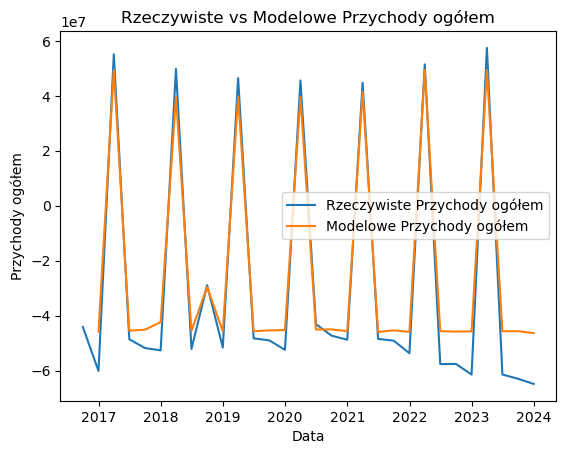

Best Parameters Zysk brutto ze sprzedaży: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 0, 'max_depth': 8, 'subsample': 0.8}
Best MSE Zysk brutto ze sprzedaży: 1138980.3323895477


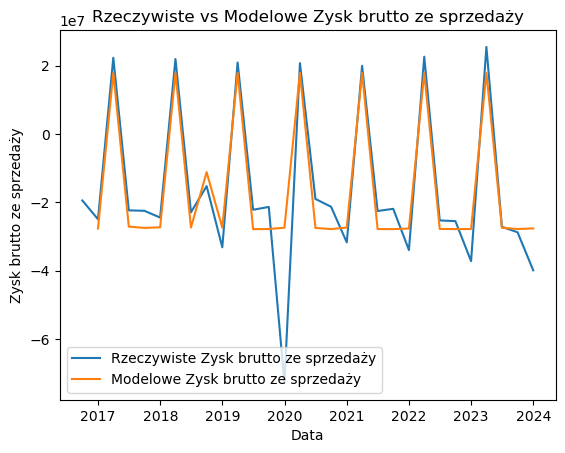

Best Parameters Zysk z działalności operacyjnej: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.8}
Best MSE Zysk z działalności operacyjnej: 1173314.3706228686


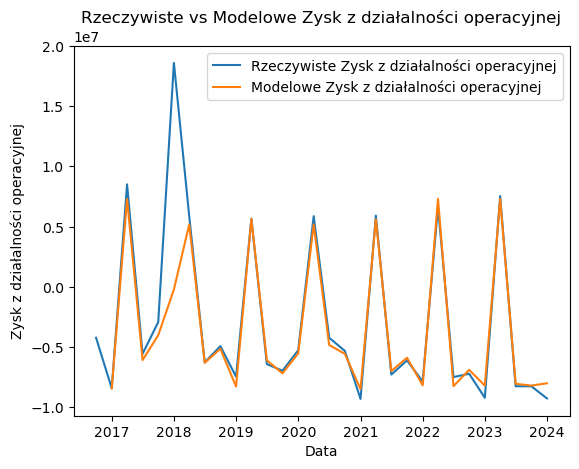

Best Parameters EBITDA: {'colsample_bytree': 1.0, 'eta': 0.01, 'lambda': 3, 'max_depth': 3, 'subsample': 0.8}
Best MSE EBITDA: 1112129.450351039


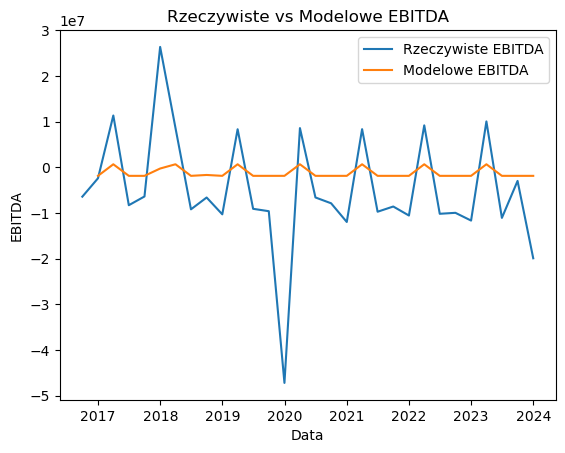

Best Parameters Przychody finansowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.5}
Best MSE Przychody finansowe: 351202.0693132522


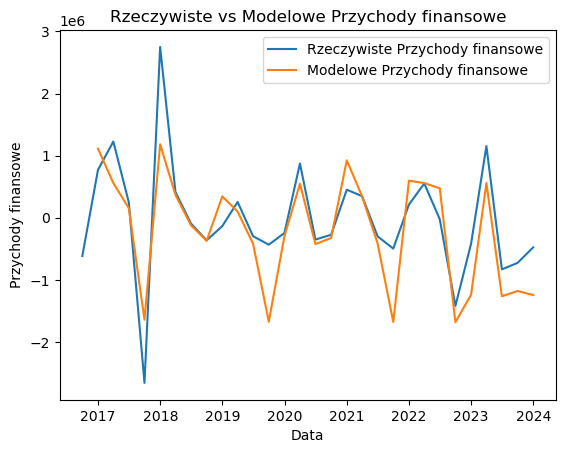

Best Parameters Wydatki finansowe: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 0, 'max_depth': 4, 'subsample': 0.7}
Best MSE Wydatki finansowe: 597533.9013783897


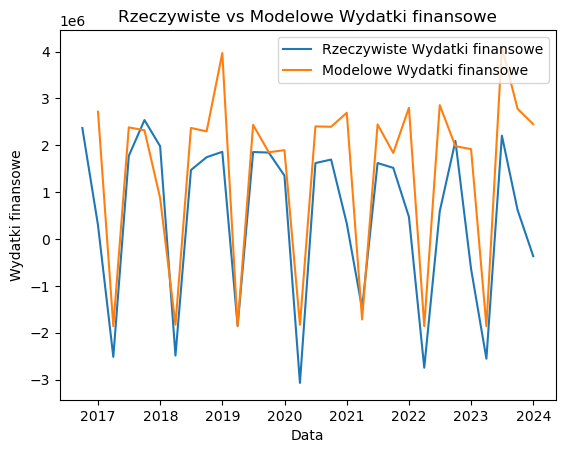

Best Parameters Zysk brutto: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.8}
Best MSE Zysk brutto: 694804.1089252213


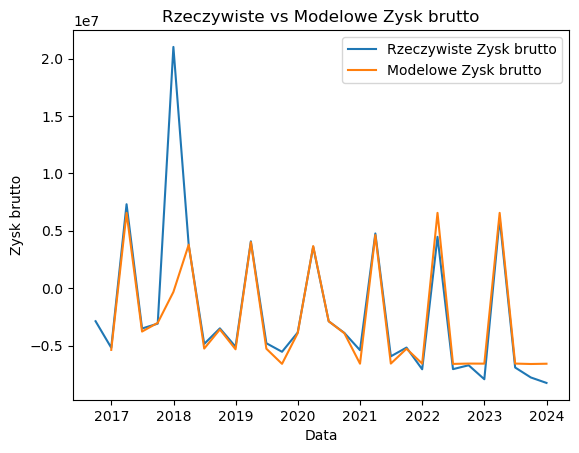

Best Parameters Aktywa trwałe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 3, 'subsample': 0.5}
Best MSE Aktywa trwałe: 20679127.38599317


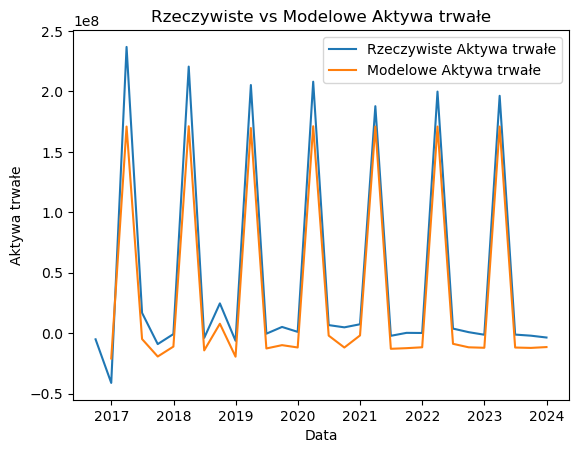

Best Parameters Aktywa obrotowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 3, 'subsample': 0.7}
Best MSE Aktywa obrotowe: 4553950.467183246


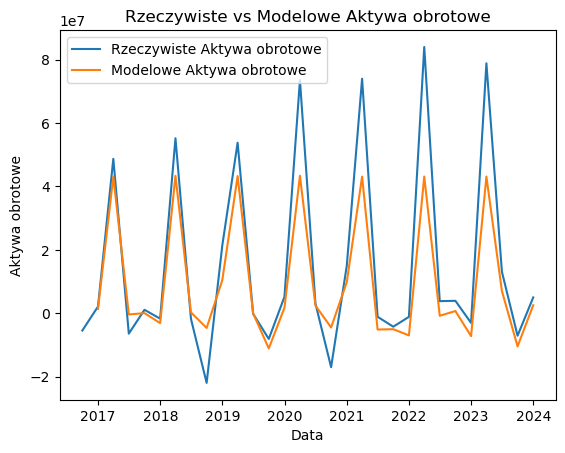

Best Parameters Kapitał własny ogółem: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 3, 'subsample': 0.7}
Best MSE Kapitał własny ogółem: 8722262.516504621


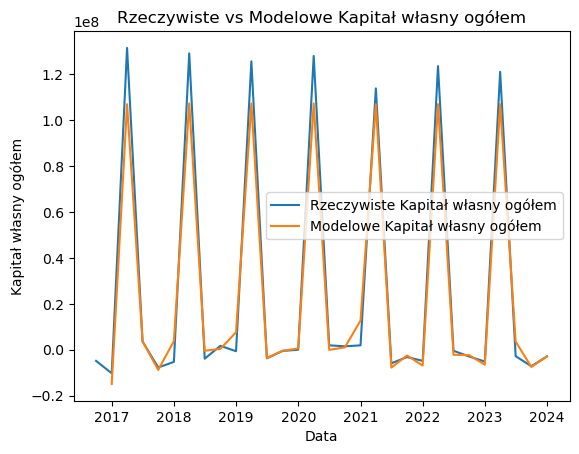

Best Parameters Kapitał własny spółki dominującej: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 3, 'subsample': 0.7}
Best MSE Kapitał własny spółki dominującej: 8647365.413317414


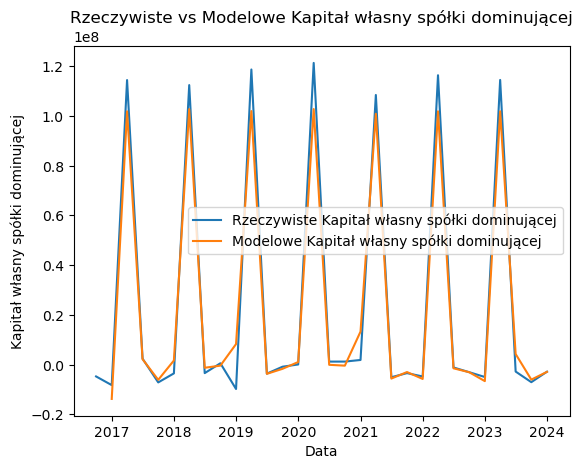

Best Parameters Zobowiązania długoterminowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 3, 'subsample': 0.6}
Best MSE Zobowiązania długoterminowe: 7304991.606251694


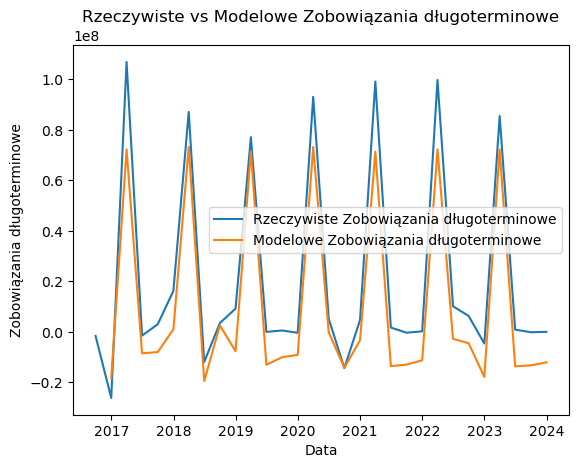

Best Parameters Długoterminowe kredyty i pożyczki: {'colsample_bytree': 1.0, 'eta': 0.01, 'lambda': 5, 'max_depth': 3, 'subsample': 0.7}
Best MSE Długoterminowe kredyty i pożyczki: 9747425.807663085


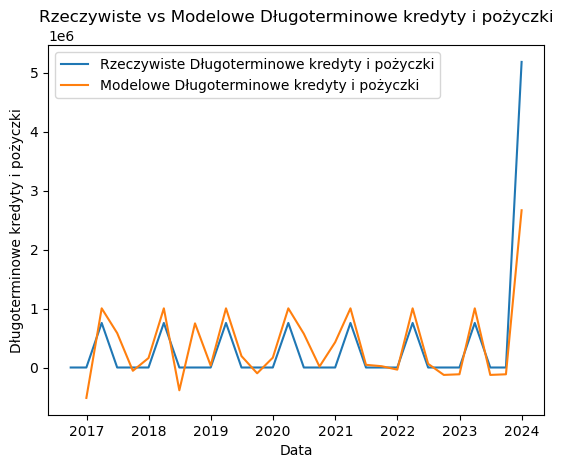

Best Parameters Zobowiązania krótkoterminowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 5, 'subsample': 0.8}
Best MSE Zobowiązania krótkoterminowe: 2592982.712073522


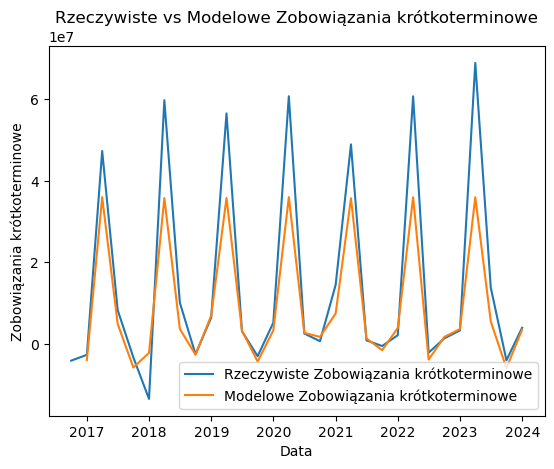

Best Parameters Pożyczki krótkoterminowe: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 1, 'max_depth': 7, 'subsample': 0.8}
Best MSE Pożyczki krótkoterminowe: 549583.5273896225


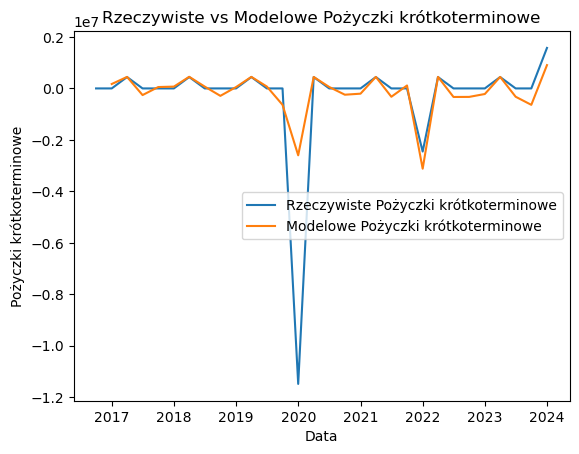

Best Parameters Wynik finansowy (zysk / strata): {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.8}
Best MSE Wynik finansowy (zysk / strata): 528714.9780448346


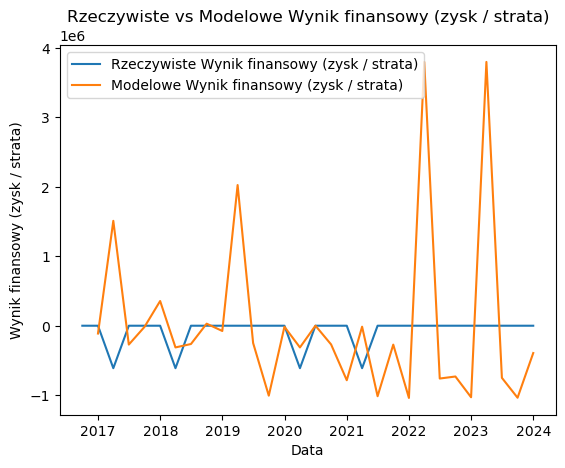

In [43]:
#eXtreme Gradient Boost

#Wydzielam dane na zbiory testowe i treningowe
#W nastepnym kroku stosuje metode krzyzowej walidacji, aby ustalić dla jakich parametrów model ma najlepsze dopasowanie
#za parametr oceny stosuje ujemny pierwiastek ze średniego błędu kwadratowego


import xgboost as xgb
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt

#random_forest_mol = random_forest_mol.drop(columns=["Rok", "Q"], axis=1)
for i in list(random_forest_mol.columns):
    labels = random_forest_mol[f"{i}"]
        
    features = random_forest_mol
    train_l = labels[:43]
    test_l = labels[44:]
        
    train_f = features[:43]
    test_f = features[44:]
        
    
    dtrain = xgb.DMatrix(train_f, label=train_l.to_numpy().reshape(-1,1))
    dtest = xgb.DMatrix(test_f, label=test_l.to_numpy().reshape(-1,1))
    
    param_grid = {
        'max_depth': [3,4,5,6,7,8,9,10],
        'eta': [0.01, 0.2],
        'subsample': [0.5,0.6,0.7,0.8,],
        'colsample_bytree': [0.8, 1.0],
        'lambda' : [0, 1, 3, 5]
    }
    
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror')
    
    grid_search = GridSearchCV(estimator=xgb_regressor, param_grid=param_grid, scoring='neg_root_mean_squared_error', cv=5)
    grid_search.fit(train_f, train_l)
    
    best_params = grid_search.best_params_
    
    print(f"Best Parameters {i}:", grid_search.best_params_)
    print(f"Best MSE {i}:", -grid_search.best_score_)

    num_rounds = 100
    model = xgb.train(best_params, dtrain, num_rounds)


    predictions_train = model.predict(dtrain)
    forecast_train = pd.DataFrame(predictions_train, columns=[f"{i}"])
    forecast_train.index = features[:43].index
    
    predictions_test = model.predict(dtest)
    forecast_test = pd.DataFrame(predictions_test, columns=[f"{i}"])
    forecast_test.index = features[44:].index

    actual_values = labels[43:]

    plt.plot(actual_values, label=f'Rzeczywiste {i}')
    plt.plot(forecast_test, label=f'Modelowe {i}')
        
    plt.xlabel('Data')
    plt.ylabel(f'{i}')
    plt.title(f'Rzeczywiste vs Modelowe {i}')
    plt.legend()    
    plt.show()


#Zgodnie z metodą wychodzi, że powinnienem ustawić model na anstępujące parametry:
#- colsample_bytree: 1
#- eta: 0.2
#- lambda: 0.1
#- max_depth: 4
#- subsample: 0.6
#Dla podanych parametrów dopasowany model osiąga średni błąd kwadratowy 437309727.4168719


Przychody ogółem
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 274ms/step - loss: 732390104236032.0000 - mae: 25406654.0000 - val_loss: 1953181340794880.0000 - val_mae: 42769828.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 645789604904960.0000 - mae: 23426318.0000 - val_loss: 1709945665880064.0000 - val_mae: 38820652.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 538535480262656.0000 - mae: 20864434.0000 - val_loss: 1525807398780928.0000 - val_mae: 35021196.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 502209921941504.0000 - mae: 19513202.0000 - val_loss: 1388535277944832.0000 - val_mae: 32919486.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 452110437056512.0000 - mae: 18479356.0000 - val_loss: 1278482512347136.0000 - val_mae: 32462850.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 409501375135744.0000 - mae: 18031130.0000 - val_loss: 1174646443474944.0000 - val_mae: 31674896.0000
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━

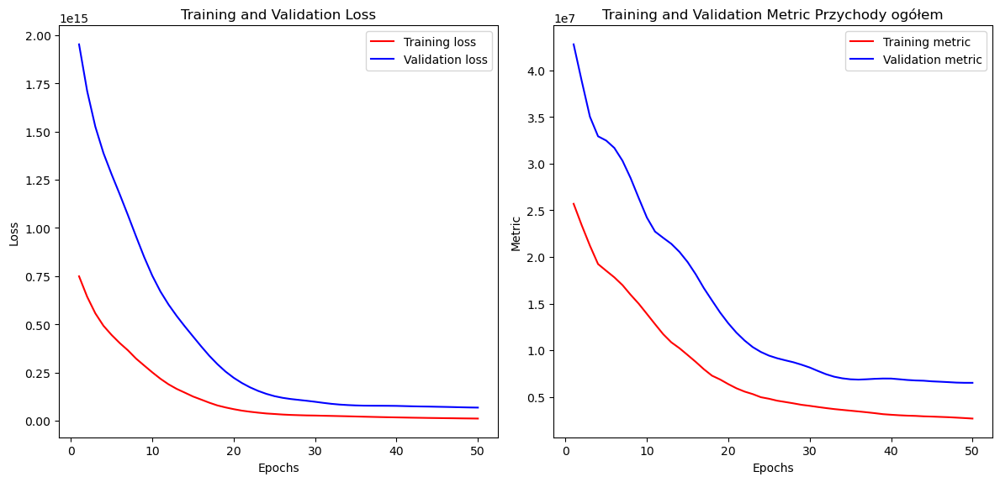

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10735717449728.0000 - mae: 2652320.7500 
Test accuracy: 2639364.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


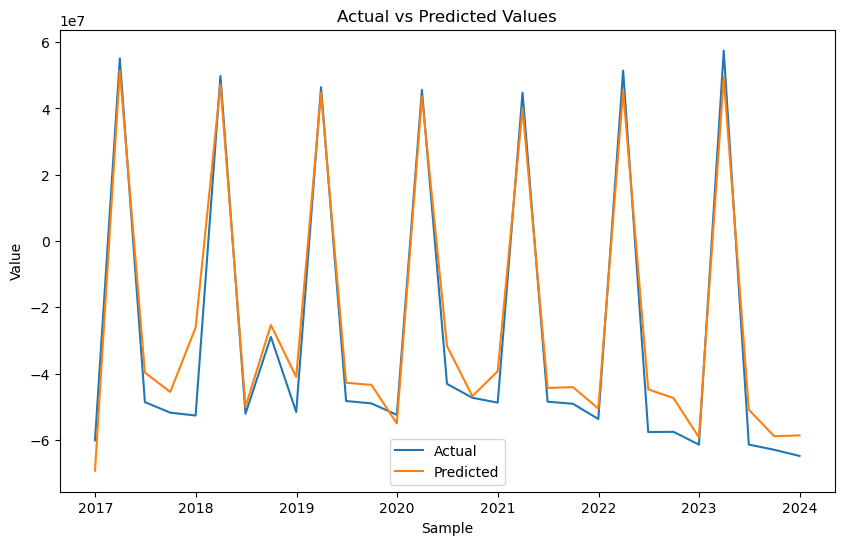

MAPE Przychody ogółem:  84.91 %
Zysk brutto ze sprzedaży
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 277ms/step - loss: 234750279155712.0000 - mae: 10012520.0000 - val_loss: 468504293670912.0000 - val_mae: 20312400.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 132449904361472.0000 - mae: 8372916.5000 - val_loss: 318565810962432.0000 - val_mae: 16111662.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 92183378001920.0000 - mae: 7720071.5000 - val_loss: 244191691014144.0000 - val_mae: 12900414.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 70694524157952.0000 - mae: 7208634.5000 - val_loss: 225682697224192.0000 - val_mae: 13404146.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 53437064544256.0000 - mae: 6283817.0000 - val_loss: 232645594185728.0000 - val_mae: 13795567.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 53937671503872.0000 - mae: 6568117.0000 - val_loss: 240355916120064.0000 - val_mae: 13624387.0000
Epoch 7/5

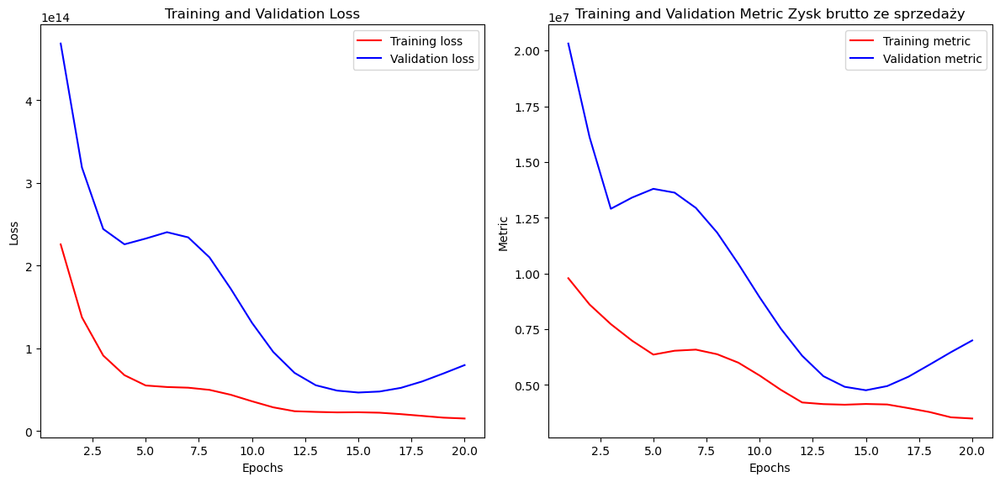

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 23745267761152.0000 - mae: 4312606.5000 
Test accuracy: 4127199.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


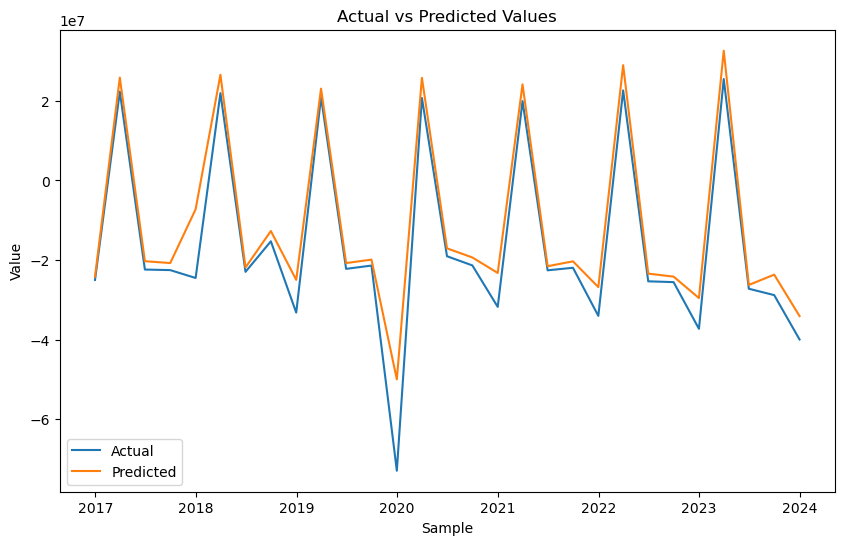

MAPE Zysk brutto ze sprzedaży:  94.84 %
Zysk z działalności operacyjnej
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 287ms/step - loss: 139120617717760.0000 - mae: 10791110.0000 - val_loss: 208317389471744.0000 - val_mae: 13790995.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 81977067700224.0000 - mae: 8329684.5000 - val_loss: 126308210180096.0000 - val_mae: 10384351.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 51836786573312.0000 - mae: 6225035.0000 - val_loss: 90425545195520.0000 - val_mae: 8545726.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 33339448754176.0000 - mae: 5006317.5000 - val_loss: 79985914150912.0000 - val_mae: 8157994.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 30468315545600.0000 - mae: 4590065.0000 - val_loss: 71975707869184.0000 - val_mae: 7690001.5000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 25290122199040.0000 - mae: 4043699.2500 - val_loss: 56610328150016.0000 - val_mae: 6544008.5000
Epo

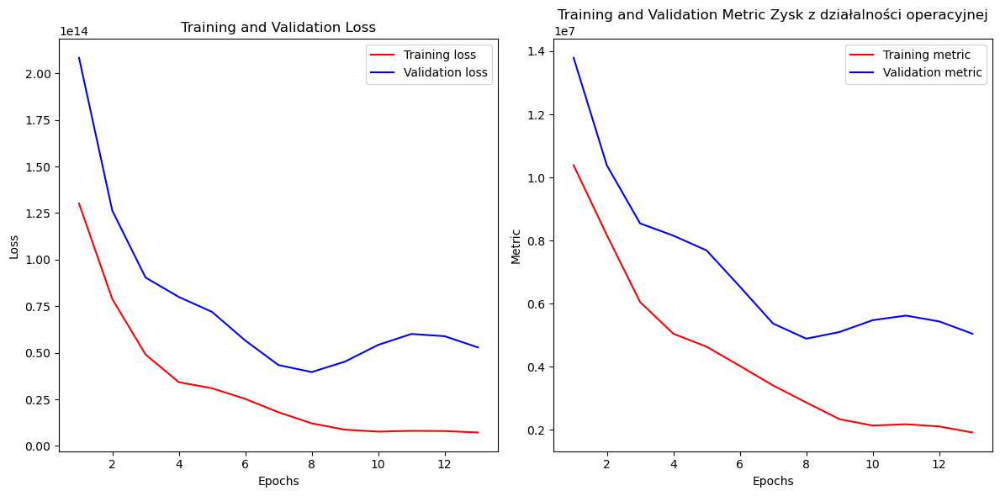

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7444880687104.0000 - mae: 2204575.0000 
Test accuracy: 2400543.5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


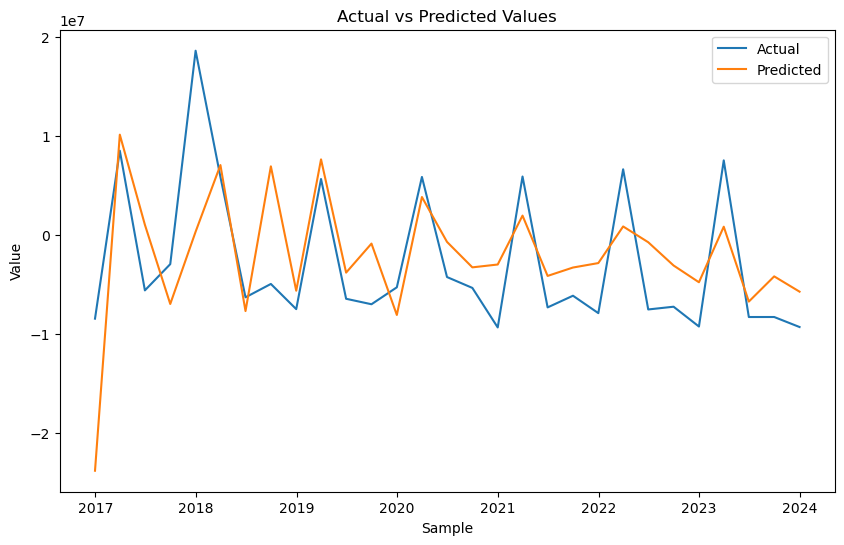

MAPE Zysk z działalności operacyjnej:  107.88 %
EBITDA
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 266ms/step - loss: 14048370360320.0000 - mae: 2653658.7500 - val_loss: 193894637633536.0000 - val_mae: 9996213.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 12657267572736.0000 - mae: 2780469.2500 - val_loss: 174948177936384.0000 - val_mae: 8823923.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 11284526399488.0000 - mae: 2445365.0000 - val_loss: 178443526340608.0000 - val_mae: 9605800.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 7723671879680.0000 - mae: 1907226.7500 - val_loss: 200492613369856.0000 - val_mae: 10957422.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 6305791082496.0000 - mae: 1704433.2500 - val_loss: 205871573368832.0000 - val_mae: 11309254.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 6768111386624.0000 - mae: 1722806.7500 - val_loss: 194846006444032.0000 - val_mae: 10931631.0000
Epoch 7/50
2/2 ━━━━━

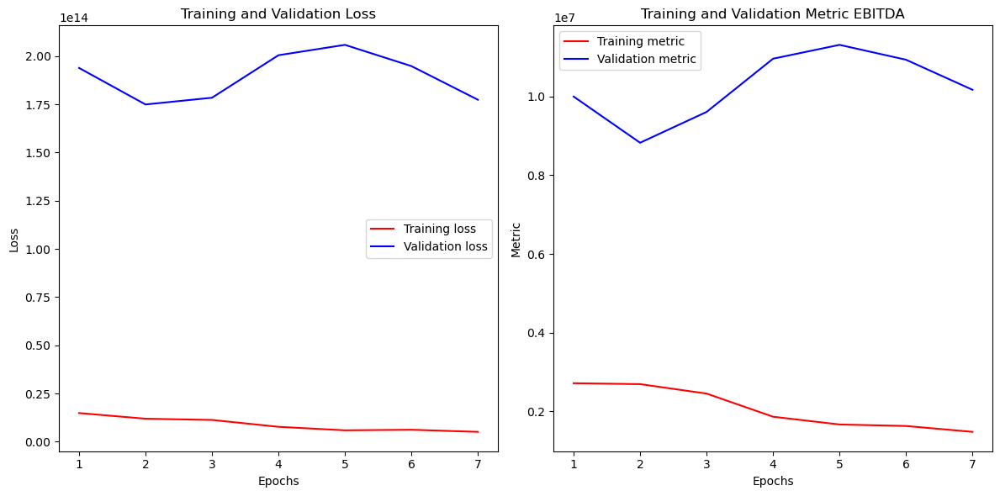

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 11773017063424.0000 - mae: 2509248.2500 
Test accuracy: 2563850.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


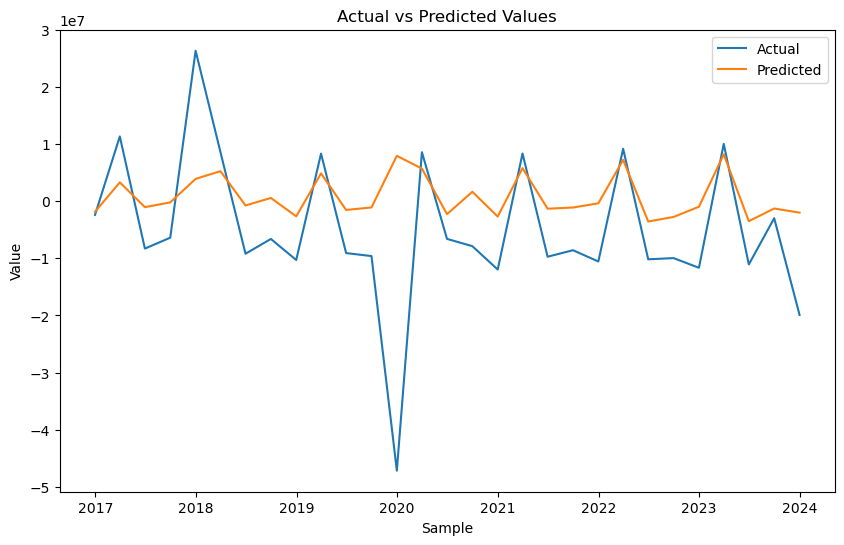

MAPE EBITDA:  106.57 %
Przychody finansowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 320ms/step - loss: 23895822303232.0000 - mae: 3317260.2500 - val_loss: 18653143629824.0000 - val_mae: 3380434.2500
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 16232044560384.0000 - mae: 2786730.7500 - val_loss: 13541317804032.0000 - val_mae: 2561980.2500
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 9463360651264.0000 - mae: 2023066.1250 - val_loss: 8792448696320.0000 - val_mae: 2152416.2500
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 5119096127488.0000 - mae: 1520730.2500 - val_loss: 6457877069824.0000 - val_mae: 1995380.3750
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 2798303576064.0000 - mae: 1103208.1250 - val_loss: 5814911762432.0000 - val_mae: 1923754.1250
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1952525975552.0000 - mae: 895042.2500 - val_loss: 5399092658176.0000 - val_mae: 1826906.1250
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/ste

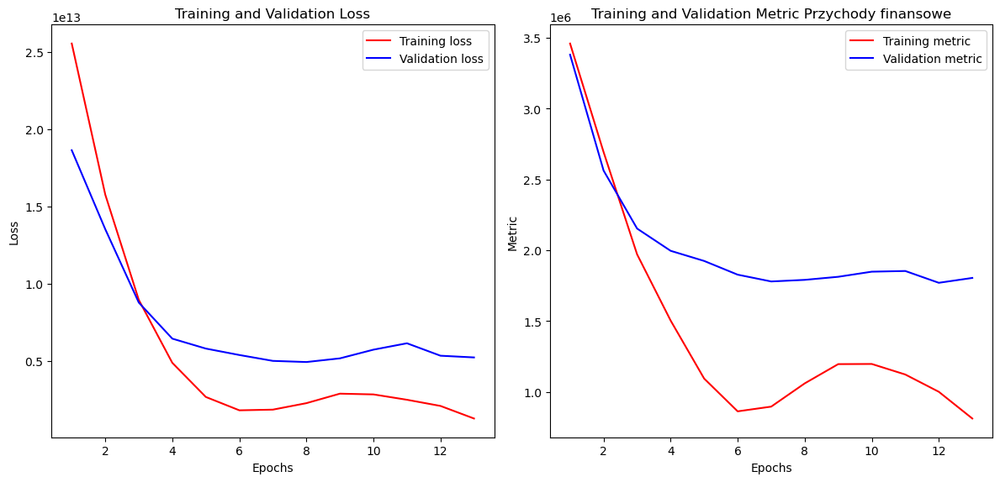

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2960206856192.0000 - mae: 1180653.8750 
Test accuracy: 1168726.875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


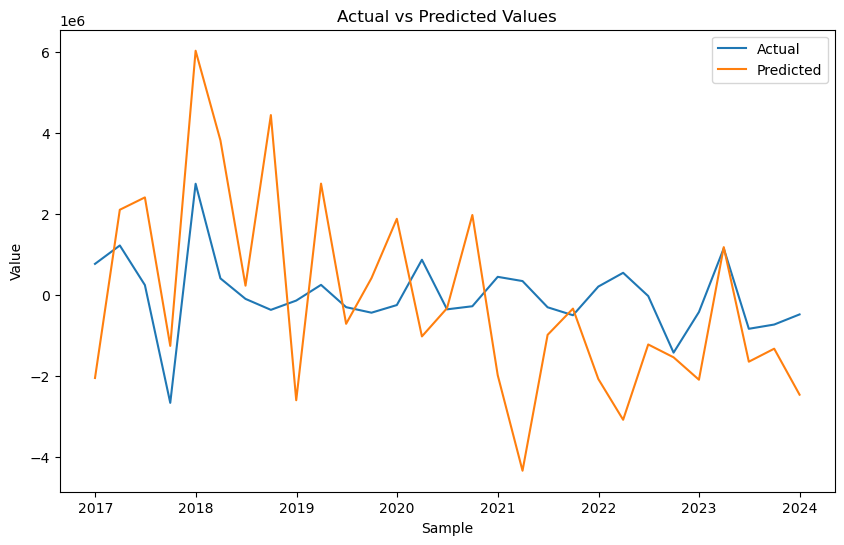

MAPE Przychody finansowe:  859.88 %
Wydatki finansowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - loss: 59113039986688.0000 - mae: 6688269.0000 - val_loss: 92695896784896.0000 - val_mae: 8496407.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 34553636847616.0000 - mae: 5125112.5000 - val_loss: 57345212153856.0000 - val_mae: 6657435.5000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 23790824194048.0000 - mae: 4191560.7500 - val_loss: 36950920658944.0000 - val_mae: 5212316.5000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 13436907945984.0000 - mae: 3028416.2500 - val_loss: 32421602918400.0000 - val_mae: 4878158.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 7183562964992.0000 - mae: 2109284.7500 - val_loss: 36597470855168.0000 - val_mae: 4722745.5000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 5514732765184.0000 - mae: 1726335.3750 - val_loss: 39299365994496.0000 - val_mae: 4604739.5000
Epoch 7/50
2/2 ━━━━━━━━━━━━━━

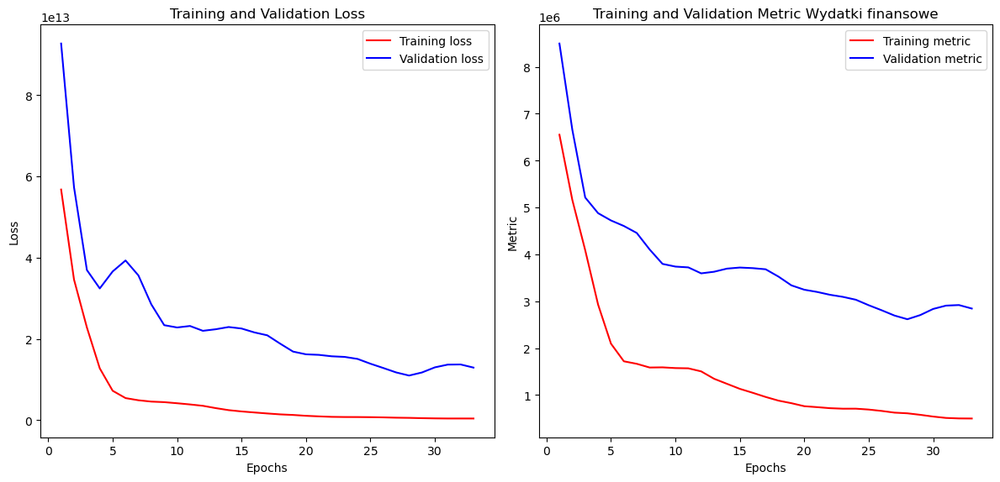

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 477441949696.0000 - mae: 563449.6875 
Test accuracy: 586396.1875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


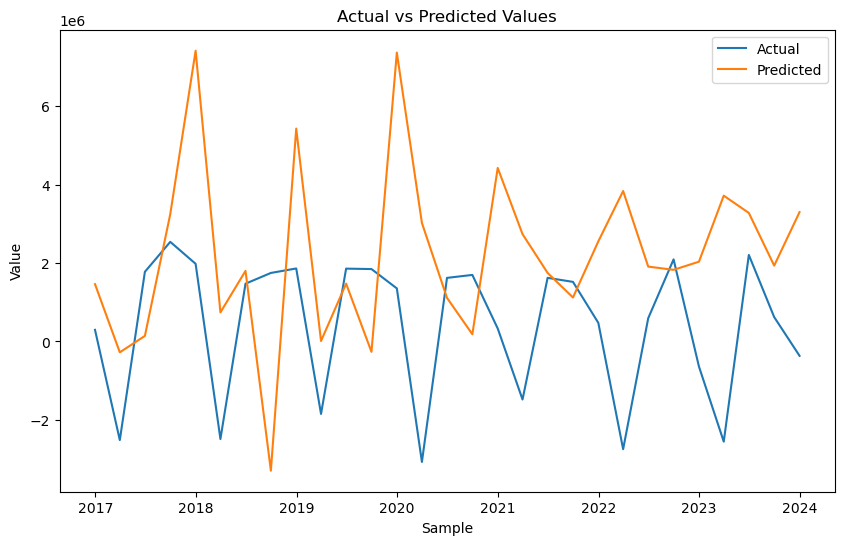

MAPE Wydatki finansowe:  208.01 %
Zysk brutto
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 100287268257792.0000 - mae: 7747838.5000 - val_loss: 206982241845248.0000 - val_mae: 13410575.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 49709477527552.0000 - mae: 5971306.5000 - val_loss: 106299014512640.0000 - val_mae: 9728329.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 24854852009984.0000 - mae: 4555777.5000 - val_loss: 60308257243136.0000 - val_mae: 6447962.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 17249843806208.0000 - mae: 3547360.2500 - val_loss: 48610964144128.0000 - val_mae: 5929766.5000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 17119424020480.0000 - mae: 3553427.7500 - val_loss: 45005037109248.0000 - val_mae: 5649468.5000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 16026287734784.0000 - mae: 3324842.0000 - val_loss: 36878795407360.0000 - val_mae: 4794823.0000
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━

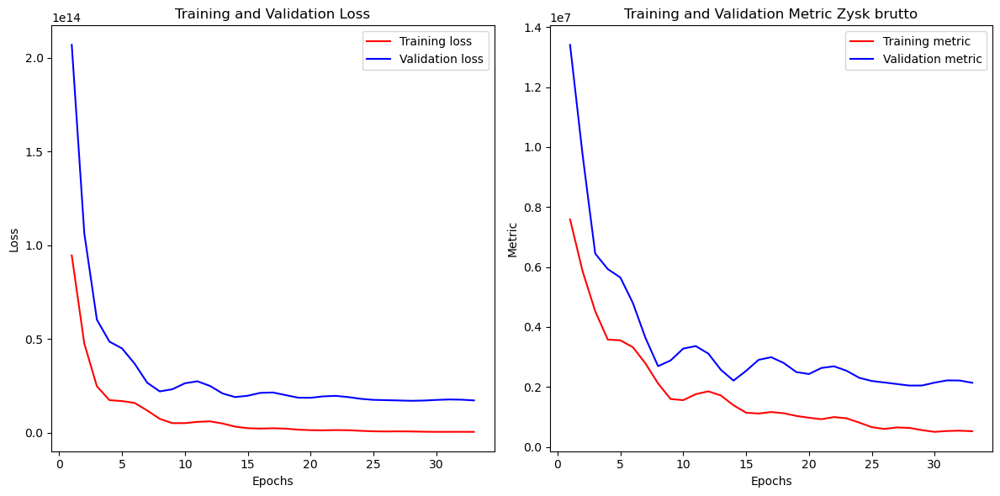

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 562715361280.0000 - mae: 545110.3750 
Test accuracy: 557177.0625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


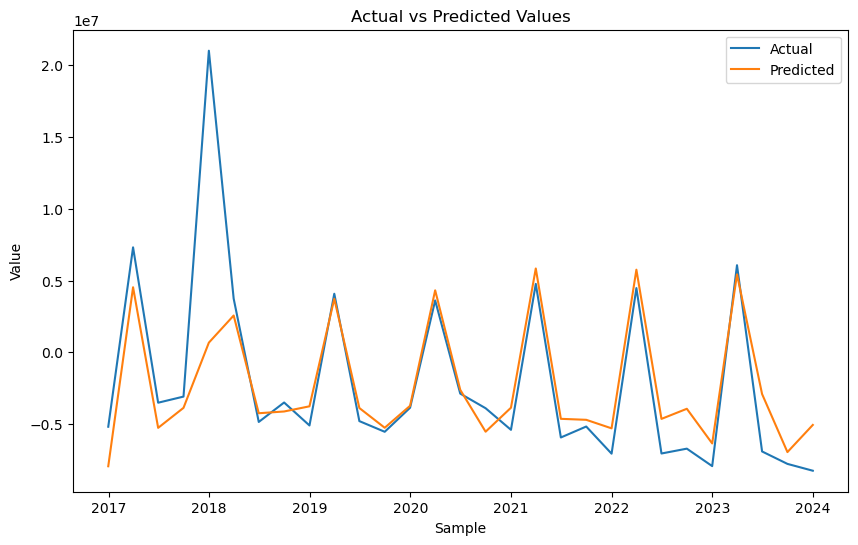

MAPE Zysk brutto:  96.63 %
Aktywa trwałe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 292ms/step - loss: 2475390442405888.0000 - mae: 23321714.0000 - val_loss: 7224516707090432.0000 - val_mae: 51108164.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 1794955953569792.0000 - mae: 19037694.0000 - val_loss: 6285581558480896.0000 - val_mae: 47696164.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1702460208971776.0000 - mae: 19040710.0000 - val_loss: 5356324581801984.0000 - val_mae: 44199172.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 1367726564048896.0000 - mae: 16764157.0000 - val_loss: 4501651591266304.0000 - val_mae: 40807640.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 1235207898267648.0000 - mae: 16953408.0000 - val_loss: 3731722600448000.0000 - val_mae: 37474596.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 1078650300530688.0000 - mae: 16255082.0000 - val_loss: 3066279963394048.0000 - val_mae: 34400988.0000
Epoc

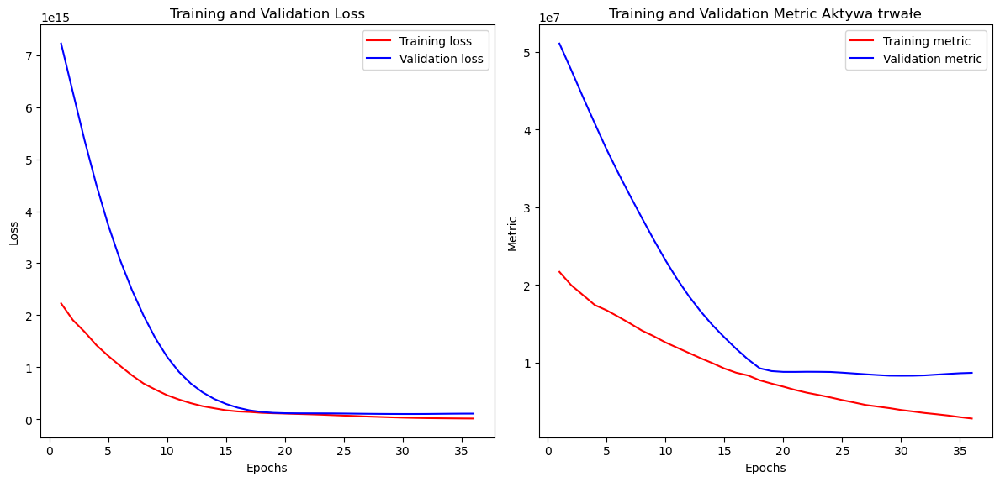

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 23573599092736.0000 - mae: 3553573.7500 
Test accuracy: 3564657.75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


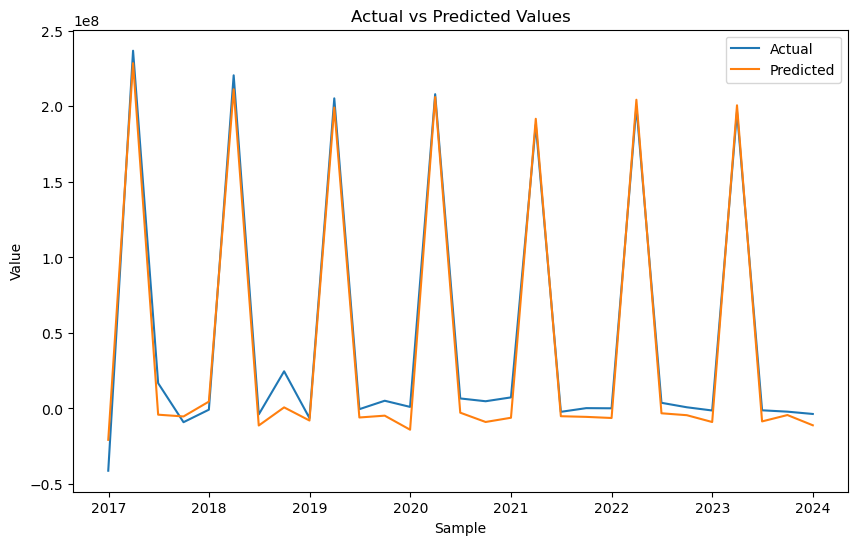

MAPE Aktywa trwałe:  4980.78 %
Aktywa obrotowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 350ms/step - loss: 332428958760960.0000 - mae: 13041166.0000 - val_loss: 842064107405312.0000 - val_mae: 19877912.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 204770350465024.0000 - mae: 10546536.0000 - val_loss: 507668758265856.0000 - val_mae: 15740310.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 122196416528384.0000 - mae: 8230398.5000 - val_loss: 286716111880192.0000 - val_mae: 12235998.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 67259141718016.0000 - mae: 6339339.0000 - val_loss: 167293304700928.0000 - val_mae: 9801640.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 47300512579584.0000 - mae: 5373428.5000 - val_loss: 124026525581312.0000 - val_mae: 8611708.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 39607479566336.0000 - mae: 4915381.5000 - val_loss: 125987706634240.0000 - val_mae: 8129471.0000
Epoch 7/50
2/2 ━━━━━

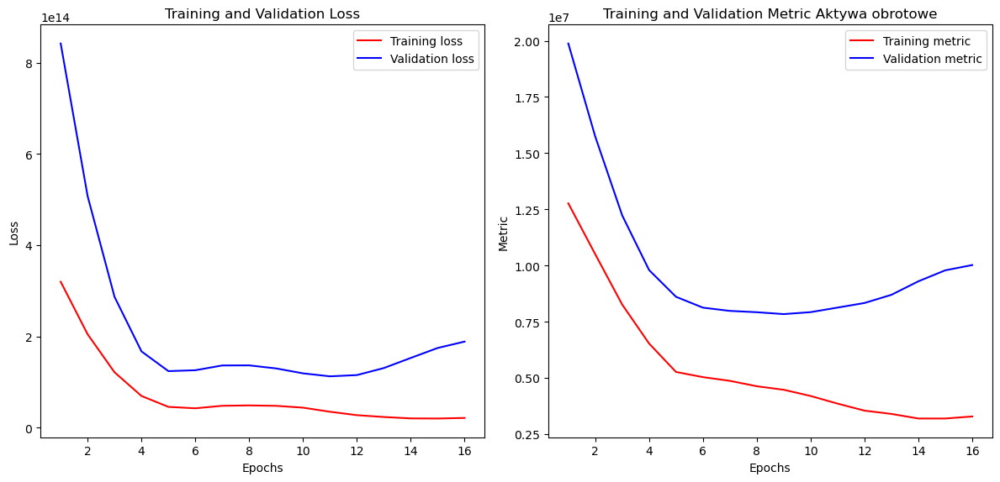

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 24296634187776.0000 - mae: 3256540.2500 
Test accuracy: 3640219.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


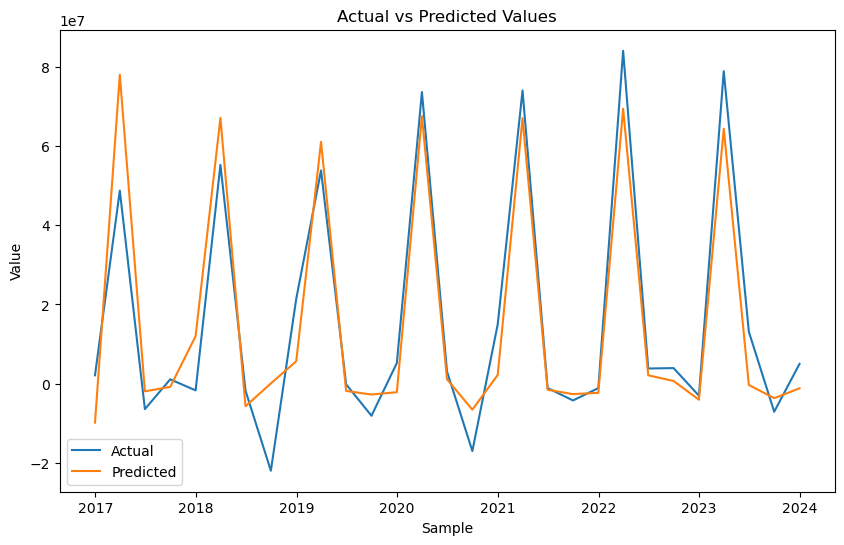

MAPE Aktywa obrotowe:  979.84 %
Kapitał własny ogółem
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 399ms/step - loss: 1531601041227776.0000 - mae: 26431870.0000 - val_loss: 1883151630598144.0000 - val_mae: 29978492.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 1130367209701376.0000 - mae: 22778086.0000 - val_loss: 1338373549588480.0000 - val_mae: 25810360.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 938764759203840.0000 - mae: 21007048.0000 - val_loss: 889690328662016.0000 - val_mae: 21696726.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 671888846094336.0000 - mae: 17822776.0000 - val_loss: 544608866009088.0000 - val_mae: 17688646.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 523099166474240.0000 - mae: 16289442.0000 - val_loss: 290453807169536.0000 - val_mae: 13681724.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 371324518137856.0000 - mae: 13595462.0000 - val_loss: 129804791709696.0000 - val_mae: 9767527.0000


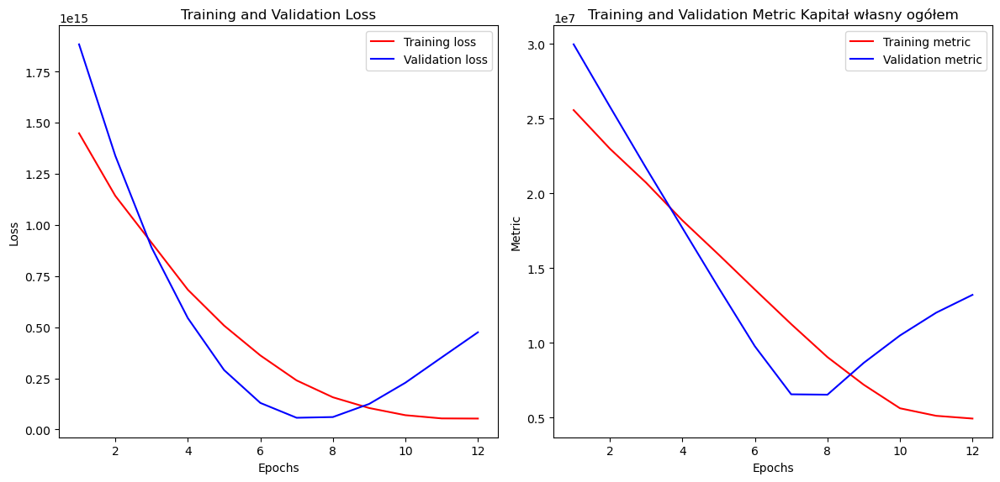

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 177667378774016.0000 - mae: 9580013.0000 
Test accuracy: 9446985.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


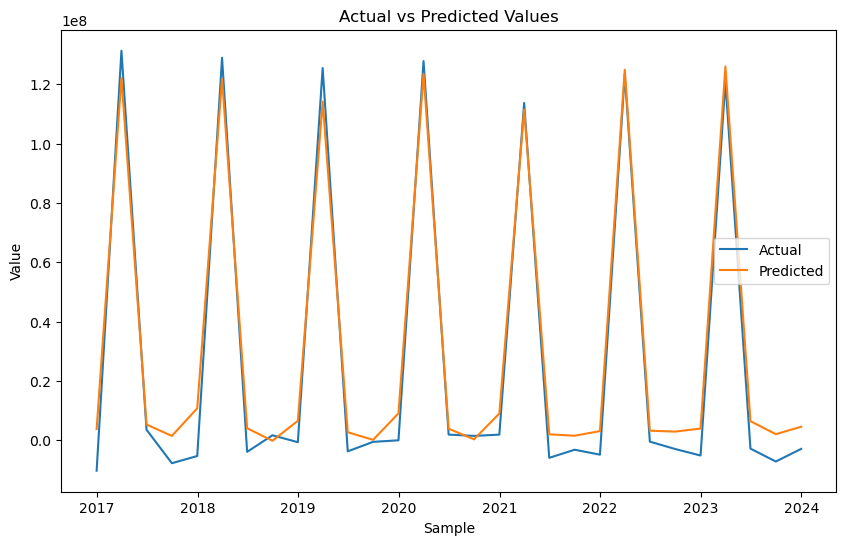

MAPE Kapitał własny ogółem:  9121.08 %
Kapitał własny spółki dominującej
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 343ms/step - loss: 1600523723603968.0000 - mae: 22451138.0000 - val_loss: 2161901450559488.0000 - val_mae: 28431510.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 1178035709542400.0000 - mae: 19404366.0000 - val_loss: 1658811932737536.0000 - val_mae: 25468890.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 1072304956112896.0000 - mae: 18837872.0000 - val_loss: 1209390581415936.0000 - val_mae: 22344668.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 826208027672576.0000 - mae: 16737852.0000 - val_loss: 837961004351488.0000 - val_mae: 19186426.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 697151373967360.0000 - mae: 15495082.0000 - val_loss: 541114843004928.0000 - val_mae: 16002861.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 494246750584832.0000 - mae: 13397569.0000 - val_loss: 317903513583616.0000 - v

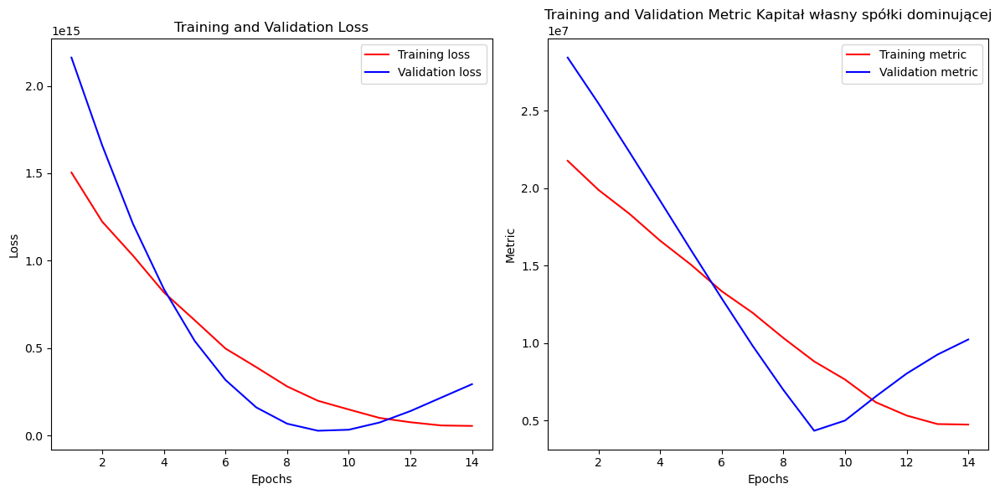

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 159090789580800.0000 - mae: 7789752.0000 
Test accuracy: 7697094.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


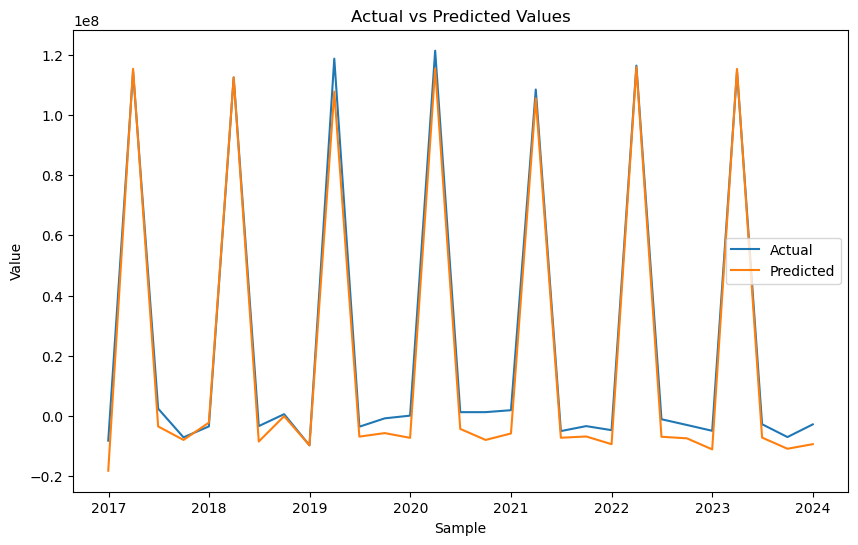

MAPE Kapitał własny spółki dominującej:  2257.5 %
Zobowiązania długoterminowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 274ms/step - loss: 1096344223612928.0000 - mae: 17921266.0000 - val_loss: 4095775839617024.0000 - val_mae: 36777380.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 837896915386368.0000 - mae: 15218378.0000 - val_loss: 3339072395280384.0000 - val_mae: 33927908.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 674803719602176.0000 - mae: 13851483.0000 - val_loss: 2674099251838976.0000 - val_mae: 31346352.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 539244451856384.0000 - mae: 12507439.0000 - val_loss: 2097552639918080.0000 - val_mae: 28869614.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 452428197527552.0000 - mae: 11105699.0000 - val_loss: 1622556771614720.0000 - val_mae: 26513254.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 337197043548160.0000 - mae: 9779512.0000 - val_loss: 1242137156911104.000

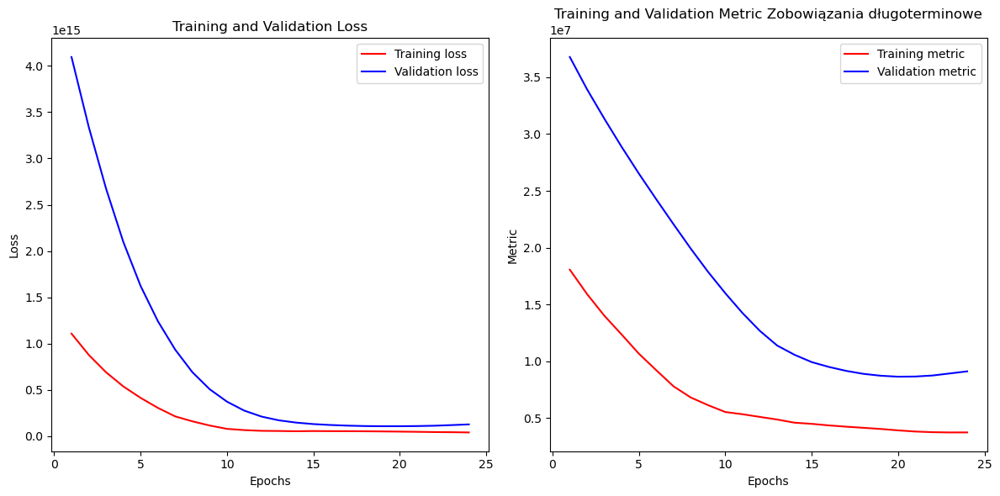

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 51695098789888.0000 - mae: 3883525.0000 
Test accuracy: 3938909.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


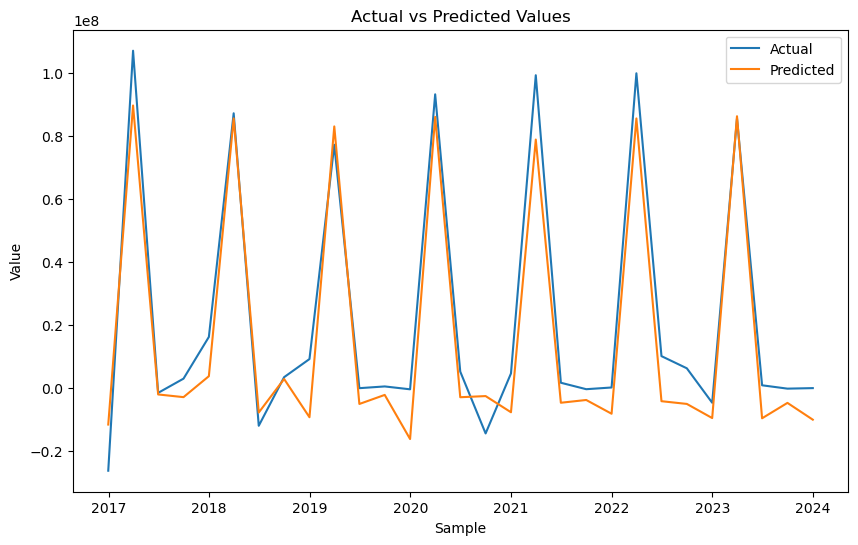

MAPE Zobowiązania długoterminowe:  3415.98 %
Długoterminowe kredyty i pożyczki
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 269ms/step - loss: 424579260481536.0000 - mae: 11396297.0000 - val_loss: 667405772652544.0000 - val_mae: 17010894.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 333033072754688.0000 - mae: 10051972.0000 - val_loss: 419878016122880.0000 - val_mae: 13719200.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 311077401264128.0000 - mae: 9508530.0000 - val_loss: 239682076016640.0000 - val_mae: 10732632.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 238559025954816.0000 - mae: 8284463.5000 - val_loss: 120398771388416.0000 - val_mae: 7976811.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 226308084727808.0000 - mae: 7699561.5000 - val_loss: 49318241239040.0000 - val_mae: 5492795.5000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 222714035961856.0000 - mae: 7184814.5000 - val_loss: 17761650606080.0000 - val_mae: 

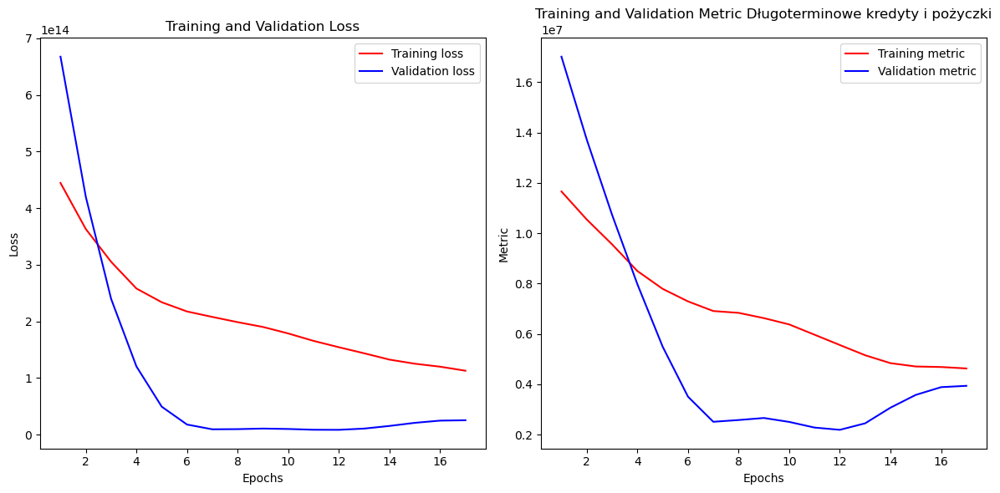

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 99721523757056.0000 - mae: 4232611.0000 
Test accuracy: 5168040.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


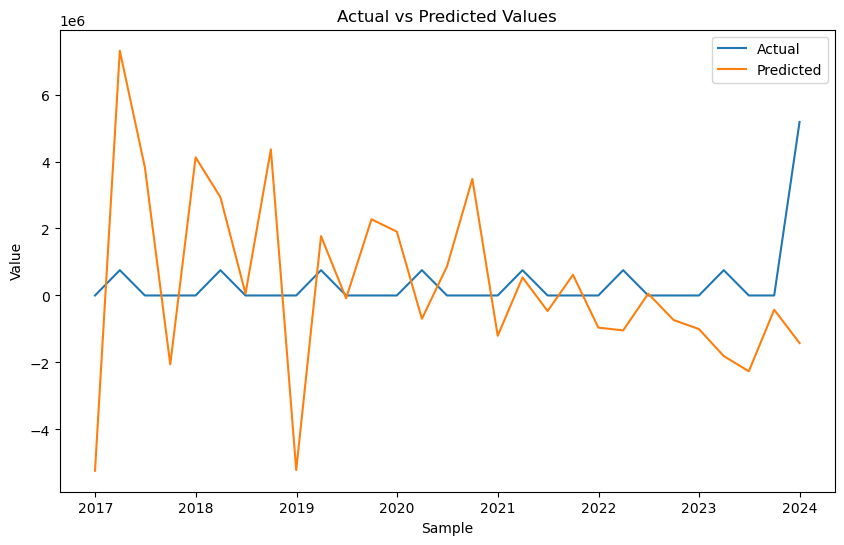

MAPE Długoterminowe kredyty i pożyczki:  inf %
Zobowiązania krótkoterminowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 317ms/step - loss: 187287316987904.0000 - mae: 9543708.0000 - val_loss: 627192530731008.0000 - val_mae: 18269236.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 107045114085376.0000 - mae: 7327641.5000 - val_loss: 416698901463040.0000 - val_mae: 15082534.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 68032911114240.0000 - mae: 6242227.5000 - val_loss: 258259856392192.0000 - val_mae: 12040559.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 32469761916928.0000 - mae: 4376710.0000 - val_loss: 152995291463680.0000 - val_mae: 9450957.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 18998401957888.0000 - mae: 3348987.7500 - val_loss: 89232391536640.0000 - val_mae: 7253958.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 15016415723520.0000 - mae: 3042357.5000 - val_loss: 58024337080320.0000 - val_mae: 5985974.5

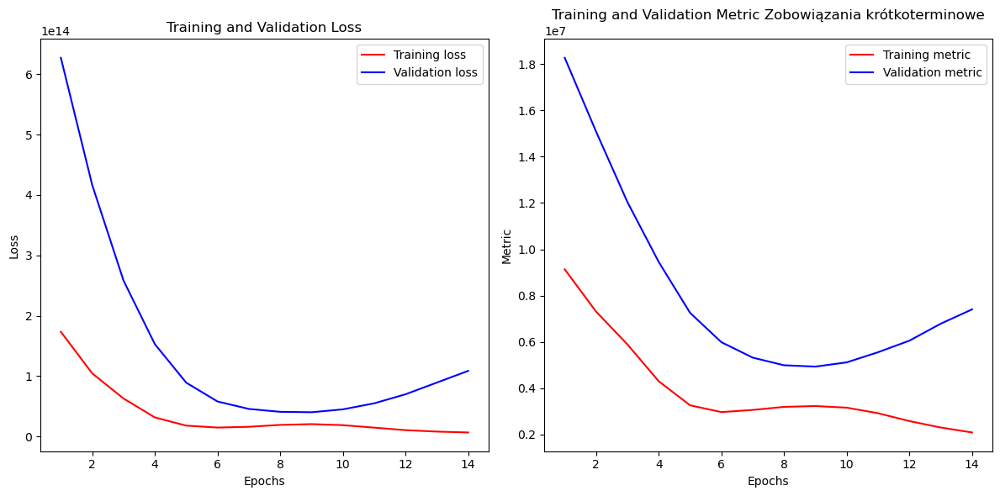

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 16209446699008.0000 - mae: 2982575.7500 
Test accuracy: 3162618.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


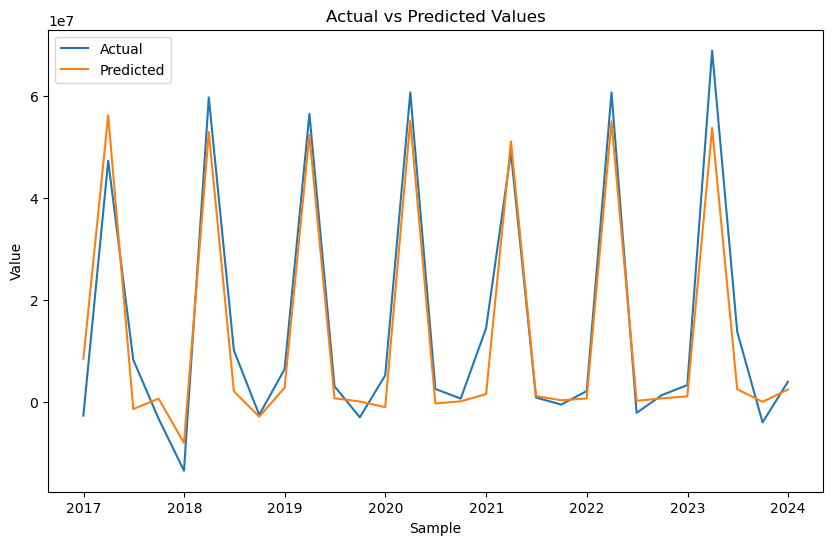

MAPE Zobowiązania krótkoterminowe:  563.73 %
Pożyczki krótkoterminowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - loss: 110785871216640.0000 - mae: 6866648.5000 - val_loss: 251790746451968.0000 - val_mae: 10119534.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 62402389344256.0000 - mae: 5239692.0000 - val_loss: 106244580835328.0000 - val_mae: 7064966.5000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 19968525598720.0000 - mae: 3331711.0000 - val_loss: 32180004716544.0000 - val_mae: 4450495.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 7680490995712.0000 - mae: 2260431.2500 - val_loss: 13119656034304.0000 - val_mae: 2808102.5000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 7835746304000.0000 - mae: 2239453.7500 - val_loss: 25316707794944.0000 - val_mae: 4353398.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 13822842634240.0000 - mae: 2866240.7500 - val_loss: 40567408951296.0000 - val_mae: 5391057.5000
Epoch 7/5

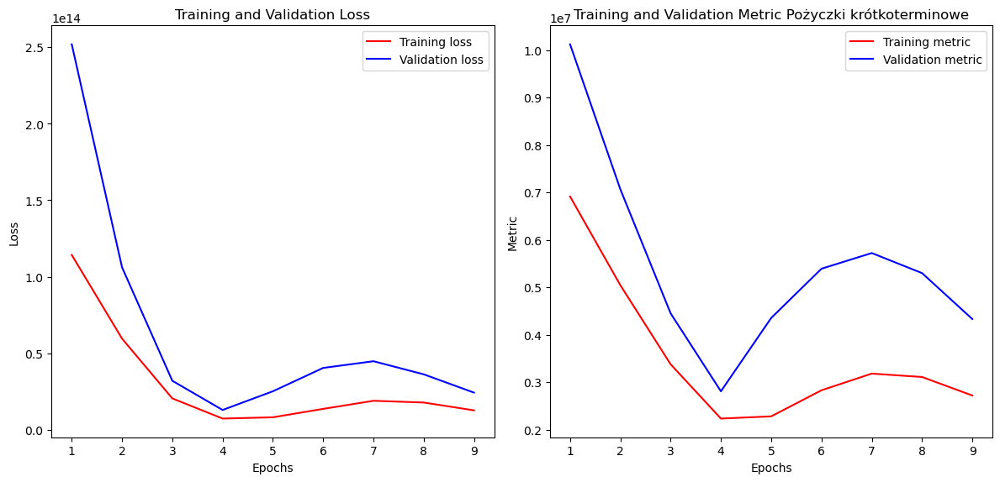

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7421852909568.0000 - mae: 2160268.0000 
Test accuracy: 2135323.25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


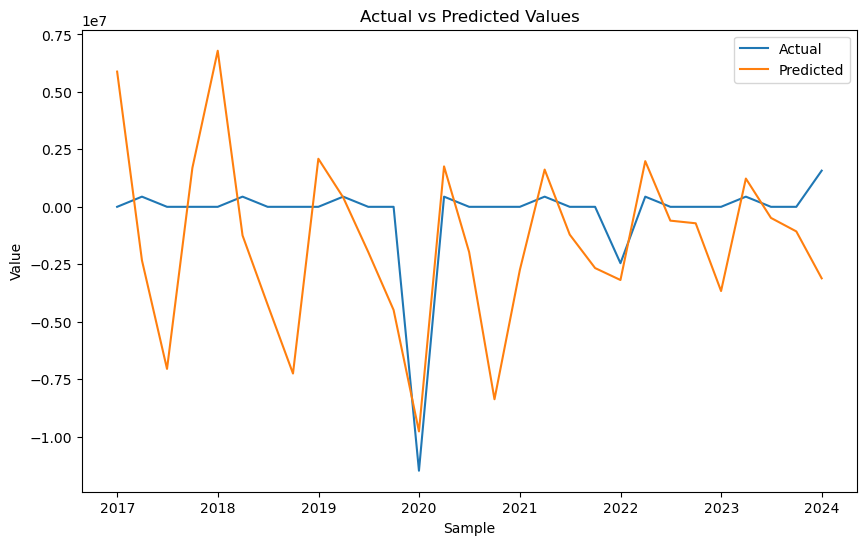

MAPE Pożyczki krótkoterminowe:  inf %
Wynik finansowy (zysk / strata)
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step - loss: 89047137517568.0000 - mae: 5757613.5000 - val_loss: 75140025024512.0000 - val_mae: 6658987.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 35535917678592.0000 - mae: 3570064.0000 - val_loss: 21441527414784.0000 - val_mae: 4303170.5000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 9857750007808.0000 - mae: 1762381.8750 - val_loss: 34483292078080.0000 - val_mae: 5545206.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 7244395577344.0000 - mae: 1634346.8750 - val_loss: 75228256403456.0000 - val_mae: 7499300.5000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 14762623631360.0000 - mae: 2573277.2500 - val_loss: 102586124337152.0000 - val_mae: 8207479.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 20970374955008.0000 - mae: 2947752.2500 - val_loss: 101901412597760.0000 - val_mae: 7921571.5000
Epoch 7/50


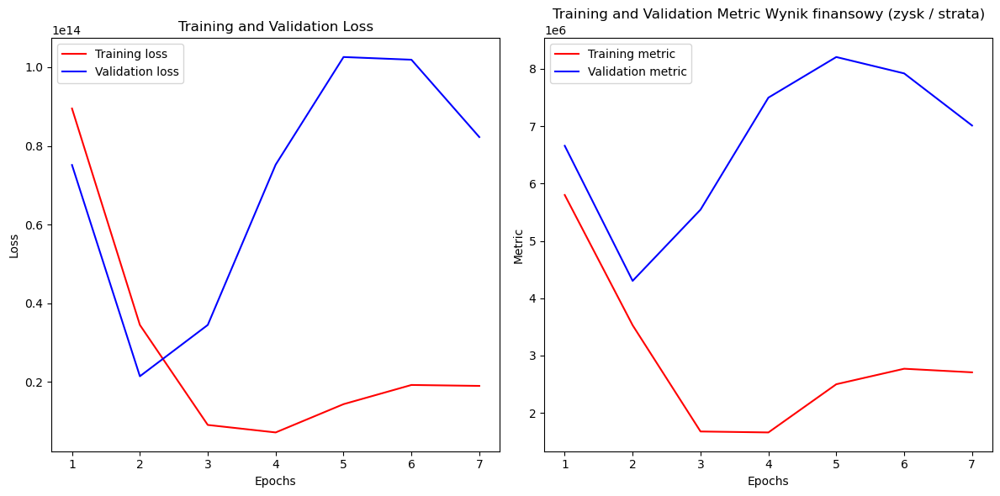

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 10915743268864.0000 - mae: 1884843.6250
Test accuracy: 2012387.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


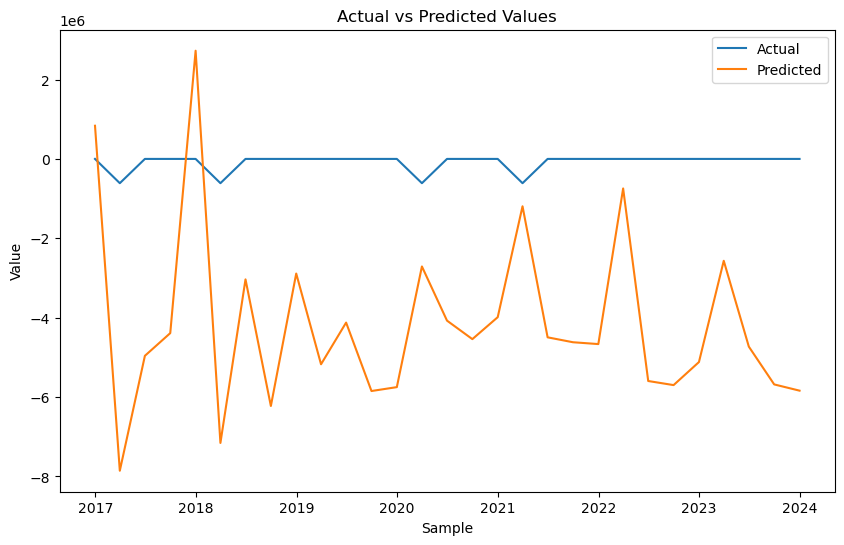

MAPE Wynik finansowy (zysk / strata):  inf %


In [16]:
#Sieć neuronowa
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping



for i in list(random_forest_mol.columns):
    print(f"{i}")
    labels = random_forest_mol[f"{i}"]
            
    features = random_forest_mol
    train_l = labels[:43]
    test_l = labels[44:]
            
    train_f = features[:43]
    test_f = features[44:]
    
    
    early_stopping = EarlyStopping(monitor='val_loss', # Metryka monitorowana (wartość funkcji straty na zbiorze walidacyjnym)
                                   patience=5, # Liczba epok bez poprawy, po których trenowanie zostanie zatrzymane
                                   verbose=1, # Poziom szczegółowości komunikatów
                                   restore_best_weights=True)
    
    model = keras.Sequential([
        keras.layers.Dense(128, activation='relu', input_shape=(features.shape[1],)), # Warstwa ukryta z 128 neuronami
        keras.layers.Dense(1) ])
    
    
    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
    
    
    
    history = model.fit(train_f, train_l, epochs=50, callbacks=[early_stopping], validation_data=(test_f, test_l))
    
    def plot_learning_curves(history):
        # Pobranie wartości funkcji straty dla zbioru treningowego i walidacyjnego
        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        
        # Pobranie wartości metryki (np. dokładności) dla zbioru treningowego i walidacyjnego (jeśli dostępne)
        if 'accuracy' in history.history:
            train_metric = history.history['accuracy']
            val_metric = history.history['val_accuracy']
        elif 'mae' in history.history:
            train_metric = history.history['mae']
            val_metric = history.history['val_mae']
        else:
            print("Nie można znaleźć metryki. Sprawdź, czy model jest skonfigurowany do monitorowania odpowiednich metryk.")
            return
        
        # Wygenerowanie krzywych uczenia się
        epochs = range(1, len(train_loss) + 1)
        plt.figure(figsize=(12, 6))
        
        # Wykres funkcji straty
        plt.subplot(1, 2, 1)
        plt.plot(epochs, train_loss, 'r-', label='Training loss')
        plt.plot(epochs, val_loss, 'b-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        
        # Wykres metryki
        plt.subplot(1, 2, 2)
        plt.plot(epochs, train_metric, 'r-', label='Training metric')
        plt.plot(epochs, val_metric, 'b-', label='Validation metric')
        plt.title(f'Training and Validation Metric {i}')
        plt.xlabel('Epochs')
        plt.ylabel('Metric')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
        
    plot_learning_curves(history)
    
    
    # Ocena modelu
    test_loss, test_acc = model.evaluate(train_f, train_l)
    print('Test accuracy:', test_acc)
    actual_values = test_l
    # Przewidywane wartości
    predictions = model.predict(test_f)
    predictions = pd.DataFrame(predictions, index=actual_values.index)
    
    # Rzeczywiste wartości
    
    
    # Wykres prognoz vs rzeczywistość
    plt.figure(figsize=(10, 6))
    plt.plot(actual_values, label='Actual')
    plt.plot(predictions, label='Predicted')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('Actual vs Predicted Values')
    plt.legend()
    plt.show()
    def mean_absolute_percentage_error(y_true, y_pred):
        """
        Oblicza średnią bezwzględną błędu procentowego (MAPE).
    
        Parametry:
        y_true : array-like
            Rzeczywiste wartości.
        y_pred : array-like
            Prognozowane wartości.
    
        Zwraca:
        mape : float
            Wartość MAPE.
        """
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    
    mape = mean_absolute_percentage_error(actual_values[:-1], predictions[:-1])
    print(f"MAPE {i}: ", round(mape,2),"%")


In [75]:
test_f

,Przychody ogółem,Zysk brutto ze sprzedaży,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Długoterminowe kredyty i pożyczki,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe,Wynik finansowy (zysk / strata)
Date,,,,,,,,,,,,,,,,
2016-12-31,-60161908,-24985548.0,-8438316,-2395209.0,772085,297011,-5187769,-41226999,2133098,-10237734,-8195135,-26249560,0.000000e+00,-2606607,0.000000e+00,0.00
2017-03-31,55110837,22297181.0,8515332,11349068.0,1227046,-2513000,7311678,236837933,48703245,131307550,114426510,106936799,7.555520e+05,47296829,4.424681e+05,-611364.25
2017-06-30,-48622498,-22376520.0,-5583202,-8288372.0,248496,1776023,-3513324,16741454,-6393863,3577827,2438901,-1559136,0.000000e+00,8328900,0.000000e+00,0.00
2017-09-30,-51812273,-22518885.0,-2933248,-6379714.0,-2660039,2539592,-3087524,-9099182,1113665,-7704100,-7105266,2946070,0.000000e+00,-3227487,0.000000e+00,0.00
2017-12-31,-52665392,-24493414.0,18610782,26357154.0,2751589,1980385,21012526,-824339,-1673557,-5276177,-3476125,16176865,0.000000e+00,-13398584,0.000000e+00,0.00
2018-03-31,49818699,21916688.0,5870032,8628274.0,413675,-2486343,3737205,220561584,55197464,128945613,112407974,87099681,7.555520e+05,59713754,4.424681e+05,-611364.25
2018-06-30,-52141668,-22950913.0,-6284707,-9191195.0,-92594,1473260,-4854463,-3953669,-1753468,-3883142,-3371311,-11996212,0.000000e+00,10172217,0.000000e+00,0.00
2018-09-30,-28928049,-15282830.0,-4933882,-6603487.0,-363499,1747062,-3499153,24597768,-21935264,1710065,589683,3420240,0.000000e+00,-2467801,0.000000e+00,0.00
2018-12-31,-51623584,-33189569.0,-7476379,-10287044.0,-134232,1861335,-5099179,-6379515,21396196,-631310,-9754398,9162653,0.000000e+00,6485338,0.000000e+00,0.00


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


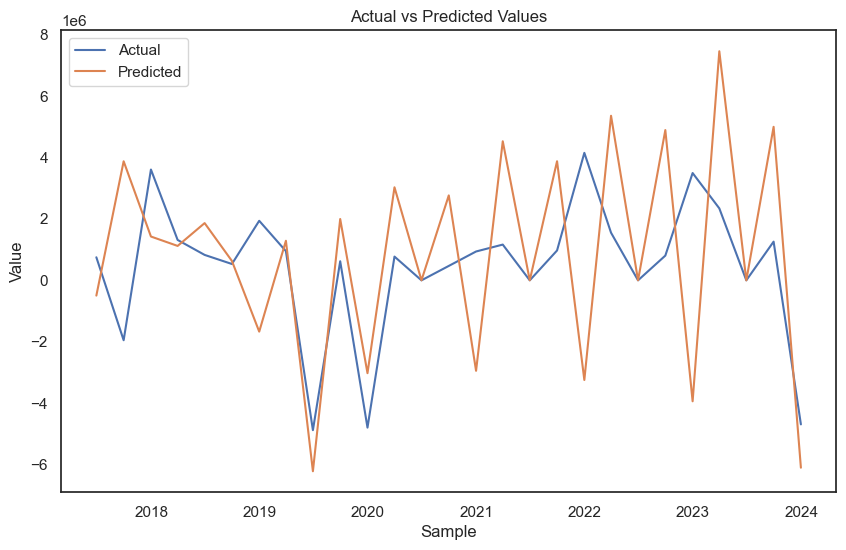

In [52]:
import matplotlib.pyplot as plt

# Przewidywane wartości
predictions = model.predict(test_f[-43:])
predictions = pd.DataFrame(predictions, index=actual_values.index)

# Rzeczywiste wartości
actual_values = test_l[:44]

# Wykres prognoz vs rzeczywistość
plt.figure(figsize=(10, 6))
plt.plot(actual_values, label='Actual')
plt.plot(predictions, label='Predicted')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """

    df = pd.DataFrame(data={"y_true":y_true[0],"y_pred":y_pred[0]}, index=y_true.index)
    df_filtered = df[df['y_true'] != 0]
    y_true, y_pred = np.array(df_filtered['y_true']), np.array(df_filtered['y_pred'])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(actual_values[:-1], predictions[:-1])
print(f"MAPE {i}: ", round(mape,2),"%")